# Experiment: ADLO (v3a) - Spatial Accuracy / Information Flow

CNNs are not good at passing spatial information around, but I want to use a CNN for just that. There's a few ways of augmenting the basic CNN architecture for spatial information flow. This notebook looks at the accuracy obtained against a simple problem and when using different low-level solutions.

## Results & Theories
### 2x2 One-hot Encoding
Surprisingly, the pure CNN architectures are able to identify the single corner location to within 1 to 3px. So it's possible for an unmodified CNN to convey spatial information. The question is how.

Take a single 2x2 patch that will become 1x1 following maxpool. One theory is that it can use 4 channels to encode the same feature, but at each of the 4 offsets. Only one will have the best match. Max-pool will convert the 2x2x4 patch into 1x1x4, with the channel with the highest value indicating its corresponding source position as the location of the feature. In other words, _one-hot encoding_.

In order to retain full accuracy in the next block, it will take another 2x2 grid of 4 channels, but multiplied by the 4-channel input, giving 16 channels in the new one-hot encoding. Or, put another way, the next block's maxpool output has 4x4=16 possible sources, so needs to encode with 16channels for one-hot encoding.

Thus, in theory, a network with blocks of the form (1conv + 1maxpool), with stride $s$, require an exponential increase in the number of channels ($c$) at each block ($b \in 1,..,B$), as follows:
$$
c = s^{2b}
$$

If there's less than that, then the accuracy will be _clipped_. For example, if we restrict to 16 channels throughout, then the final block will only identify the grid-cell in the second-to-last block, without identifying where in that grid-cell.

### 2x2 One-hot Encoding with Compression
For the more common conv network with multiple conv layers before block, it may be able to compress the encoding. For example, a 4-channel one-hot encoding can be easily compressed into a single channel having values in 4 ranges. You convert the one-hot encoding to so called "sparse encoding" (ie: argmax) and divide by 4.

There's a few ways to achieve this. One is by thresholding at the one-hot encoding layer (with the hope of having only a single channel still non-zero), multiplying by different weights and summing. Another is to acknowledge that the channels are probably already fairly well globally normalised because the same weights are used at all positions, and because backprop could induce that outcome if the loss surface implies it. And also to acknowledge that in this simple experiment, non-matches are probably very close to zero. At that point, you can simply assume they're close enough to perfectly 0.0 or 1.0, and then just sum them with different weights. For example, if the channels are a, b, c, d, then the equivalent 1-channel encoding is produced via:
$$
  \text{value} = 1a + 2b + 3c + 4d
$$

That can be done in a single conv layer, leaving the activation function available for part of any other processing.

Conceivably, this architecture could work with a very small number of channels.

In [1]:
# Clone repo and load its modules
import os
import sys
if os.path.isdir('repo'):
  # discard any local changes and update
  !cd repo && git reset --hard HEAD
  !cd repo && git fetch
else:
  !git clone https://github.com/malcolmlett/robovac.git repo

# lock to revision
#!cd repo && git checkout be28234
!cd repo && git pull
sys.path.append('repo')

# Install Training Instrumentation Toolkit
# (locked to specific git revision so this notebook always works)
if not os.path.isdir('training-instrumentation-toolkit'):
  !git clone https://github.com/malcolmlett/training-instrumentation-toolkit.git
  !cd training-instrumentation-toolkit && git checkout 550ac65
sys.path.append('training-instrumentation-toolkit')

from general_utils import display_history
import lds
import slam_models
import slam_data
import slam_operations
import train_instrumentation as tinstr
from importlib import reload
reload(lds)
reload(slam_models)
reload(slam_data)
reload(slam_operations)

Cloning into 'repo'...
remote: Enumerating objects: 936, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 936 (delta 30), reused 29 (delta 29), pack-reused 903 (from 1)
Receiving objects: 100% (936/936), 125.36 MiB | 11.71 MiB/s, done.
Resolving deltas: 100% (516/516), done.
Updating files: 100% (59/59), done.
Already up to date.
Cloning into 'training-instrumentation-toolkit'...
remote: Enumerating objects: 1645, done.
remote: Counting objects: 100% (205/205), done.
remote: Compressing objects: 100% (148/148), done.
remote: Total 1645 (delta 135), reused 109 (delta 57), pack-reused 1440 (from 2)
Receiving objects: 100% (1645/1645), 247.86 MiB | 15.62 MiB/s, done.
Resolving deltas: 100% (992/992), done.
Updating files: 100% (23/23), done.
Note: switching to '550ac65'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state wit

<module 'slam_operations' from '/content/repo/slam_operations.py'>

In [2]:
# Load standard libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
import IPython.display as idisplay
import os
import sys
import math
import tqdm
import time
from timeit import default_timer as timer
import cv2
import re

print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tf.keras.__version__}")
print(f"Python version: {sys.version}")

TensorFlow version: 2.18.0
Keras version: 3.8.0
Python version: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]


## Helpful Functions

In [3]:
def predict_all(model, dataset):
  preds = model.predict(dataset)
  return preds

def quick_show_preds(model, dataset):
  preds = predict_all(model, dataset)

  print(f"pred.x: {np.min(preds[:,0])}..{np.max(preds[:,0])}")
  print(f"pred.y: {np.min(preds[:,1])}..{np.max(preds[:,1])}")

  plt.figure(figsize=(5,2), layout='constrained')
  plt.subplot(1, 2, 1)
  plt.title("pred.x")
  plt.hist(preds[:,0], bins=20)
  plt.ylabel('histogram')

  plt.subplot(1, 2, 2)
  plt.title("pred.y")
  plt.hist(preds[:,1], bins=20)
  plt.ylabel('histogram')

  plt.show()

# Assuming one-hot-encoding theory and no representational compression
# using s^(2b) to calculate required number of channels for perfect resolution:
def calculate_onehotencoding_theory(strides, blocks, max_channels):
  s=strides
  b=blocks
  f=max_channels
  eff_b=math.log(f)/math.log(s)/2
  eff_res=149/(2**eff_b)
  print(f"Assuming one-hot-encoding theory and no representational compression:")
  print(f"  Required channels in last block for perfect resolution:  {s**(2*b):,}")
  print(f"  Effective resolution at {f} channels (in blocks):        {eff_b}")
  print(f"  Effective resolution at {f} channels (in pixels):        {eff_res}")
calculate_onehotencoding_theory(strides=2, blocks=7, max_channels=128)

Assuming one-hot-encoding theory and no representational compression:
  Required channels in last block for perfect resolution:  16,384
  Effective resolution at 128 channels (in blocks):        3.5
  Effective resolution at 128 channels (in pixels):        13.169863799599447


In [4]:
def index_layers_by_name_pattern(model, name_pattern):
    return [l_idx for l_idx, layer in enumerate(model.layers) if re.fullmatch(name_pattern, layer.name)]

def coords_to_rgb(coord_grid):
    coord_grid = coord_grid + 0.5
    blue = 1.0 - tf.sqrt(tf.reduce_sum(tf.square(coord_grid), axis=-1))
    blue = tf.clip_by_value(blue, 0.0, 1.0)  # gives a stronger distinction than RMS or simple mean
    return tf.stack([coord_grid[..., 0], coord_grid[..., 1], blue], axis=-1)

def flatten_channels(tensor, reduction='pos-norm'):
  if reduction == 'norm':
    return tf.sqrt(tf.reduce_mean(tf.square(tensor), axis=-1))
  elif reduction == 'pos-norm':
    tensor = tf.clip_by_value(tensor, 0.0, float('inf'))
    return tf.sqrt(tf.reduce_mean(tf.square(tensor), axis=-1))
  else:
    raise ValueError(f"Invalid reduction: {reduction}")

def plot_layers(model, dataset, layer_filter, has_coord_channels=False, has_coord_layers=None, num=1):
    """
    Args:
      - has_coord_layers - included for backwards compatibility. Wrong name. If specified, overrides has_coord_channels.
    """
    if has_coord_layers is not None:
        has_coord_channels = has_coord_layers
    layer_indices = index_layers_by_name_pattern(model, layer_filter)

    # prepare model
    monitoring_model = tf.keras.Model(
        inputs=tinstr._original_inputs(model),
        outputs=[model.outputs] + [layer.output for layer in model.layers])

    # do prediction
    dataset = dataset.take(num).batch(num)
    data = next(iter(dataset))[0]
    out = monitoring_model(data)
    prediction = out[0][0]
    layer_outputs = out[1:]
    print(f"prediction:      {prediction}")
    print(f"all layers:      {[t.shape for t in layer_outputs]}")
    print(f"filtered layers: {[layer_outputs[l_idx].shape for l_idx in layer_indices]}")

    coord_layer = None
    coord_grid_indices = index_layers_by_name_pattern(model, r'coord_grid2d_.*')
    if has_coord_channels and len(coord_grid_indices) > 0:
        coord_layer = layer_outputs[coord_grid_indices[0]]

    cols = 1 + len(layer_indices)
    if coord_layer is not None:
        cols += 1
    rows = num * 2 if has_coord_channels else num

    plt.figure(figsize=(15, 2 * rows), layout='constrained')

    for idx in range(num):
        row = idx * 2 if has_coord_channels else idx
        col = 0
        plt.subplot(rows, cols, 1 + (row * cols) + col)
        plt.title(f"input (data #{idx})")
        plt.imshow(data[idx, :, :, 0])
        plt.axis('off')

        if has_coord_channels:
            if coord_layer is not None:
                col += 1
                plt.subplot(rows, cols, 1 + (row * cols) + col)
                plt.title(f"coord")
                plt.imshow(coords_to_rgb(coord_layer[idx, :, :, -2:]))
                plt.axis('off')

            for l_idx in layer_indices:
                layer = model.layers[l_idx]
                layer_data = layer_outputs[l_idx]
                col += 1
                plt.subplot(rows, cols, 1 + (row * cols) + col)
                plt.title(f"{layer.name}")
                plt.imshow(coords_to_rgb(layer_data[idx, :, :, -2:]))
                plt.axis('off')

        row = (idx * 2 + 1) if has_coord_channels else idx
        col = 0
        plt.subplot(rows, cols, 1 + (row * cols) + col)
        plt.imshow(data[idx, :, :, 0])
        plt.axis('off')

        if coord_layer is not None:
            col += 1
            plt.subplot(rows, cols, 1 + (row * cols) + col)
            plt.imshow(flatten_channels(data[idx]))
            plt.axis('off')

        for l_idx in layer_indices:
            layer = model.layers[l_idx]
            layer_data = layer_outputs[l_idx]
            if has_coord_channels:
                layer_data = layer_data[..., :-2]
            col += 1
            plt.subplot(rows, cols, 1 + (row * cols) + col)
            plt.imshow(flatten_channels(layer_data[idx]))
            plt.axis('off')

## Dataset
As an experiment, I'm going to create the basic dataset as just the corner coordinates, and then use an online mapper to generate the actual images on-demand. With `Dataset.prefetch()` this should get cached nicely.

Images are a fixed `149x149x1` (grayscale), but I'm going to represent all coordinates as a fraction of the image width, relative to its centre. ie: x, y both in range `-0.5 .. +0.5`.

Image centre is always at `149 // 2`.

In [5]:
# Random positions (as percentages of image width relative to centre)
corner_coords = tf.random.uniform(shape = (100,2), minval = -0.4, maxval = +0.4)
train_data = tf.data.Dataset.from_tensor_slices(corner_coords)

image shape: (149, 149, 1), val range: 0.0 .. 1.0


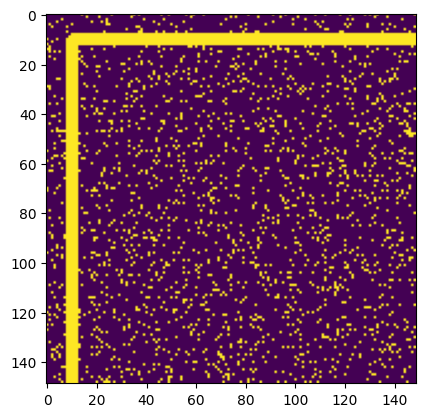

In [6]:
def generate_training_image(x, y):
    img = np.zeros((149, 149), dtype=np.uint8)

    # Add speckled noise
    noise_density = 0.1  # Adjust for more/less speckles
    num_noise_pixels = int(noise_density * img.size)
    xs = np.random.randint(0, 149, num_noise_pixels)
    ys = np.random.randint(0, 149, num_noise_pixels)
    img[ys, xs] = 255

    # Draw vertical line (down from (x, y))
    cv2.line(img, (x, y), (x, 148), 255, thickness=3)

    # Draw horizontal line (right from (x, y))
    cv2.line(img, (x, y), (148, y), 255, thickness=3)

    # Rescale value to 0.0 .. 1.0
    # Add channel dimension for grayscale
    return img[..., np.newaxis] / 255.0

im = generate_training_image(10,10)
print(f"image shape: {np.shape(im)}, val range: {np.min(im)} .. {np.max(im)}")
plt.imshow(im)
plt.show()

In [7]:
# doesn't work once trying to train the model
# def to_training_sample(corner_coord):
#   abs_coord = tf.cast(corner_coord * 149 + 149//2, tf.int32)
#   image = tf.py_function(func=lambda coord: generate_training_image(coord[0].numpy(), coord[1].numpy()), inp=[abs_coord], Tout=tf.float32)
#   return image, corner_coord

# dataset = train_data.map(to_training_sample)
# dataset

In [8]:
# Alternative dataset creation if above fails
def create_dataset(n=1000):
  corner_coords = tf.random.uniform(shape = (n,2), minval = -0.1, maxval = +0.4)
  images = []
  for corner_coord in tqdm.tqdm(corner_coords):
    abs_coord = np.array(corner_coord * 149 + 149//2, dtype=np.int32)
    image = generate_training_image(abs_coord[0], abs_coord[1])
    images.append(tf.constant(image, tf.float32))
  dataset = tf.data.Dataset.from_tensor_slices((images, corner_coords))
  return dataset

train_data = create_dataset(1000)

100%|██████████| 1000/1000 [00:01<00:00, 775.21it/s]


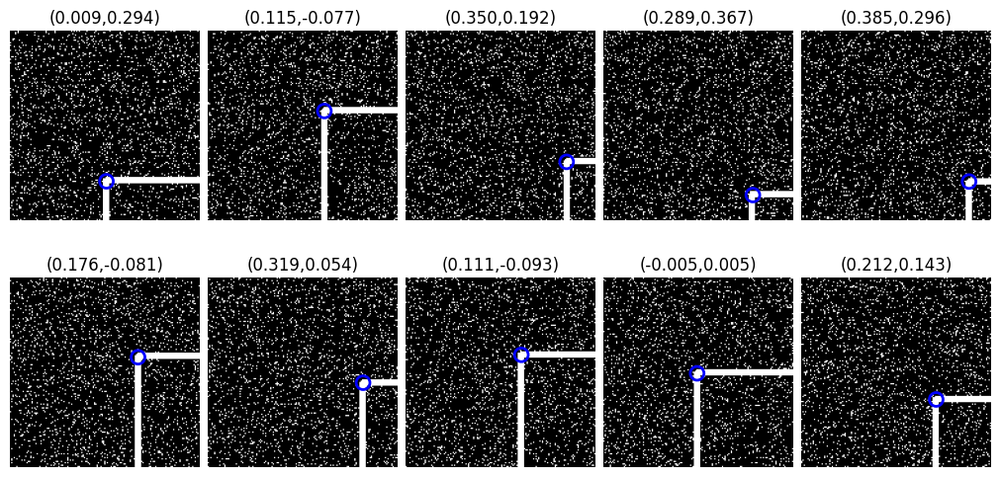

In [9]:
def plot_dataset_entry(image, corner_coords):
  abs_coords = corner_coords * 149 + 149//2
  plt.imshow(image, cmap='gray')
  plt.scatter(abs_coords[0], abs_coords[1], s=100, edgecolors='b', facecolors='none', linewidth=2)
  plt.axis('off')

def plotadd_pred_coord(pred_coords):
  edge_x = -0.5 if pred_coords[0] < -0.5 else +0.5 if pred_coords[0] > 0.5 else None
  edge_y = -0.5 if pred_coords[1] < -0.5 else +0.5 if pred_coords[1] > 0.5 else None

  if edge_x is not None or edge_y is not None:
    if edge_x is not None:
      edge_x = edge_x * 149 + 149//2
      plt.plot([edge_x, edge_x], [0, 148], color='r', linewidth=2)
    if edge_y is not None:
      edge_y = edge_y * 149 + 149//2
      plt.plot([0, 148], [edge_y, edge_y], color='r', linewidth=2)
  else:
    abs_coords = pred_coords * 149 + 149//2
    plt.scatter(abs_coords[0], abs_coords[1], s=80, edgecolors='r', facecolors='none', linewidth=2)
  plt.plot(0, 0, 149, 149, color='r', linewidth=2)


def plot_dataset(dataset, model=None, n=10):
  cols = min(5,n)
  rows = math.ceil(n/cols)
  plt.figure(figsize=(10,5), layout='constrained')
  taken = dataset.take(n)

  if model is not None:
    predicted = model.predict(taken.map(lambda image, coords: image).batch(n))
    for i, (image, corner_coords) in enumerate(taken):
      pred_coords = predicted[i,:]
      plt.subplot(rows, cols, i+1)
      plt.title(f"true: ({corner_coords[0]:.3f},{corner_coords[1]:.3f})\npred: ({pred_coords[0]:.3f},{pred_coords[1]:.3f})")
      plot_dataset_entry(image, corner_coords)
      plotadd_pred_coord(pred_coords)

  else:
    for i, (image, corner_coords) in enumerate(taken):
      plt.subplot(rows, cols, i+1)
      plt.title(f"({corner_coords[0]:.3f},{corner_coords[1]:.3f})")
      plot_dataset_entry(image, corner_coords)
  plt.show()

#image, corner_coords = next(iter(train_data))
#plot_dataset_entry(image, corner_coords)
plot_dataset(train_data)
#plot_dataset(train_data, fullconv_model())


## Custom Layers

symbolic output: <class 'keras.src.backend.common.keras_tensor.KerasTensor'>, shape: (None, 32, 32, 2)
actual output: <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 32, 32, 2)


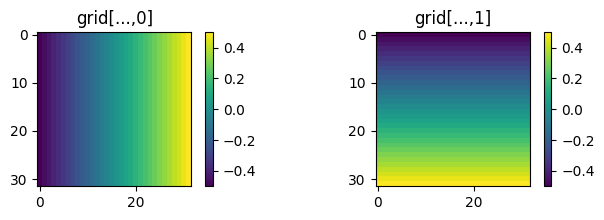

In [10]:
# Based on R. Liu et al., “An Intriguing Failing of CNNs and the CoordConv Solution,” NeurIPS 2018
# https://arxiv.org/abs/1807.03247
class CoordGrid2D(layers.Layer):
    """
    Returns a (batch_size, height, width, 2) tensor with a grid of (x,y) coordinates.
    Generally this will be subsequently concatenated with the input tensor.
    """
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, inputs):
        # inputs.shape => [batch_size, height, width, channels]
        batch_size, height, width, channels = tf.unstack(tf.shape(inputs))

        # Generate a coordinate grid:
        # - x_coords: shape (width,) from -0.5 to 0.5
        # - y_coords: shape (height,) from -0.5 to 0.5
        x_coords = tf.linspace(-0.5, 0.5, width)
        y_coords = tf.linspace(-0.5, 0.5, height)

        # Use meshgrid to get 2D coordinate maps
        # - xx, yy shape => (height, width)
        xx, yy = tf.meshgrid(x_coords, y_coords)

        # Reshape for appending as channels
        xx = tf.expand_dims(xx, axis=-1)  # (height, width, 1)
        yy = tf.expand_dims(yy, axis=-1)  # (height, width, 1)

        # Tile across batch dimension
        xx_tiled = tf.tile(tf.expand_dims(xx, 0), [batch_size, 1, 1, 1])
        yy_tiled = tf.tile(tf.expand_dims(yy, 0), [batch_size, 1, 1, 1])

        # Output as grid with 2-channels
        # output.shape => [batch_size, height, width, 2]
        output = tf.concat([xx_tiled, yy_tiled], axis=-1)
        return output

# demo
input = tf.keras.Input(shape=(32, 32, 3))
cg = CoordGrid2D()(input)
print(f"symbolic output: {type(cg)}, shape: {cg.shape}")

input = tf.zeros((1, 32, 32, 3))
cg = CoordGrid2D()(input)
print(f"actual output: {type(cg)}, shape: {cg.shape}")

plt.figure(figsize=(8,2))
plt.subplot(1,2,1)
plt.title("grid[...,0]")
plt.imshow(cg[0,:,:,0])
plt.colorbar()

plt.subplot(1,2,2)
plt.title("grid[...,1]")
plt.imshow(cg[0,:,:,1])
plt.colorbar()
plt.show()

symbolic output: <class 'keras.src.backend.common.keras_tensor.KerasTensor'>, shape: (None, 32, 32, 2)
actual output: <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 33, 32, 2)


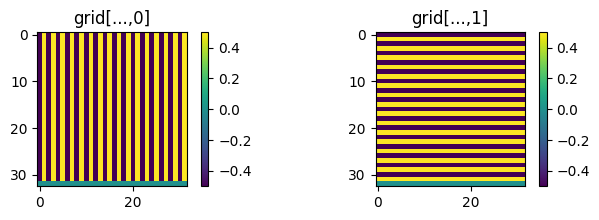

In [11]:
class StrideGrid2D(layers.Layer):
    """
    Returns a (batch_size, height, width, 2) tensor with a grid of (x,y) coordinates.
    Coordinates are aligned to the strides of an assumed subsequent pooling layer,
    and indicate the relative position of the cell in the pool, relative to the
    pool's centre.
    For example, with stride=2, each 2x2 sub-grid has coordinates:
       [[-0.5,-0.5], [+0.5,-0.5]],
        [-0.5,+0.5], [+0.5,+0.5]].

    Generally this will be subsequently concatenated with the input tensor
    before applying a position-wise pooling operation.
    """
    def __init__(self, strides=2, **kwargs):
        super().__init__(**kwargs)
        self.strides = (strides, strides) if np.isscalar(strides) else strides

    def call(self, inputs):
        # inputs.shape => [batch_size, height, width, channels]
        batch_size, height, width, channels = tf.unstack(tf.shape(inputs))

        # Generate a coordinate grid patch:
        # - x_coords: shape (stride_width,) from -0.5 to 0.5
        # - y_coords: shape (stride_height,) from -0.5 to 0.5
        # - xx, yy shape => (stride_height, stride_width)
        # - concatted: (stride_height, stride_width, 2)
        stride_height, stride_width = self.strides
        x_coords = tf.linspace(-0.5, 0.5, stride_width)
        y_coords = tf.linspace(-0.5, 0.5, stride_height)
        xx, yy = tf.meshgrid(x_coords, y_coords)
        grid = tf.concat([tf.expand_dims(xx, axis=-1), tf.expand_dims(yy, axis=-1)], axis=-1)

        # Tile across all patches in image
        # - Tile, then pad if needed
        # - (width, height, 2)
        patch_count_x = width // stride_width
        patch_count_y = height // stride_height
        x_pad = tf.cast(width - patch_count_x * stride_width, tf.int32)
        y_pad = tf.cast(height - patch_count_y * stride_height, tf.int32)
        tiled = tf.tile(grid, [patch_count_x, patch_count_y, 1])
        paddings = tf.stack([
            tf.stack([0, y_pad]),
            tf.stack([0, x_pad]),
            tf.stack([0, 0])
        ])
        tiled = tf.pad(tiled, paddings, 'CONSTANT')

        # Tile across batch dimension
        output = tf.tile(tf.expand_dims(tiled, 0), [batch_size, 1, 1, 1])
        return output

input = tf.keras.Input(shape=(32, 32, 3))
cg = StrideGrid2D()(input)
print(f"symbolic output: {type(cg)}, shape: {cg.shape}")

input = tf.zeros((1, 33, 32, 3))
cg = StrideGrid2D(strides=2)(input)
print(f"actual output: {type(cg)}, shape: {cg.shape}")

plt.figure(figsize=(8,2))
plt.subplot(1,2,1)
plt.title("grid[...,0]")
plt.imshow(cg[0,:,:,0])
plt.colorbar()

plt.subplot(1,2,2)
plt.title("grid[...,1]")
plt.imshow(cg[0,:,:,1])
plt.colorbar()
plt.show()

actual output (cg): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 32, 32, 2)
actual output (mp): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 16, 16, 2)


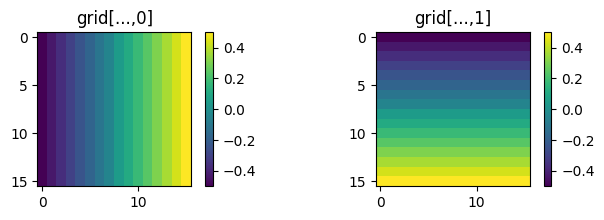

In [12]:
class PositionwiseMaxPool2D(tf.keras.layers.Layer):
    """
    Pooling operation that selects all channels from the same position as a single unit.
    Positions are chosen by arg-max over a reduction operation (sum-of-squares).
    Use channel_weights to exclude some channels from the reduction.
    """

    def __init__(self, pool_size=(2, 2), strides=None, channel_weights=None, **kwargs):
        super().__init__(**kwargs)

        self.pool_size = (pool_size, pool_size) if np.isscalar(pool_size) else pool_size
        if strides is None:
          self.strides = self.pool_size
        else:
          self.strides = (strides, strides) if np.isscalar(strides) else strides
        self.channel_weights = channel_weights

    def call(self, inputs):
        batch_size, height, width, channels = tf.unstack(tf.shape(inputs))
        ksize = self.pool_size
        strides = self.strides

        # Extract 2x2 patches: shape (B, H//2, W//2, 2, 2, C)
        patches = tf.image.extract_patches(
            images=inputs,
            sizes=[1, ksize[0], ksize[1], 1],
            strides=[1, strides[0], strides[1], 1],
            rates=[1, 1, 1, 1],
            padding='VALID'
        )
        patch_shape = tf.shape(patches)
        out_h, out_w = patch_shape[1], patch_shape[2]

        # Reshape to (B, out_h, out_w, 4, C)
        patches = tf.reshape(patches, [batch_size, out_h, out_w, ksize[0]*ksize[1], channels])

        # Compute reduction: (B, out_h, out_w, 4)
        # - using sum-of-squares, which is equivalent to a norm() once argmax is applied
        if self.channel_weights is None:
          norms = tf.reduce_sum(tf.square(patches), axis=-1)
        else:
          norms = tf.reduce_sum(tf.square(patches) * self.channel_weights, axis=-1)

        # Argmax to find winning positions: (B, out_h, out_w)
        indices = tf.argmax(norms, axis=-1, output_type=tf.int32)

        # Gather the full vectors corresponding to max-norm positions
        one_hot = tf.one_hot(indices, depth=ksize[0]*ksize[1])  # shape: (B, out_h, out_w, 4)
        one_hot = tf.expand_dims(one_hot, axis=-1)              # shape: (B, out_h, out_w, 4, 1)
        output = tf.reduce_sum(one_hot * patches, axis=-2)      # shape: (B, out_h, out_w, C)

        return output

input = tf.zeros((1, 32, 32, 3))
cg = CoordGrid2D()(input)
#cg = StrideGrid2D()(input)
mp = PositionwiseMaxPool2D()(cg)
print(f"actual output (cg): {type(cg)}, shape: {cg.shape}")
print(f"actual output (mp): {type(mp)}, shape: {mp.shape}")

plt.figure(figsize=(8,2))
plt.subplot(1,2,1)
plt.title("grid[...,0]")
plt.imshow(mp[0,:,:,0])
plt.colorbar()

plt.subplot(1,2,2)
plt.title("grid[...,1]")
plt.imshow(mp[0,:,:,1])
plt.colorbar()
plt.show()

In [13]:
# PositionwiseMaxPool2D tests

# Combining coord grid with channel_mask
input = tf.constant([[
    [[0.5, 0.5, 0.3], [0.1, 0.2, 0.3], [0.5, 0.3, 0.5], [0.7, 0.8, 0.9]],
    [[0.4, 0.3, 0.5], [0.3, 0.3, 0.3], [0.4, 0.3, 0.5], [0.3, 0.3, 0.3]],
    [[0.1, 0.2, 0.3], [0.0, 0.0, 0.3], [0.3, 0.5, 0.5], [0.6, 0.6, 0.7]],
    [[0.2, 0.3, 0.2], [0.0, 0.0, 0.3], [0.4, 0.3, 0.5], [0.5, 0.6, 0.5]]
]])
expected1 = tf.constant([[
    [[0.5, 0.5, 0.3, -0.5, -0.5], [0.7, 0.8, 0.9, +0.5, -0.5]],
    [[0.2, 0.3, 0.2, -0.5, +0.5], [0.6, 0.6, 0.7, +0.5, 1/6.]]
]])
coords = CoordGrid2D()(input)
x = layers.Concatenate()([input, coords])
x = PositionwiseMaxPool2D(channel_weights=[1, 1, 1, 0, 0])(x)
assert np.allclose(x.numpy(), expected1.numpy())

# Combining stride grid with channel_mask
expected2 = tf.constant([[
    [[0.4, 0.3, 0.5, -0.5, +0.5], [0.7, 0.8, 0.9, +0.5, -0.5]],
    [[0.1, 0.2, 0.3, -0.5, -0.5], [0.6, 0.6, 0.7, +0.5, -0.5]],
]])
coords = StrideGrid2D()(input)
x = layers.Concatenate()([input, coords])
x = PositionwiseMaxPool2D(channel_weights=[0, 0, 1, 0, 0])(x)
assert np.allclose(x.numpy(), expected2.numpy())

In [14]:
# Suggested by ChatGPT
# - This variant treats the entire image as heatmaps, one heatmap for each channel.
# - And identifies a single centre point.
# - Nice on the face of it, but not clear how to pass the spatial results down through further down-scaling blocks.
# TODO could turn into complete layer
def spatial_softmax(activations):
    # activations: (B, H, W, C)
    shape = tf.shape(activations)
    B, H, W, C = shape[0], shape[1], shape[2], shape[3]

    # Reshape to (B, H*W, C)
    flat = tf.reshape(activations, [B, H * W, C])
    softmax = tf.nn.softmax(flat, axis=1)

    # Create coordinate grid
    x_coords = tf.linspace(-1.0, 1.0, W)
    y_coords = tf.linspace(-1.0, 1.0, H)
    x_grid, y_grid = tf.meshgrid(x_coords, y_coords)
    x_grid = tf.reshape(x_grid, [-1])
    y_grid = tf.reshape(y_grid, [-1])

    # Multiply and sum: expected x and y
    expected_x = tf.reduce_sum(softmax * x_grid[tf.newaxis, :, tf.newaxis], axis=1)
    expected_y = tf.reduce_sum(softmax * y_grid[tf.newaxis, :, tf.newaxis], axis=1)

    # Output shape: (B, 2*C)
    return tf.concat([expected_x, expected_y], axis=-1)


symbolic output: <class 'keras.src.backend.common.keras_tensor.KerasTensor'>, shape: (None, 32, 32, 2)
actual output (cg): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 32, 32, 2)
actual output (mp): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 16, 16, 2)


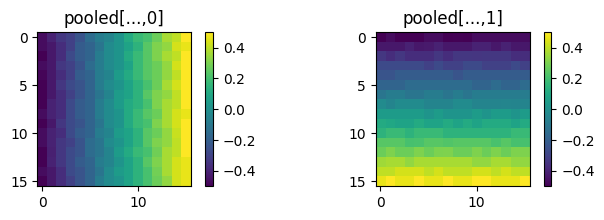

In [15]:
class AttentionPool2D(tf.keras.layers.Layer):
    """
    2D downsampling layer that computes a soft-argmax from one input
    to attend to the second input.
    Typically used for softmax-weighted pooling of positional inputs, based
    on the strength of the feature vectors.

    Both inputs must have the same shape (B, H, W, C). Operates channel-wise.
    Channels from each input are paired up, in sequence.

    Output shape: (B, pooled_H, pooled_w, C).
    """

    def __init__(self, pool_size=(2, 2), strides=None, padding='valid', **kwargs):
        super().__init__(**kwargs)

        self.pool_size = (pool_size, pool_size) if np.isscalar(pool_size) else pool_size
        if strides is None:
          self.strides = self.pool_size
        else:
          self.strides = (strides, strides) if np.isscalar(strides) else strides
        self.padding = padding.upper()

    def call(self, keys, values):
        batch_size, height, width, channels = tf.unstack(tf.shape(keys))
        tf.assert_equal(tf.shape(keys), tf.shape(values), "Input tensors must have identical shape", summarize=4)
        ksize = self.pool_size

        # Extract pool patches, eg: (assuming 2x2) (B, H//2, W//2, 2, 2, C)
        key_patches = tf.image.extract_patches(
            images=keys,
            sizes=[1, ksize[0], ksize[1], 1],
            strides=[1, self.strides[0], self.strides[1], 1],
            rates=[1, 1, 1, 1],
            padding=self.padding
        )
        value_patches = tf.image.extract_patches(
            images=values,
            sizes=[1, ksize[0], ksize[1], 1],
            strides=[1, self.strides[0], self.strides[1], 1],
            rates=[1, 1, 1, 1],
            padding=self.padding
        )
        patch_shape = tf.shape(key_patches)
        out_h, out_w = patch_shape[1], patch_shape[2]

        # Reshape to (B, out_h, out_w, 4, C)
        key_patches   = tf.reshape(key_patches, [batch_size, out_h, out_w, ksize[0]*ksize[1], channels])
        value_patches = tf.reshape(value_patches, [batch_size, out_h, out_w, ksize[0]*ksize[1], channels])

        # Compute softmax-weighted mean of values, shape: (B, out_h, out_w, C)
        attention_scores = tf.nn.softmax(key_patches, axis=-2)
        output = tf.reduce_sum(attention_scores * value_patches, axis=-2)
        return output

# check with symbolic tensors
input = tf.keras.Input(shape=(32, 32, 3))
features = StrideGrid2D()(input)
cg = CoordGrid2D()(input)
mp = AttentionPool2D()(features, cg)
print(f"symbolic output: {type(cg)}, shape: {cg.shape}")

# check with concrete values
input = tf.zeros((1, 32, 32, 3))
cg = CoordGrid2D()(input)
features = tf.random.normal(shape=(1, 32, 32, 2)) * 50
mp = AttentionPool2D()(features, cg)
print(f"actual output (cg): {type(cg)}, shape: {cg.shape}")
print(f"actual output (mp): {type(mp)}, shape: {mp.shape}")

plt.figure(figsize=(8,2))
plt.subplot(1,2,1)
plt.title("pooled[...,0]")
plt.imshow(mp[0,:,:,0])
plt.colorbar()

plt.subplot(1,2,2)
plt.title("pooled[...,1]")
plt.imshow(mp[0,:,:,1])
plt.colorbar()
plt.show()

symbolic output: <class 'keras.src.backend.common.keras_tensor.KerasTensor'>, shape: (None, 32, 32, 2)
actual output (features): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 32, 32, 2)


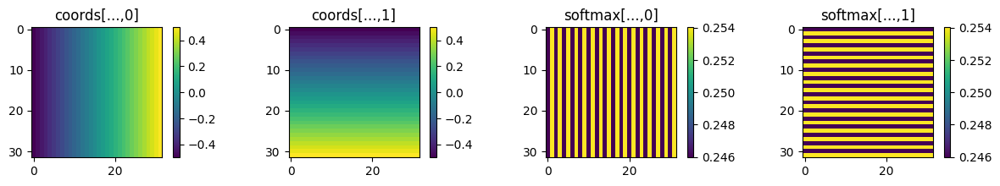

actual output (cg): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 32, 32, 2)
actual output (mp): <class 'tensorflow.python.framework.ops.EagerTensor'>, shape: (1, 16, 16, 2)


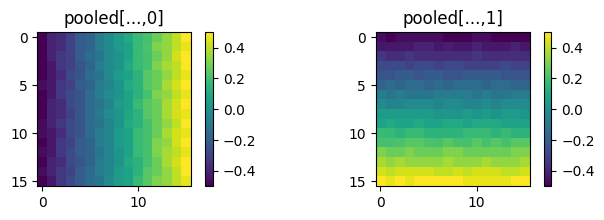

In [16]:
# Breaks out the steps of AttentionPool2D for easier interpretability.
class StridedSoftmax2D(tf.keras.layers.Layer):
    """
    Applies softmax to values within stride-patches, channel-wise.
    """

    def __init__(self, pool_size=(2, 2), strides=None, **kwargs):
        super().__init__(**kwargs)

        self.pool_size = (pool_size, pool_size) if np.isscalar(pool_size) else pool_size
        if strides is None:
          self.strides = self.pool_size
        else:
          self.strides = (strides, strides) if np.isscalar(strides) else strides
        self.padding = 'valid'.upper()  # can only do if using 'valid' padding

        if self.pool_size != self.strides:
            raise ValueError("pool_size and strides must be the same")

    def call(self, input):
        batch_size, height, width, channels = tf.unstack(tf.shape(input))
        ksize = self.pool_size

        # Extract pool patches, eg: (assuming 2x2) (B, H//2, W//2, 2, 2, C)
        # Then reshape to (B, out_h, out_w, 4, C)
        patches = tf.image.extract_patches(
            images=input,
            sizes=[1, ksize[0], ksize[1], 1],
            strides=[1, self.strides[0], self.strides[1], 1],
            rates=[1, 1, 1, 1],
            padding=self.padding
        )
        patch_shape = tf.shape(patches)
        out_h, out_w = patch_shape[1], patch_shape[2]
        patches = tf.reshape(patches, [batch_size, out_h, out_w, ksize[0]*ksize[1], channels])

        # Compute softmax
        # Then reshape back to original (B, H, W, C)
        # Compute softmax-weighted mean of values, shape: (B, out_h, out_w, C)
        patches = tf.nn.softmax(patches, axis=-2)

        # Convert back to original shape
        # - only possible when strides=pool_size and padding=valid
        output = tf.reshape(patches, [batch_size, out_h, out_w, ksize[0], ksize[1], channels])
        output = tf.transpose(output, [0, 1, 3, 2, 4, 5])  # eg: (B, H//2, 2, W//2, 2, C)
        output = tf.reshape(output, [batch_size, height, width, channels])

        return output

class DotPool2D(tf.keras.layers.Layer):
    """
    2D downsampling layer that combines the values between two inputs via a flattened dot-product
    applied patch-wise and channel-wise. Wordedly differently, it applies a weighted sum,
    where the first input provides the weights and the second input provides the values.
    However, you could equally phrase them the other way around.

    Both inputs must have the same shape (B, H, W, C). Operates channel-wise.
    Channels from each input are paired up, in sequence.

    Output shape: (B, pooled_H, pooled_w, C).
    """

    def __init__(self, pool_size=(2, 2), strides=None, padding='valid', **kwargs):
        super().__init__(**kwargs)

        self.pool_size = (pool_size, pool_size) if np.isscalar(pool_size) else pool_size
        if strides is None:
          self.strides = self.pool_size
        else:
          self.strides = (strides, strides) if np.isscalar(strides) else strides
        self.padding = padding.upper()

    def call(self, keys, values):
        batch_size, height, width, channels = tf.unstack(tf.shape(keys))
        tf.assert_equal(tf.shape(keys), tf.shape(values), "Input tensors must have identical shape", summarize=4)
        ksize = self.pool_size

        # Extract pool patches, eg: (assuming 2x2) (B, H//2, W//2, 2, 2, C)
        key_patches = tf.image.extract_patches(
            images=keys,
            sizes=[1, ksize[0], ksize[1], 1],
            strides=[1, self.strides[0], self.strides[1], 1],
            rates=[1, 1, 1, 1],
            padding=self.padding
        )
        value_patches = tf.image.extract_patches(
            images=values,
            sizes=[1, ksize[0], ksize[1], 1],
            strides=[1, self.strides[0], self.strides[1], 1],
            rates=[1, 1, 1, 1],
            padding=self.padding
        )
        patch_shape = tf.shape(key_patches)
        out_h, out_w = patch_shape[1], patch_shape[2]

        # Reshape to (B, out_h, out_w, 4, C)
        key_patches   = tf.reshape(key_patches, [batch_size, out_h, out_w, ksize[0]*ksize[1], channels])
        value_patches = tf.reshape(value_patches, [batch_size, out_h, out_w, ksize[0]*ksize[1], channels])

        # Compute dotted sum of values, shape: (B, out_h, out_w, C)
        output = tf.reduce_sum(key_patches * value_patches, axis=-2)
        return output

# check with symbolic tensors
input = tf.keras.Input(shape=(32, 32, 3))
features = StrideGrid2D()(input)
cg = CoordGrid2D()(input)
features = StridedSoftmax2D()(features)
mp = DotPool2D()(features, cg)
print(f"symbolic output: {type(cg)}, shape: {cg.shape}")

# check with concrete values
input = tf.zeros((1, 32, 32, 3))
#features = tf.random.normal(shape=(1, 32, 32, 2)) * 50
coords = CoordGrid2D()(input)
features = StridedSoftmax2D()(coords)
print(f"actual output (features): {type(features)}, shape: {features.shape}")

plt.figure(figsize=(15,2))
plt.subplot(1,4,1)
plt.title("coords[...,0]")
plt.imshow(coords[0,:,:,0])
plt.colorbar()

plt.subplot(1,4,2)
plt.title("coords[...,1]")
plt.imshow(coords[0,:,:,1])
plt.colorbar()

plt.subplot(1,4,3)
plt.title("softmax[...,0]")
plt.imshow(features[0,:,:,0])
plt.colorbar()

plt.subplot(1,4,4)
plt.title("softmax[...,1]")
plt.imshow(features[0,:,:,1])
plt.colorbar()
plt.show()

# check with concrete values
input = tf.zeros((1, 32, 32, 3))
cg = CoordGrid2D()(input)
features = tf.random.normal(shape=(1, 32, 32, 2)) * 50
features = StridedSoftmax2D()(features)
mp = DotPool2D()(features, cg)
print(f"actual output (cg): {type(cg)}, shape: {cg.shape}")
print(f"actual output (mp): {type(mp)}, shape: {mp.shape}")

plt.figure(figsize=(8,2))
plt.subplot(1,2,1)
plt.title("pooled[...,0]")
plt.imshow(mp[0,:,:,0])
plt.colorbar()

plt.subplot(1,2,2)
plt.title("pooled[...,1]")
plt.imshow(mp[0,:,:,1])
plt.colorbar()
plt.show()

In [17]:
input = tf.zeros((1, 4, 4, 3))
input = CoordGrid2D()(input)
print(f"input: {input.shape}")
#input = input[...,0]
#input = input[...,np.newaxis]
batch_size, height, width, channels = tf.unstack(tf.shape(input))

patches = tf.image.extract_patches(
    images=input,
    sizes=[1, 2, 2, 1],
    strides=[1, 2, 2, 1],
    rates=[1, 1, 1, 1],
    padding='VALID'
)  # (B, H//2, W//2, 2*2*C)
print(f"patches: {patches.shape}")
patches_orig = patches
patch_shape = tf.shape(patches)
out_h, out_w = patch_shape[1], patch_shape[2]
patches = tf.reshape(patches, [batch_size, out_h, out_w, 2*2, channels])
patches_reshaped = patches
print(f"patches: {patches.shape}")

patches = tf.nn.softmax(patches, axis=-2)

output = tf.reshape(patches, [batch_size, out_h, out_w, 2, 2, channels])
output = tf.transpose(output, [0, 1, 3, 2, 4, 5])  # eg: (B, H//2, 2, W//2, 2, C)
output = tf.reshape(output, [batch_size, height, width, channels])


input: (1, 4, 4, 2)
patches: (1, 2, 2, 8)
patches: (1, 2, 2, 4, 2)


In [18]:
print(f"input[0]:              {input.shape} =\n{input[0, :, :, 0]}")
print(f"patches_orig:          {patches_orig.shape}")
print(f"patches_reshaped[0]:   {patches_reshaped.shape} =\n{patches_reshaped[0, :, :, :, 0]}")
print(f"patches (softmax)[0]:  {patches.shape} =\n{patches[0, :, :, :, 0]}")

input[0]:              (1, 4, 4, 2) =
[[-0.5        -0.16666666  0.16666669  0.5       ]
 [-0.5        -0.16666666  0.16666669  0.5       ]
 [-0.5        -0.16666666  0.16666669  0.5       ]
 [-0.5        -0.16666666  0.16666669  0.5       ]]
patches_orig:          (1, 2, 2, 8)
patches_reshaped[0]:   (1, 2, 2, 4, 2) =
[[[-0.5        -0.16666666 -0.5        -0.16666666]
  [ 0.16666669  0.5         0.16666669  0.5       ]]

 [[-0.5        -0.16666666 -0.5        -0.16666666]
  [ 0.16666669  0.5         0.16666669  0.5       ]]]
patches (softmax)[0]:  (1, 2, 2, 4, 2) =
[[[0.2087149 0.2912851 0.2087149 0.2912851]
  [0.2087149 0.2912851 0.2087149 0.2912851]]

 [[0.2087149 0.2912851 0.2087149 0.2912851]
  [0.2087149 0.2912851 0.2087149 0.2912851]]]


## Layer analysis through gradients

Learnings:
* Effect of different reduction methods against loss
  * Calculating MSE loss as `mse(y_true, y_pred, axis=-1)` gives you a (b x h x w) loss tensor with large gradients. eg: in the range -6000..+6000.
  * Calculating loss as `tf.reduce_sum(mse(y_true, y_pred, axis=-1))` gives identical results.
  * Calculating loss as `tf.reduce_mean(mse(y_true, y_pred, axis=-1))` gives much smaller scaled gradients typically much smaller than -1.0..+1.0.
  * There seems to be some relationship between the magnitude of the loss, the size of the tensor, and the range of gradients, but I'm not sure what it is.

|Setup|Loss|Kernel gradients|Image gradients|
|--|--|--|---|
|reduce_mean loss, simple conv2d layer|1.05|+/- 0.0075|+/- 1e-6|
|reduce_sum loss, simple conv2d layer|733,829|+/- 6000|+/- 0.7|
|reduce_mean loss, conv2d+globalmaxpool, spotty input gradient coverage|1.9|+/- 0.2|+/- 0.002|
|reduce_sum loss, conv2d+globalmaxpool, spotty input gradient coverage|63.7|+/- 6|+/- 0.05|

* Conv2D
  * Conv + MaxPool layers suffer from a vignetting effect on the backprop'd gradients. Surprisingly, this is worst when using 'valid' padding (ie: no padding). In contrast, 'same' padding is quite adept at restricting the vignet to just the outermost edge, even on the earliest layers.
* MaxPool2D
  * Each max-pool patch selects just _one_ of its 2x2 inputs (or whatever patch size). If MaxPool layers are run consecutively, on their own this results in "dark spots" in the earlier layers. Those can only be recovered from via other data sources:
    * batch - provides 32 samples instead of 1, so randomly selects 32 positions (with replacement) out of all possible positions and ensures that gradients propagate back to those positions.
    * conv - pools information from surrounding positions, so gradients propagate back to a wider area. This is quite effective at preventing "dark spots".
  * However, MaxPool also causes aliasing effects.
* GlobalMaxPool
  * Given 32 input images in a batch, and 32 output channels, and assuming randomness, this gives 32*32 = 1024 separate locations for max value. Each location influences a 3x3 patch around its location.
  * So you get 1024 little patches scattered around the image, covering about 41% of all pixels in a 149x149 image.
  * The kernel itself is fully populated with gradients, with good differentiation.
  * The biggest problem is that it probably leads to vanishing gradients as the mean backprop gradient is close to zero.
* GlobalAvePool
  * Wierdly worse than GlobalMaxPool.
  * Kernel gets different gradients for each channel (probably based on their initial random state), but with no differentiation by position. The 3x3 shape acts like a single value.
  * The image gets a uniform gradient across its entire surface, varying only on the channel axis.
* PositionwiseMaxPool2D
  * If only output spatial values are subsequently used, and original semantic features discarded, then there is **no kernel gradient** and **no backprop gradient**. The problem is that the features are only used in the conditional, with no other influence on the loss - and the conditional is not differentiable. So there's no informational pathway for the features.

Anti-aliasing and Checkerboard artifacts:
* Conv layers produce aliasing artifacts in the backprop gradients. It is worst when combined with MaxPool or strided convolutions, as they explicitly add in high-frequency aliasing effects. But even just conv layers alone cause this.
* Zhang, R. (2019). Making Convolutional Networks Shift-Invariant Again. ICML. https://doi.org/10.48550/arXiv.1904.11486
* Odena, et al. (2016). Deconvolution and Checkerboard Artifacts. Distill. http://doi.org/10.23915/distill.00003


Input:  (32, 149, 149, 1)
Output: (32, 147, 147, 32)
Loss:   1.0636378526687622 <- 0.2527198791503906..2.8647537231445312
Parameter gradients (2): [TensorShape([3, 3, 1, 32]), TensorShape([32])]
Input gradients: (32, 149, 149, 1)
Layer gradients (1): [TensorShape([32, 147, 147, 32])]
Layer outputs (1): [TensorShape([32, 147, 147, 32])]


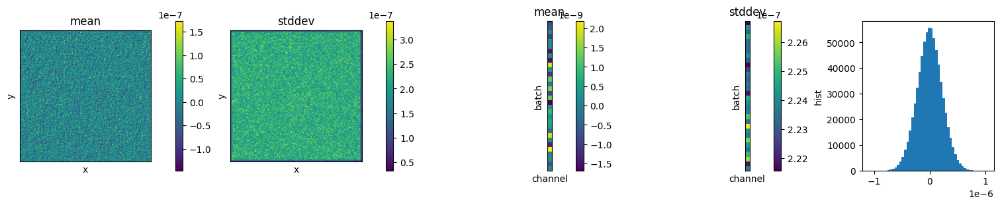

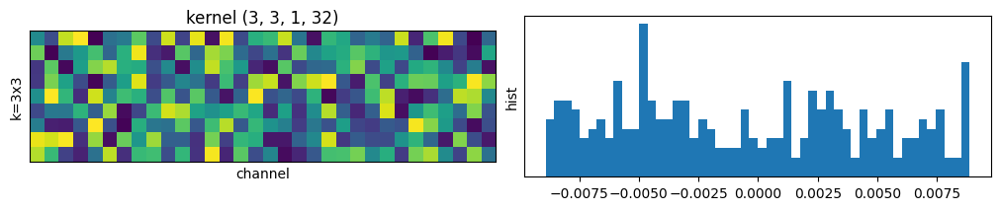

Input:  (32, 149, 149, 1)
Output: (32, 147, 147, 1)
Loss:   1.9572731256484985 <- 2.7853275241795927e-12..51.73842239379883
Parameter gradients (2): [TensorShape([3, 3, 1, 1]), TensorShape([1])]
Input gradients: (32, 149, 149, 1)
Layer gradients (1): [TensorShape([32, 147, 147, 1])]
Layer outputs (1): [TensorShape([32, 147, 147, 1])]


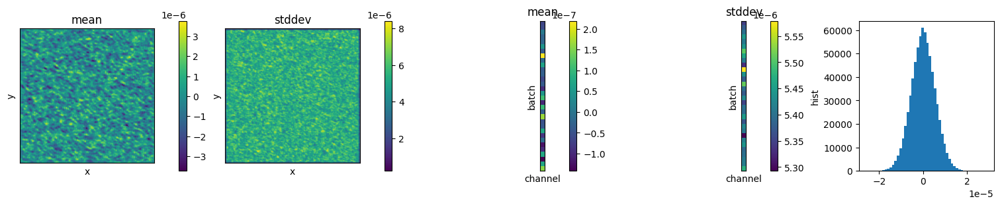

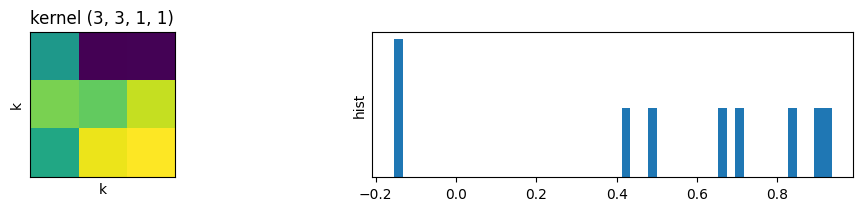

In [19]:
def gradients_for(layer, inputs=None):
  """
  Takes a single layer or a small model representing a block, and computes the gradients w.r.t its parameters
  and w.r.t its inputs. In other words, it computes the parameter gradients and the backprop for this layer
  or block as it would be in a larger model.

  Returns:
   - parameter_gradients, input_gradients
  """
  # randomly generate input batch, if needed
  if inputs is None:
    inputs = tf.keras.Input(shape=(149, 149, 1))
  if isinstance(inputs, tf.Tensor):
    symbolic_input = tf.keras.Input(shape=inputs.shape)
    actual_input = inputs
  else:
    shape = inputs.shape
    if shape[0] is None:
      shape = (32,) + shape[1:]
    symbolic_input = inputs
    actual_input = tf.random.normal(shape=shape)
  print(f"Input:  {actual_input.shape}")

  # prepare model
  if isinstance(layer, tf.keras.layers.Layer):
    outputs = layer(symbolic_input)
    model = tf.keras.Model(inputs=symbolic_input, outputs=outputs)
  elif isinstance(layer, tf.keras.Model):
    model = layer
  else:
    model = tf.keras.Model(inputs=symbolic_input, outputs=layer)

  # prepare model with layers split out
  model_outputs = model.outputs
  if not isinstance(model_outputs, list):
    model_outputs = [model_outputs]
  monitoring_model = tf.keras.Model(
      inputs=tinstr._original_inputs(model),
      outputs=model_outputs + [layer.output for layer in model.layers])

  # randomly generate expected output
  shape = model.output.shape
  shape = (32,) + shape[1:]
  expected_output = tf.random.normal(shape=shape)
  print(f"Output: {expected_output.shape}")

  # calculate gradients
  # - note: layer_outputs includes Input, because it's created as an explicit Input layer
  with tf.GradientTape() as tape:
    tape.watch(actual_input)
    monitoring_outputs = monitoring_model(actual_input)
    y_pred = monitoring_outputs[0]
    layer_outputs = monitoring_outputs[1:]
    loss_t = tf.keras.losses.MSE(expected_output, y_pred)
    loss = tf.reduce_mean(loss_t)
  print(f"Loss:   {loss} <- {tf.reduce_min(loss_t)}..{tf.reduce_max(loss_t)}")
  if np.isnan(loss):
    raise ValueError("loss is NaN")
  gradients = tape.gradient(loss, model.trainable_weights + layer_outputs)
  parameter_gradients = gradients[:len(model.trainable_weights)]
  input_gradients = gradients[len(model.trainable_weights)]
  layer_gradients = gradients[len(model.trainable_weights)+1:]
  layer_outputs = layer_outputs[1:]  # drop Input

  # log info
  def _shape_of(t):
    return None if t is None else t.shape
  print(f"Parameter gradients ({len(parameter_gradients)}): {[_shape_of(g) for g in parameter_gradients]}")
  print(f"Input gradients: {_shape_of(input_gradients)}")
  print(f"Layer gradients ({len(layer_gradients)}): {[_shape_of(g) for g in layer_gradients]}")
  print(f"Layer outputs ({len(layer_outputs)}): {[_shape_of(g) for g in layer_outputs]}")

  return parameter_gradients, input_gradients, layer_gradients, layer_outputs

def _add_plot_hist(data, bins=10):
  # efficient equivalent of plt.hist()
  counts, bin_edges = np.histogram(tf.reshape(data, [-1]), bins=bins)
  bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
  bin_widths = np.diff(bin_edges)
  plt.bar(bin_centers, counts, width=bin_widths)

def plot_image_batch(images, title=None):
  """
  Plots a batch of images.
  """
  b, h, w, ch = images.shape

  plt.figure(figsize=(15,3), layout='constrained')

  # front-view (position-wise)
  if ch == 3:
    # RGB images
    image_mean = tf.reduce_mean(images, axis=0)
    image_std = tf.math.reduce_std(images, axis=0)
  else:
    # flattened gray-scale images
    image_mean = tf.reduce_mean(images, axis=[0, 3])
    image_std = tf.math.reduce_std(images, axis=[0, 3])

  plt.subplot(1,5,1)
  plt.title("mean" if title is None else f"{title}\nmean")
  plt.imshow(image_mean)
  plt.xticks([])
  plt.yticks([])
  plt.xlabel("x")
  plt.ylabel("y")
  plt.colorbar()

  plt.subplot(1,5,2)
  plt.title("stddev")
  plt.imshow(image_std)
  plt.xticks([])
  plt.yticks([])
  plt.xlabel("x")
  plt.ylabel("y")
  plt.colorbar()

  # side-view (batch, channel-wise)
  image_mean = tf.reduce_mean(images, axis=[1, 2])
  image_std = tf.math.reduce_std(images, axis=[1, 2])

  plt.subplot(1,5,3)
  plt.title("mean")
  plt.imshow(image_mean)
  plt.xticks([])
  plt.yticks([])
  plt.xlabel("channel")
  plt.ylabel("batch")
  plt.colorbar()

  plt.subplot(1,5,4)
  plt.title("stddev")
  plt.imshow(image_std)
  plt.xticks([])
  plt.yticks([])
  plt.xlabel("channel")
  plt.ylabel("batch")
  plt.colorbar()

  # normal plt.hist() can't cope with such large tensors
  # (but using np.histogram() works efficiently)
  plt.subplot(1,5,5)
  _add_plot_hist(images, bins=50)
  plt.ylabel("hist")

def plot_kernel(kernel, title=None):
  """
  Plot an actual kernel or kernel gradients.
  """
  h, w, in_ch, out_ch = kernel.shape

  if in_ch == 1:
    plt.figure(figsize=(10,2), layout='constrained')

    plt.subplot2grid((h,2), (0, 0), rowspan=h)
    shape_disp = tuple(kernel.shape.as_list())
    plt.title(f"kernel {shape_disp}" if title is None else f"{title}\nkernel {shape_disp}")
    if out_ch == 1:
      plt.imshow(kernel[:, :, 0, 0])
      plt.xticks([])
      plt.yticks([])
      plt.xlabel("k")
      plt.ylabel("k")
    else:
      data = tf.reshape(kernel, [-1, out_ch])
      plt.imshow(data)
      plt.xticks([])
      plt.yticks([])
      plt.xlabel("channel")
      plt.ylabel(f"k={h}x{w}")
  else:
    raise ValueError("Don't know what to do with multiple in-channels yet")
    # todo maybe take inspiration from "1, 2, ..., N" patterns, and list the
    # first two and last in_ch
    #   plt.subplot2grid((h,2), (0, 0), rowspan=h)

  plt.subplot2grid((h,2), (0, 1), rowspan=h)
  #plt.hist(tf.reshape(kernel, [-1]), bins=50)
  _add_plot_hist(kernel, bins=50)
  plt.yticks([])
  plt.ylabel("hist")
  plt.show()

# simple example: conv2D only
parameter_gradients, input_gradients, _, _ = gradients_for(layers.Conv2D(filters=32, kernel_size=(3,3)))
plot_image_batch(input_gradients)
plot_kernel(parameter_gradients[0])

# simple example: conv2D only - only 1 filter
parameter_gradients, input_gradients, _, _ = gradients_for(layers.Conv2D(filters=1, kernel_size=(3,3)))
plot_image_batch(input_gradients)
plot_kernel(parameter_gradients[0])

Input:  (32, 15, 15, 1)
Output: (32, 1, 1, 1)
Loss:   1.5441334247589111 <- 0.001601089141331613..7.210817337036133
Parameter gradients (14): [TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1])]
Input gradients: (32, 15, 15, 1)
Layer gradients (7): [TensorShape([32, 13, 13, 1]), TensorShape([32, 11, 11, 1]), TensorShape([32, 9, 9, 1]), TensorShape([32, 7, 7, 1]), TensorShape([32, 5, 5, 1]), TensorShape([32, 3, 3, 1]), TensorShape([32, 1, 1, 1])]
Layer outputs (7): [TensorShape([32, 13, 13, 1]), TensorShape([32, 11, 11, 1]), TensorShape([32, 9, 9, 1]), TensorShape([32, 7, 7, 1]), TensorShape([32, 5, 5, 1]), TensorShape([32, 3, 3, 1]), TensorShape([32, 1, 1, 1])]


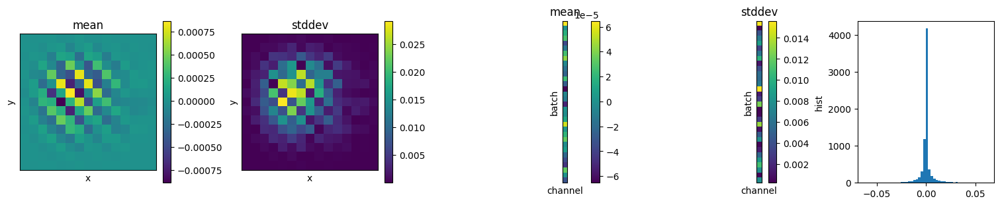

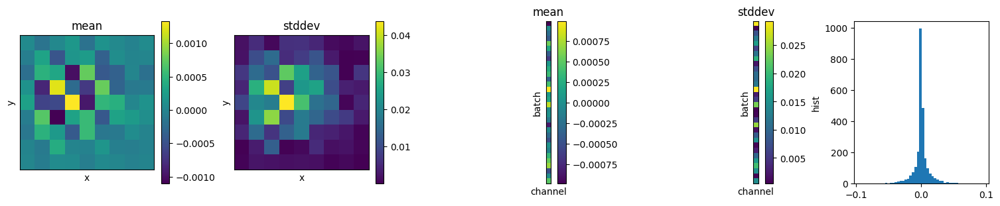

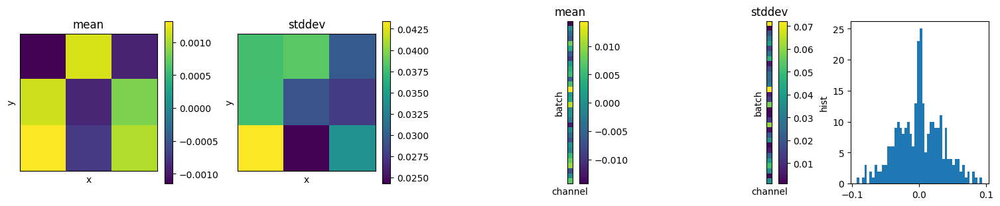

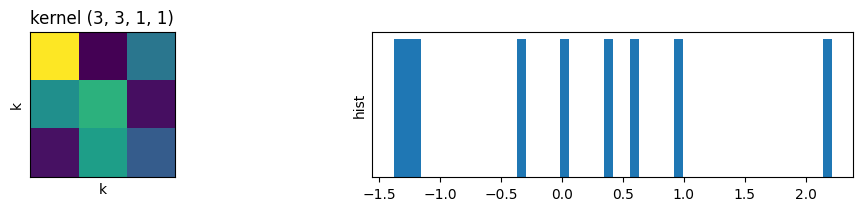

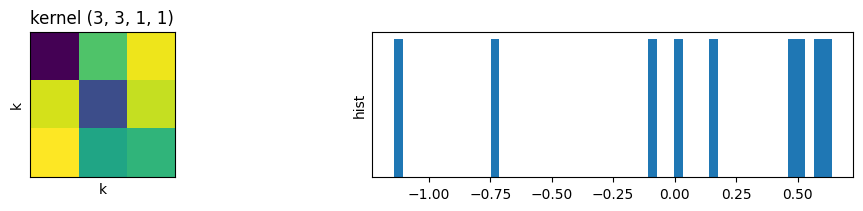

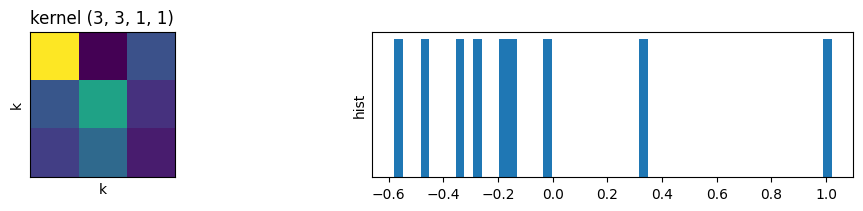

In [20]:
# accumulated effect: conv layers (no padding)
# - vignetting effect
# - looks like checkerboarding effects
input = tf.keras.Input(shape=(15, 15, 1))
x = layers.Conv2D(1, kernel_size=(3, 3), padding='valid')(input)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='valid')(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='valid')(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='valid')(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='valid')(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='valid')(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='valid')(x)
parameter_gradients, input_gradients, layer_gradients, _ = gradients_for(x, inputs=input)
plot_image_batch(input_gradients)
# just plot a few layers
plot_image_batch(layer_gradients[2])
plot_image_batch(layer_gradients[5])
plot_kernel(parameter_gradients[0])
plot_kernel(parameter_gradients[6])
plot_kernel(parameter_gradients[12])

Input:  (32, 15, 15, 1)
Output: (32, 15, 15, 1)
Loss:   1.9135246276855469 <- 1.2536681914809833e-08..35.02313232421875
Parameter gradients (14): [TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1])]
Input gradients: (32, 15, 15, 1)
Layer gradients (7): [TensorShape([32, 15, 15, 1]), TensorShape([32, 15, 15, 1]), TensorShape([32, 15, 15, 1]), TensorShape([32, 15, 15, 1]), TensorShape([32, 15, 15, 1]), TensorShape([32, 15, 15, 1]), TensorShape([32, 15, 15, 1])]
Layer outputs (7): [TensorShape([32, 15, 15, 1]), TensorShape([32, 15, 15, 1]), TensorShape([32, 15, 15, 1]), TensorShape([32, 15, 15, 1]), TensorShape([32, 15, 15, 1]), TensorShape([32, 15, 15, 1]), TensorShape([32, 15, 15, 1])]


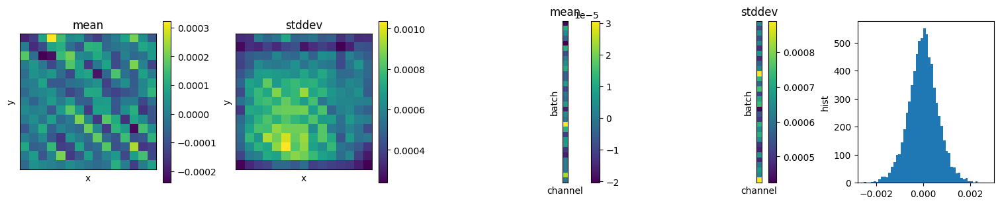

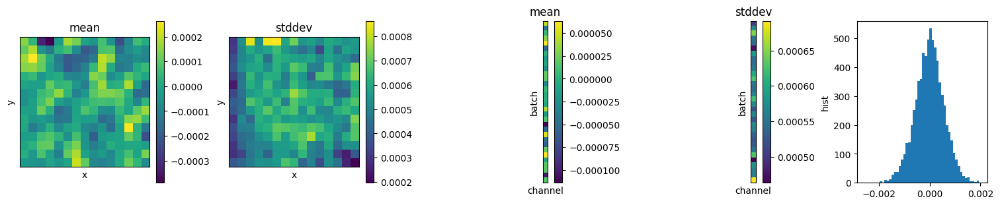

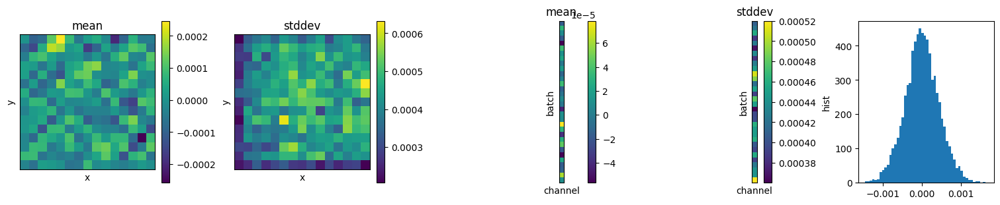

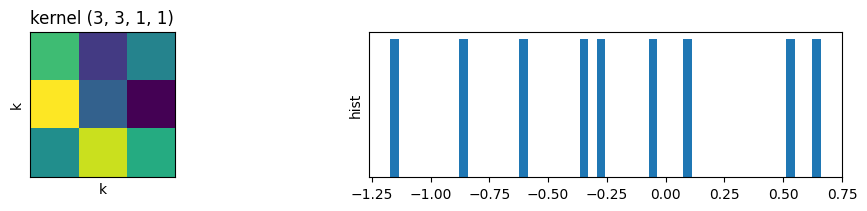

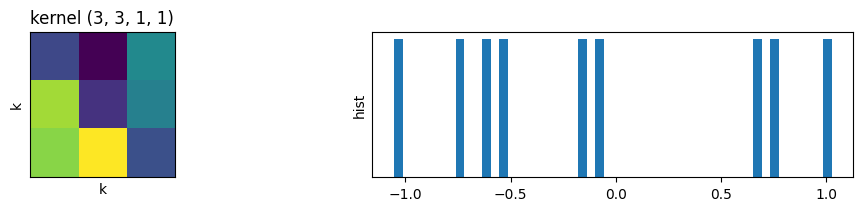

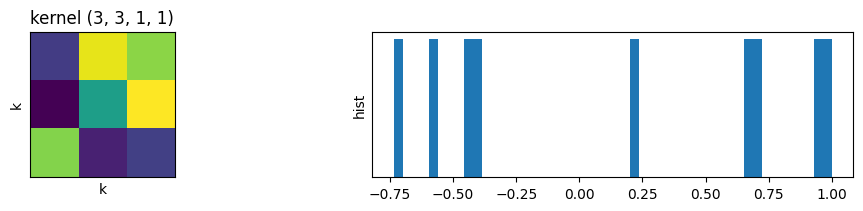

In [21]:
# accumulated effect: conv layers (padding)
# - vignetting effect is less
# - obvious checkerboarding as well
input = tf.keras.Input(shape=(15, 15, 1))
x = layers.Conv2D(1, kernel_size=(3, 3), padding='same')(input)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='same')(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='same')(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='same')(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='same')(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='same')(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='same')(x)
parameter_gradients, input_gradients, layer_gradients, _ = gradients_for(x, inputs=input)
# just plot a few layers
plot_image_batch(input_gradients)
plot_image_batch(layer_gradients[2])
plot_image_batch(layer_gradients[5])
plot_kernel(parameter_gradients[0])
plot_kernel(parameter_gradients[6])
plot_kernel(parameter_gradients[12])

Input:  (32, 149, 149, 1)
Output: (32, 74, 74, 1)
Loss:   2.5509982109069824 <- 1.1542766742422828e-11..42.84244918823242
Parameter gradients (0): []
Input gradients: (32, 149, 149, 1)
Layer gradients (1): [TensorShape([32, 74, 74, 1])]
Layer outputs (1): [TensorShape([32, 74, 74, 1])]

Input:  (32, 149, 149, 1)
Output: (32, 73, 73, 32)
Loss:   1.092918038368225 <- 0.2712922990322113..2.777456760406494
Parameter gradients (2): [TensorShape([3, 3, 1, 32]), TensorShape([32])]
Input gradients: (32, 149, 149, 1)
Layer gradients (2): [TensorShape([32, 147, 147, 32]), TensorShape([32, 73, 73, 32])]
Layer outputs (2): [TensorShape([32, 147, 147, 32]), TensorShape([32, 73, 73, 32])]


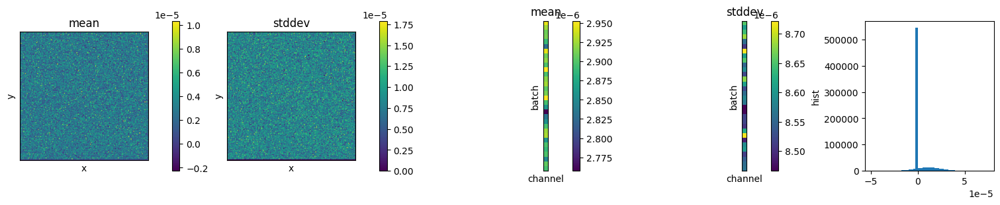

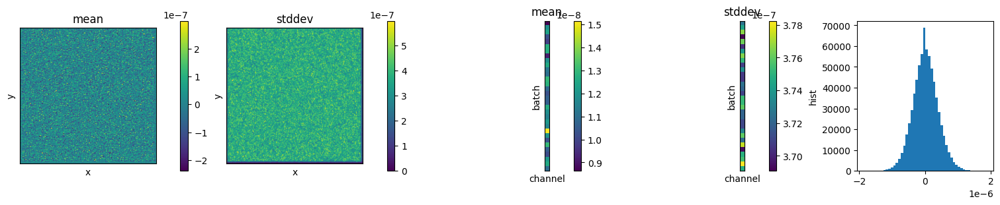

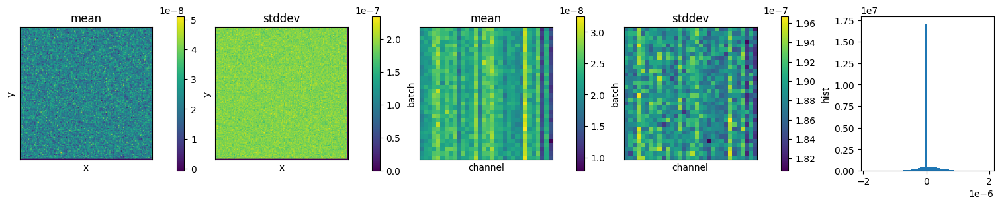

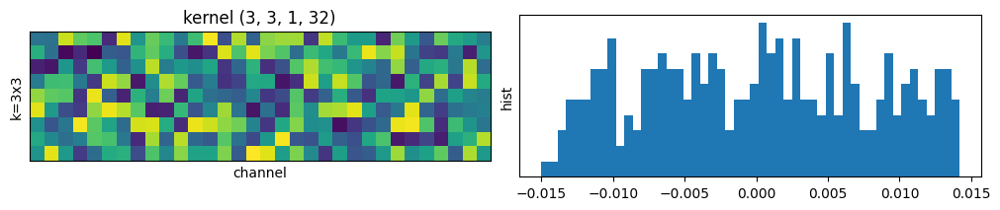

In [22]:
# simple example: maxpool only
input = tf.keras.Input(shape=(149, 149, 1))
x = layers.MaxPool2D()(input)
parameter_gradients, input_gradients, _, _ = gradients_for(x, inputs=input)
plot_image_batch(input_gradients)

# simple example: conv+maxpool
print()
input = tf.keras.Input(shape=(149, 149, 1))
x = layers.Conv2D(32, kernel_size=(3, 3))(input)
x = layers.MaxPool2D()(x)
parameter_gradients, input_gradients, layer_gradients, _ = gradients_for(x, inputs=input)
plot_image_batch(input_gradients)
plot_image_batch(layer_gradients[0])
plot_kernel(parameter_gradients[0])

Input:  (32, 16, 16, 1)
Output: (32, 1, 1, 1)
Loss:   10.51901626586914 <- 0.3372468650341034..26.425132751464844
Parameter gradients (0): []
Input gradients: (32, 16, 16, 1)
Layer gradients (4): [TensorShape([32, 8, 8, 1]), TensorShape([32, 4, 4, 1]), TensorShape([32, 2, 2, 1]), TensorShape([32, 1, 1, 1])]
Layer outputs (4): [TensorShape([32, 8, 8, 1]), TensorShape([32, 4, 4, 1]), TensorShape([32, 2, 2, 1]), TensorShape([32, 1, 1, 1])]


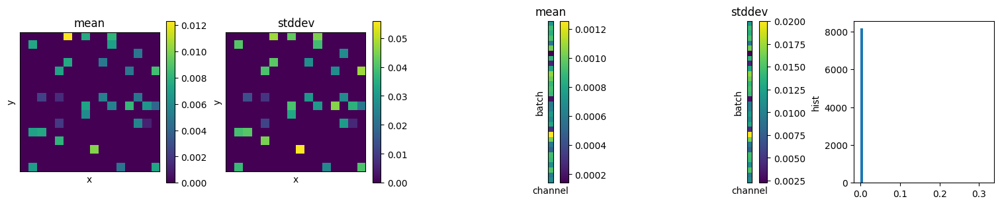

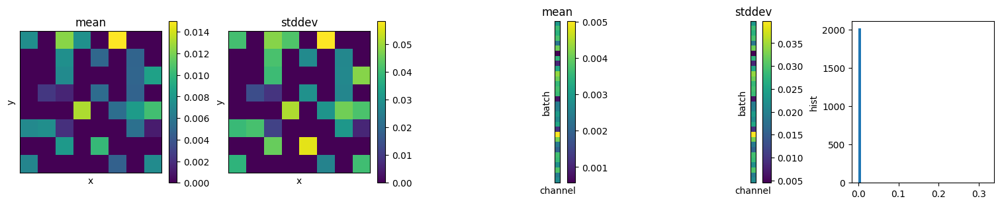

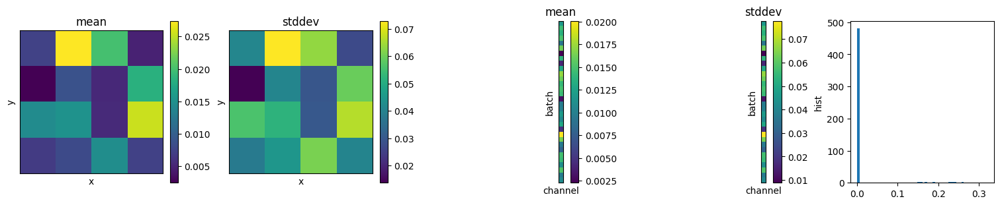

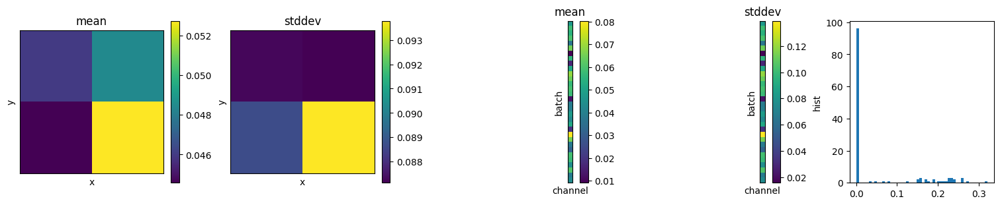

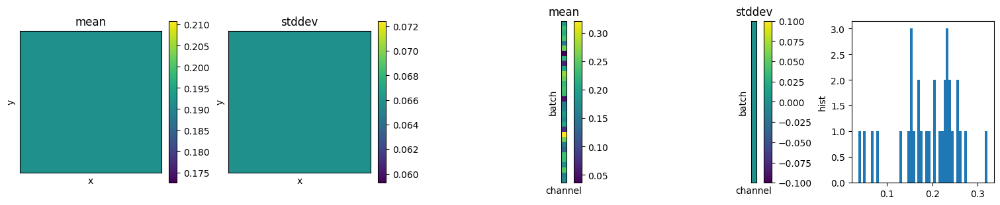

In [23]:
# accumulated effect: maxpool on smaller layers
input = tf.keras.Input(shape=(16, 16, 1))
x = layers.MaxPool2D()(input)
x = layers.MaxPool2D()(x)
x = layers.MaxPool2D()(x)
x = layers.MaxPool2D()(x)
parameter_gradients, input_gradients, layer_gradients, _ = gradients_for(x, inputs=input)
plot_image_batch(input_gradients)
for g in layer_gradients:
  plot_image_batch(g)

Input:  (32, 46, 46, 1)
Output: (32, 1, 1, 1)
Loss:   1.5871663093566895 <- 0.0016636750660836697..7.96633243560791
Parameter gradients (8): [TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1])]
Input gradients: (32, 46, 46, 1)
Layer gradients (8): [TensorShape([32, 44, 44, 1]), TensorShape([32, 22, 22, 1]), TensorShape([32, 20, 20, 1]), TensorShape([32, 10, 10, 1]), TensorShape([32, 8, 8, 1]), TensorShape([32, 4, 4, 1]), TensorShape([32, 2, 2, 1]), TensorShape([32, 1, 1, 1])]
Layer outputs (8): [TensorShape([32, 44, 44, 1]), TensorShape([32, 22, 22, 1]), TensorShape([32, 20, 20, 1]), TensorShape([32, 10, 10, 1]), TensorShape([32, 8, 8, 1]), TensorShape([32, 4, 4, 1]), TensorShape([32, 2, 2, 1]), TensorShape([32, 1, 1, 1])]


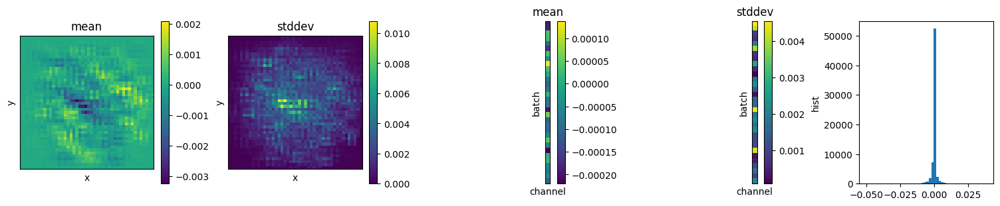

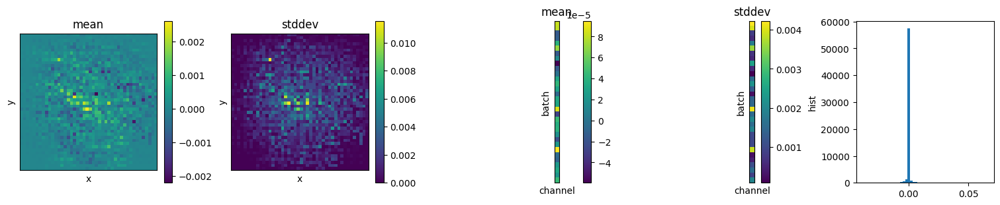

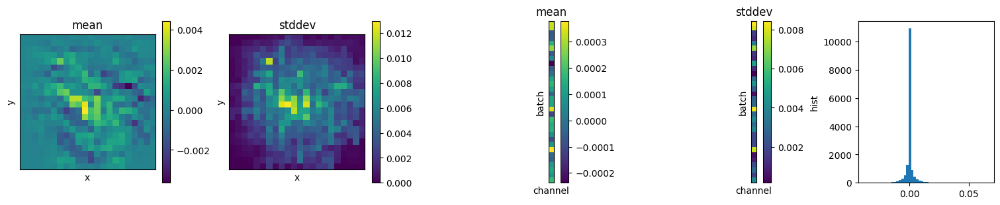

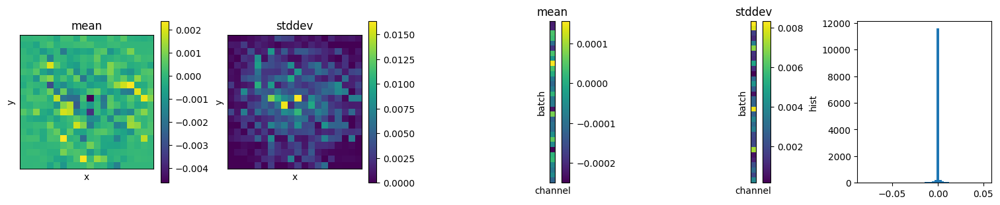

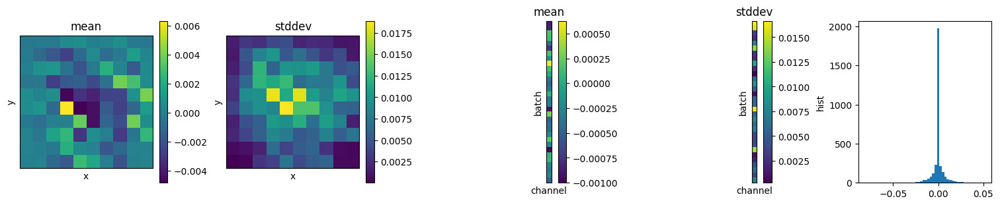

In [24]:
# accumulated effect: maxpool on smaller layers with conv
input = tf.keras.Input(shape=(46, 46, 1))
x = layers.Conv2D(1, kernel_size=(3, 3), padding='valid')(input)
x = layers.MaxPool2D()(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='valid')(x)
x = layers.MaxPool2D()(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='valid')(x)
x = layers.MaxPool2D()(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='valid')(x)
x = layers.MaxPool2D()(x)
parameter_gradients, input_gradients, layer_gradients, _ = gradients_for(x, inputs=input)
plot_image_batch(input_gradients)
# just plot earliest few layers
plot_image_batch(layer_gradients[0])
plot_image_batch(layer_gradients[1])
plot_image_batch(layer_gradients[2])
plot_image_batch(layer_gradients[3])

Input:  (32, 64, 64, 1)
Output: (32, 1, 1, 1)
Loss:   1.7256340980529785 <- 0.00043013656977564096..7.332058906555176
Parameter gradients (12): [TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1]), TensorShape([3, 3, 1, 1]), TensorShape([1])]
Input gradients: (32, 64, 64, 1)
Layer gradients (12): [TensorShape([32, 64, 64, 1]), TensorShape([32, 32, 32, 1]), TensorShape([32, 32, 32, 1]), TensorShape([32, 16, 16, 1]), TensorShape([32, 16, 16, 1]), TensorShape([32, 8, 8, 1]), TensorShape([32, 8, 8, 1]), TensorShape([32, 4, 4, 1]), TensorShape([32, 4, 4, 1]), TensorShape([32, 2, 2, 1]), TensorShape([32, 2, 2, 1]), TensorShape([32, 1, 1, 1])]
Layer outputs (12): [TensorShape([32, 64, 64, 1]), TensorShape([32, 32, 32, 1]), TensorShape([32, 32, 32, 1]), TensorShape([32, 16, 16, 1]), TensorShape([32, 16, 16, 1]), TensorShape(

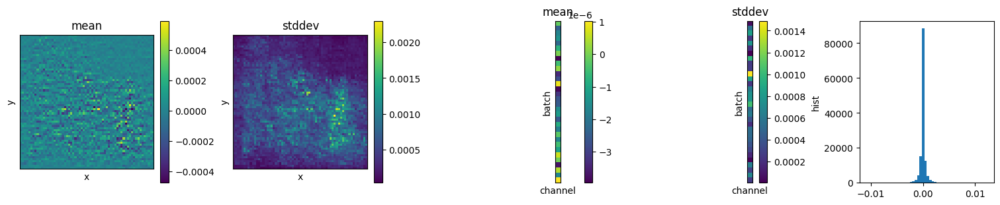

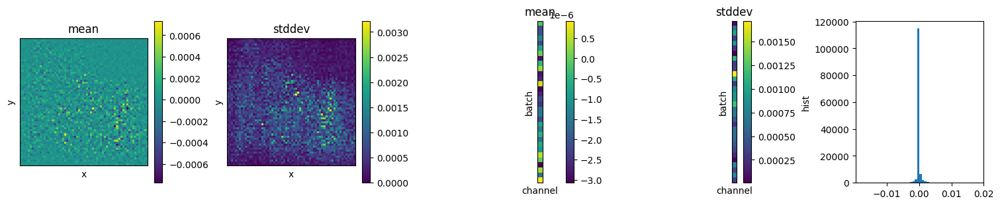

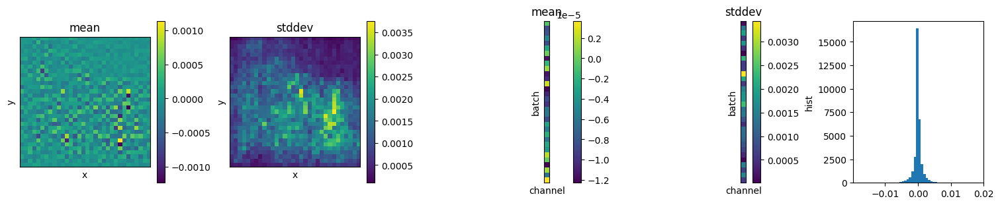

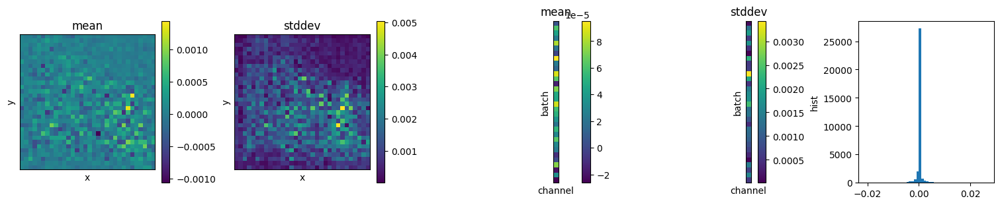

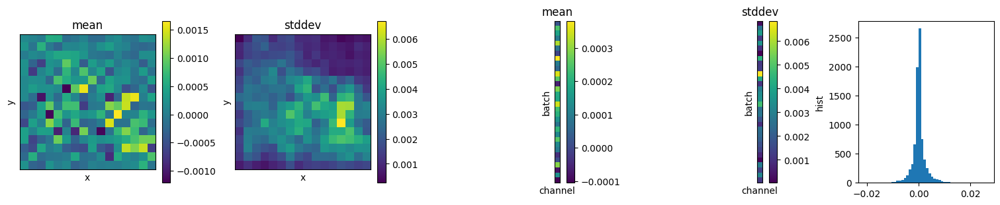

In [25]:
# accumulated effect: maxpool on smaller layers with conv
input = tf.keras.Input(shape=(64, 64, 1))
x = layers.Conv2D(1, kernel_size=(3, 3), padding='same')(input)
x = layers.MaxPool2D()(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='same')(x)
x = layers.MaxPool2D()(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='same')(x)
x = layers.MaxPool2D()(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='same')(x)
x = layers.MaxPool2D()(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='same')(x)
x = layers.MaxPool2D()(x)
x = layers.Conv2D(1, kernel_size=(3, 3), padding='same')(x)
x = layers.MaxPool2D()(x)
parameter_gradients, input_gradients, layer_gradients, _ = gradients_for(x, inputs=input)
plot_image_batch(input_gradients)
# just plot earliest few layers
plot_image_batch(layer_gradients[0])
plot_image_batch(layer_gradients[1])
plot_image_batch(layer_gradients[2])
plot_image_batch(layer_gradients[3])

### Checkerboarding effects

Input:  (32, 32, 32, 1)
Output: (32, 16, 16, 2)
Loss:   1.2461034059524536 <- 1.3052453141426668e-05..12.878952026367188
Parameter gradients (8): [TensorShape([3, 3, 1, 2]), TensorShape([2]), TensorShape([3, 3, 2, 2]), TensorShape([2]), TensorShape([3, 3, 2, 2]), TensorShape([2]), TensorShape([3, 3, 2, 2]), TensorShape([2])]
Input gradients: (32, 32, 32, 1)
Layer gradients (5): [TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 16, 16, 2])]
Layer outputs (5): [TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 16, 16, 2])]


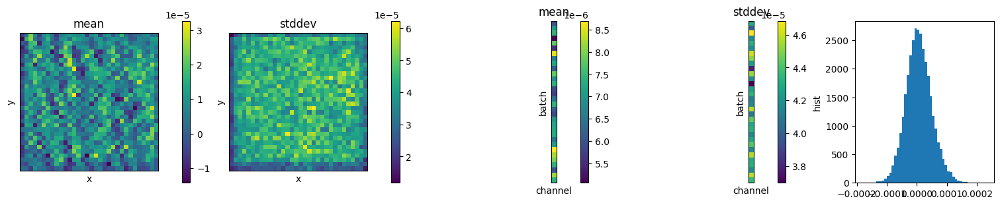

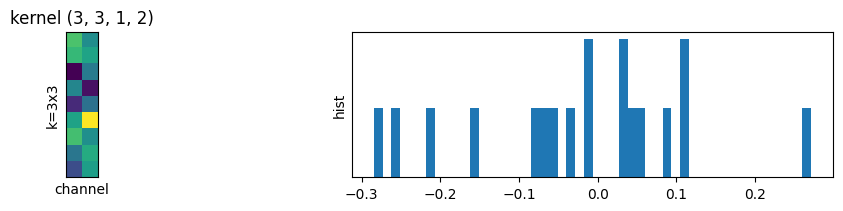

In [26]:
# Looking again at checkerboard pattern from convolutions
# - see: Zhang, R. (2019). Making Convolutional Networks Shift-Invariant Again. ICML. https://doi.org/10.48550/arXiv.1904.11486
# - see: Odena, et al. (2016). Deconvolution and Checkerboard Artifacts. Distill. http://doi.org/10.23915/distill.00003
input = tf.keras.Input(shape=(32, 32, 1))
features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(input)
features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(features)
features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(features)
features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(features)
x = layers.MaxPool2D()(features)   # <--- not so bad if this is omitted
parameter_gradients, input_gradients, _, _ = gradients_for(x, inputs=input)
plot_image_batch(input_gradients)
plot_kernel(parameter_gradients[0])

Input:  (32, 32, 32, 1)
Output: (32, 16, 16, 2)
Loss:   1.090209722518921 <- 0.00014757410099264234..10.341275215148926
Parameter gradients (10): [TensorShape([3, 3, 1, 2]), TensorShape([2]), TensorShape([3, 3, 2, 2]), TensorShape([2]), TensorShape([3, 3, 2, 2]), TensorShape([2]), TensorShape([3, 3, 2, 2]), TensorShape([2]), TensorShape([3, 3, 2, 2]), TensorShape([2])]
Input gradients: (32, 32, 32, 1)
Layer gradients (7): [TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), None, TensorShape([32, 16, 16, 2])]
Layer outputs (7): [TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 32, 32, 2]), TensorShape([32, 16, 16, 2])]


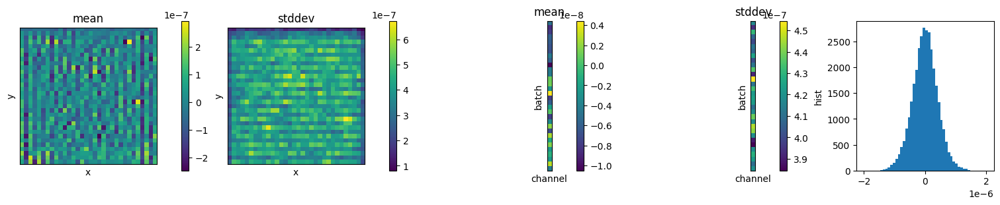

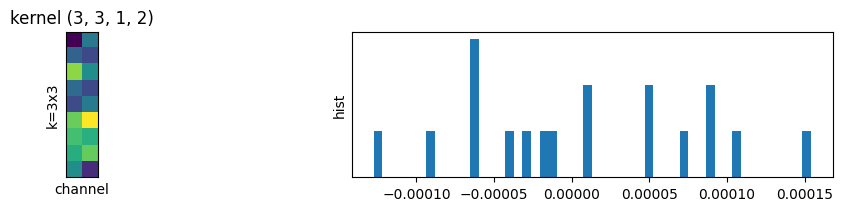

In [27]:
# "Expected Coordinate" via soft-selection
# - checkerboarding is significant at around 32x32 or larger, it's present at lower resolutions too but harder to visually spot the pattern
input = tf.keras.Input(shape=(32, 32, 1))
features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(input)
features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(features)
features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(features)
features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(features)
features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(features)
coords = CoordGrid2D()(input)
x = AttentionPool2D()(features, coords)
parameter_gradients, input_gradients, _, _ = gradients_for(x, inputs=input)
plot_image_batch(input_gradients)
plot_kernel(parameter_gradients[0])

### Looking at architectural types

Input:  (32, 149, 149, 1)
Output: (32, 32)
Loss:   2.0032010078430176 <- 1.1866552829742432..2.8747408390045166
Parameter gradients (2): [TensorShape([3, 3, 1, 32]), TensorShape([32])]
Input gradients: (32, 149, 149, 1)
Layer gradients (2): [TensorShape([32, 147, 147, 32]), TensorShape([32, 32])]
Layer outputs (2): [TensorShape([32, 147, 147, 32]), TensorShape([32, 32])]


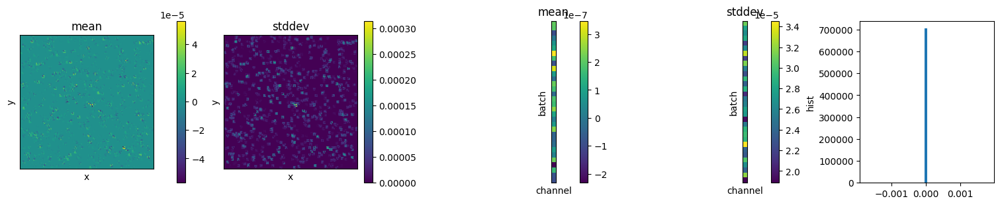

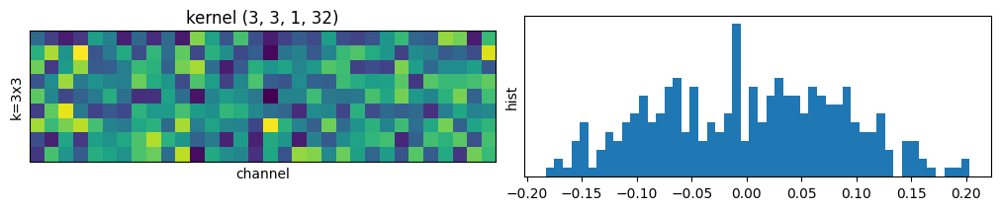

Input:  (32, 149, 149, 1)
Output: (32, 32)
Loss:   0.9247902631759644 <- 0.4296139180660248..1.7679312229156494
Parameter gradients (2): [TensorShape([3, 3, 1, 32]), TensorShape([32])]
Input gradients: (32, 149, 149, 1)
Layer gradients (2): [TensorShape([32, 147, 147, 32]), TensorShape([32, 32])]
Layer outputs (2): [TensorShape([32, 147, 147, 32]), TensorShape([32, 32])]


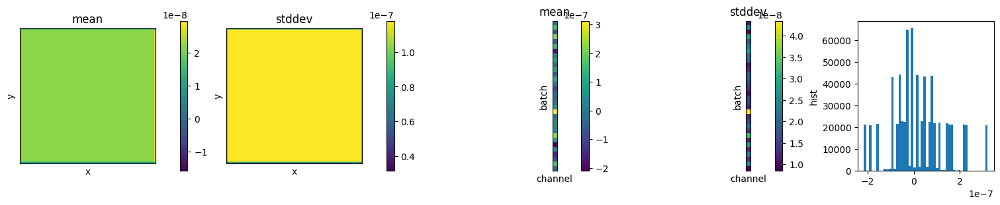

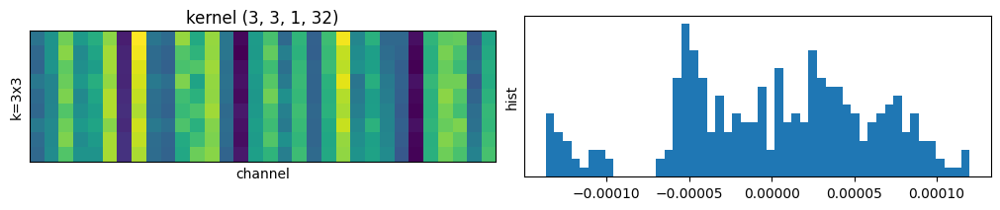

In [28]:
# Global pooling - GlobalMaxPool
input = tf.keras.Input(shape=(149, 149, 1))
x = layers.Conv2D(32, kernel_size=(3, 3))(input)
x = layers.GlobalMaxPool2D()(x)
parameter_gradients, input_gradients, _ , _= gradients_for(x, inputs=input)
plot_image_batch(input_gradients)
plot_kernel(parameter_gradients[0])

# Global pooling - GlobalAvePool
input = tf.keras.Input(shape=(149, 149, 1))
x = layers.Conv2D(32, kernel_size=(3, 3))(input)
x = layers.GlobalAveragePooling2D()(x)
parameter_gradients, input_gradients, _, _ = gradients_for(x, inputs=input)
plot_image_batch(input_gradients)
plot_kernel(parameter_gradients[0])

Input:  (32, 149, 149, 1)
Output: (32, 74, 74, 2)
Loss:   1.0812466144561768 <- 8.227489161072299e-06..12.859943389892578
Parameter gradients (2): [TensorShape([3, 3, 1, 32]), TensorShape([32])]
Input gradients: (32, 149, 149, 1)
Layer gradients (4): [TensorShape([32, 149, 149, 32]), None, TensorShape([32, 149, 149, 34]), TensorShape([32, 74, 74, 34])]
Layer outputs (4): [TensorShape([32, 149, 149, 32]), TensorShape([32, 149, 149, 2]), TensorShape([32, 149, 149, 34]), TensorShape([32, 74, 74, 34])]


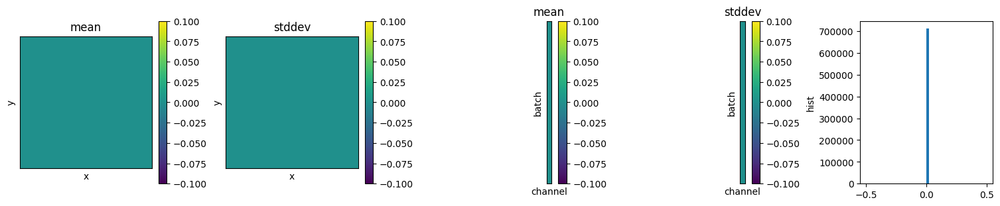

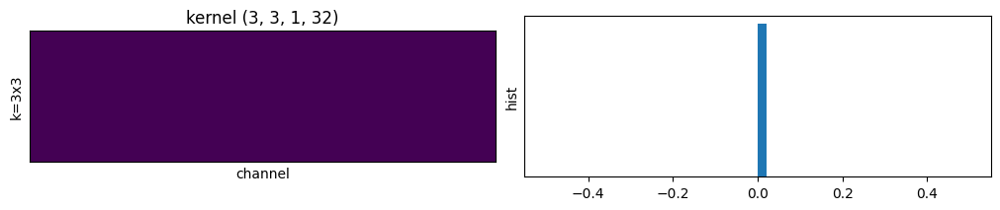

In [29]:
# Problem case: PositionwiseMaxPool with dropped semantic feature
input = tf.keras.Input(shape=(149, 149, 1))
coords = CoordGrid2D()(input)
x = layers.Conv2D(32, kernel_size=(3, 3), padding='same')(input)
x = layers.Concatenate()([x, coords])
x = PositionwiseMaxPool2D(pool_size=(2,2), channel_weights=[1]*32 + [0, 0])(x)
x = x[..., -2:]
parameter_gradients, input_gradients, _, _ = gradients_for(x, inputs=input)
plot_image_batch(input_gradients)
plot_kernel(parameter_gradients[0])

Input:  (32, 4, 4, 1)
Output: (32, 2, 2, 2)
Loss:   1.2601300477981567 <- 0.0005385552067309618..5.445145606994629
Parameter gradients (2): [TensorShape([3, 3, 1, 2]), TensorShape([2])]
Input gradients: (32, 4, 4, 1)
Layer gradients (3): [TensorShape([32, 4, 4, 2]), None, TensorShape([32, 2, 2, 2])]
Layer outputs (3): [TensorShape([32, 4, 4, 2]), TensorShape([32, 4, 4, 2]), TensorShape([32, 2, 2, 2])]


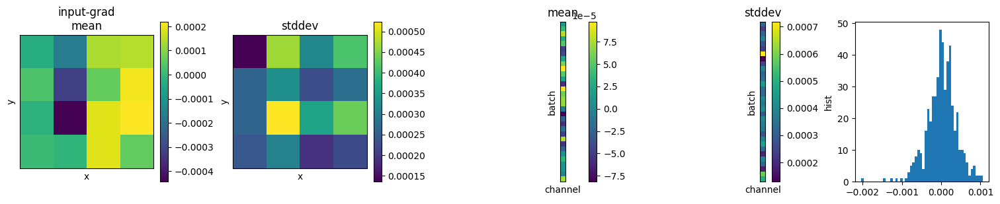

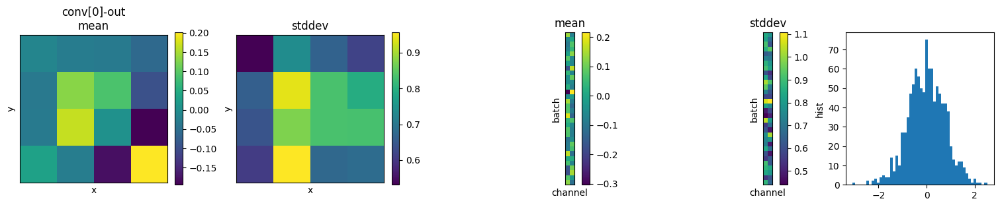

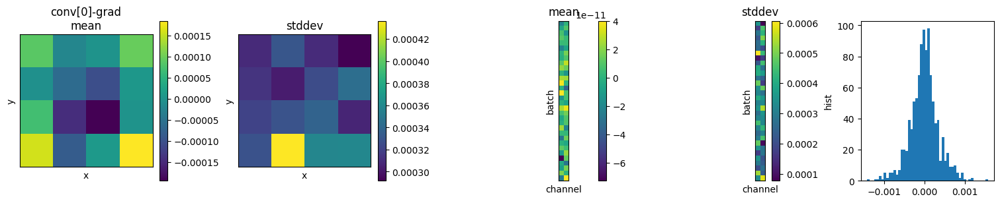

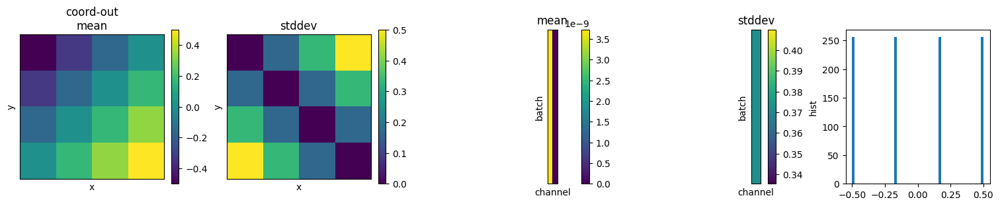

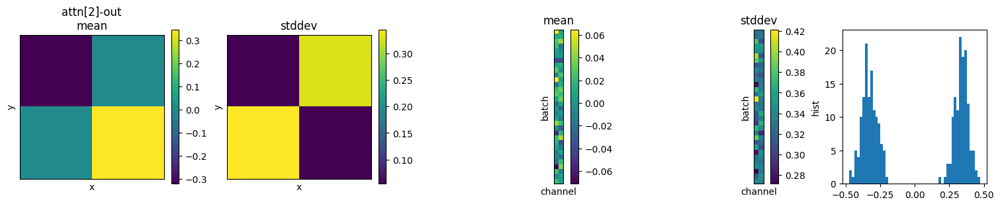

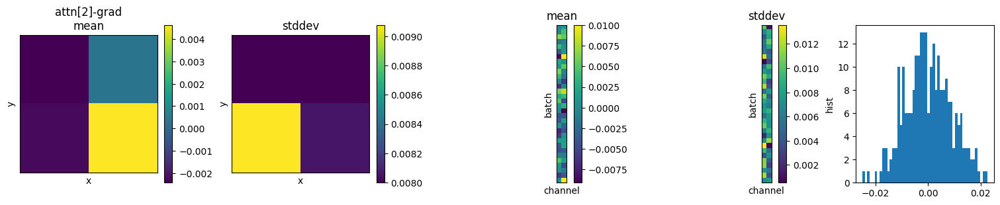

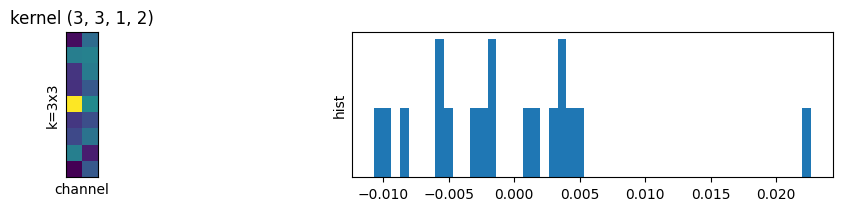

In [47]:
# "Expected Coordinate" via soft-selection
# - note that checkerboarding is significant at around 32x32 or larger
input = tf.keras.Input(shape=(4, 4, 1))
features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(input)
coords = CoordGrid2D()(input)  # -> layer_gradients[0] = None
x = AttentionPool2D()(features, coords)
parameter_gradients, input_gradients, layer_gradients, layer_outputs = gradients_for(x, inputs=input)
plot_image_batch(input_gradients, "input-grad")
plot_image_batch(layer_outputs[0], "conv[0]-out")
plot_image_batch(layer_gradients[0], "conv[0]-grad")
plot_image_batch(layer_outputs[1], "coord-out")
plot_image_batch(layer_outputs[2], "attn[2]-out")
plot_image_batch(layer_gradients[2], "attn[2]-grad")
plot_kernel(parameter_gradients[0])

Input:  (32, 4, 4, 1)
Output: (32, 2, 2, 2)
Loss:   1.0793241262435913 <- 0.015129734762012959..5.4306111335754395
Parameter gradients (2): [TensorShape([3, 3, 1, 2]), TensorShape([2])]
Input gradients: (32, 4, 4, 1)
Layer gradients (4): [TensorShape([32, 4, 4, 2]), TensorShape([32, 4, 4, 2]), None, TensorShape([32, 2, 2, 2])]
Layer outputs (4): [TensorShape([32, 4, 4, 2]), TensorShape([32, 4, 4, 2]), TensorShape([32, 4, 4, 2]), TensorShape([32, 2, 2, 2])]


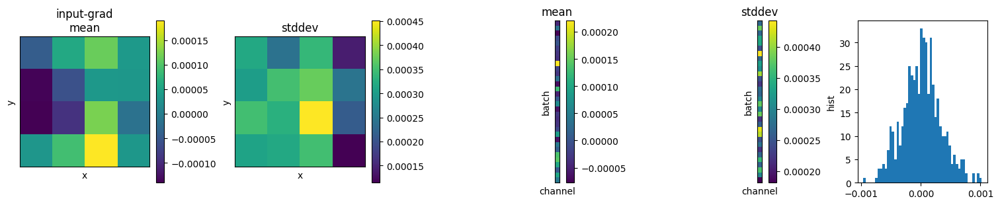

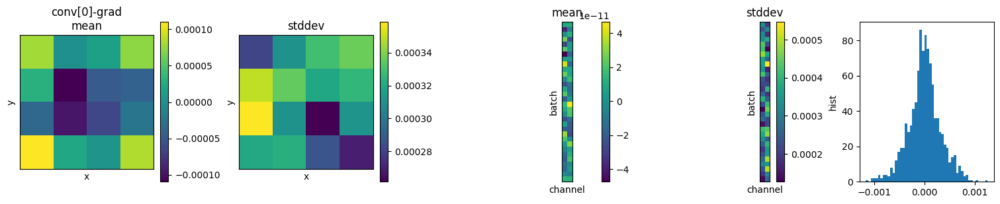

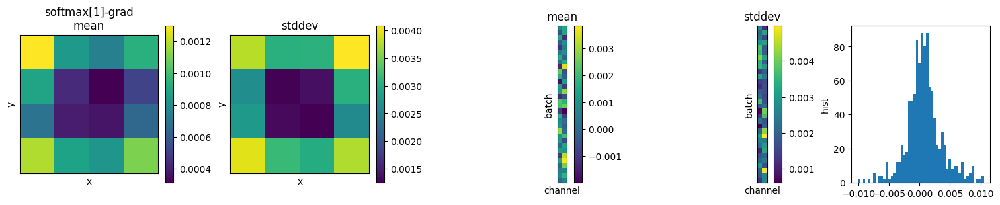

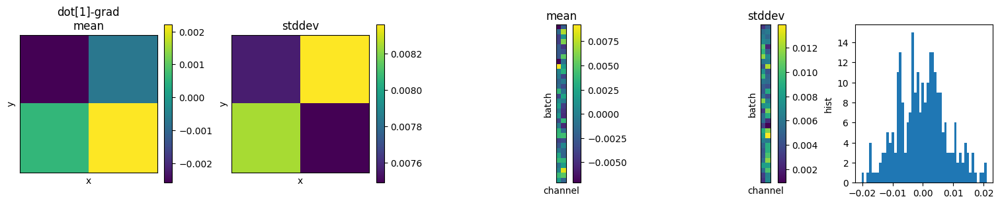

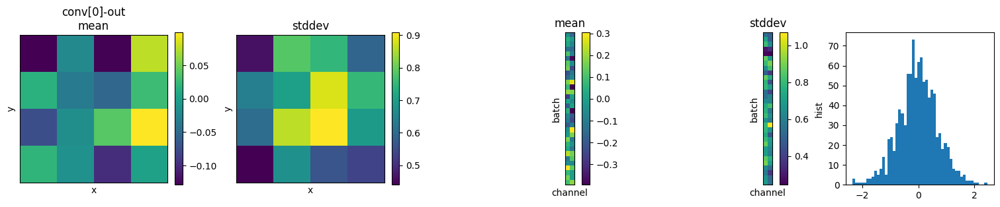

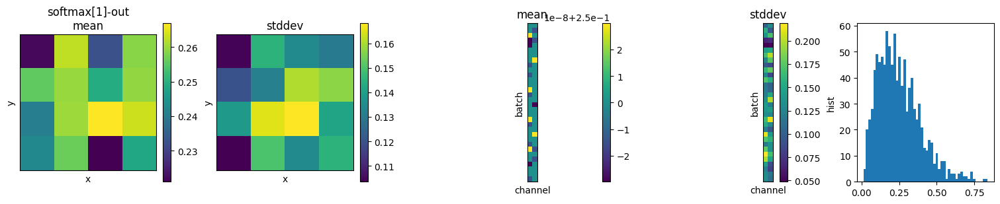

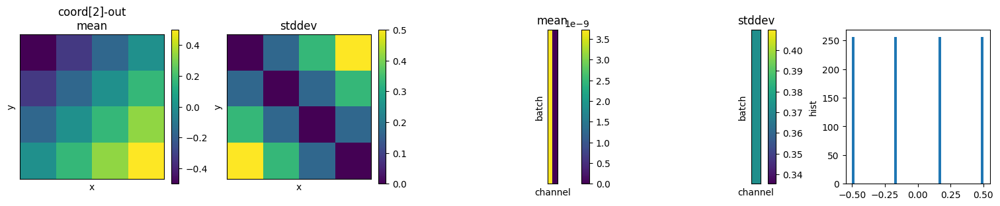

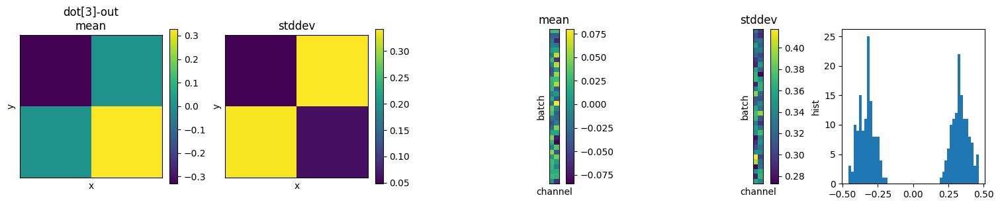

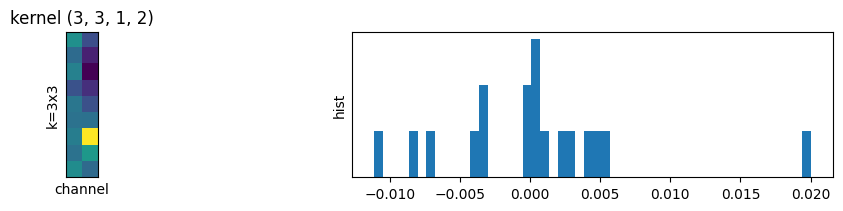

In [31]:
# "Expected Coordinate" via soft-selection (broken down)
input = tf.keras.Input(shape=(4, 4, 1))
features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(input)
features = StridedSoftmax2D()(features)
coords = CoordGrid2D()(input)  # -> layer_gradients[2] = None
x = DotPool2D()(features, coords)
parameter_gradients, input_gradients, layer_gradients, layer_outputs = gradients_for(x, inputs=input)
plot_image_batch(input_gradients, "input-grad")
plot_image_batch(layer_gradients[0], "conv[0]-grad")
plot_image_batch(layer_gradients[1], "softmax[1]-grad")
plot_image_batch(layer_gradients[3], "dot[1]-grad")
plot_image_batch(layer_outputs[0], "conv[0]-out")
plot_image_batch(layer_outputs[1], "softmax[1]-out")
plot_image_batch(layer_outputs[2], "coord[2]-out")
plot_image_batch(layer_outputs[3], "dot[3]-out")
plot_kernel(parameter_gradients[0])

### Comparing Architecture Efficiency
On very simple minimum-layer networks and very simple datasets.

In [58]:
def compare_model_efficiency(model, dataset, epochs=1000):
  model.compile(optimizer='adam', loss='mse', metrics=['mae'])
  history = tinstr.fit(model, dataset, epochs=1000, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])
  tinstr.plot_train_history(history)

  x, y_true = next(iter(dataset.take(1)))
  y_pred = model(x)
  print(f"input={x.shape}, output={y_pred.shape}")
  print(f"y_true[0]: {y_true[0].numpy().flatten()}")
  print(f"y_pred[0]: {y_pred[0].numpy().flatten()}")
  print(f"error[0]:  {(y_true - y_pred)[0].numpy().flatten()}")

Epoch   100 - 14.04ms/epoch: loss: 0.4856  mae: 0.5500  
Epoch   200 - 10.29ms/epoch: loss: 0.3484  mae: 0.4651  
Epoch   300 - 6.78ms/epoch: loss: 0.2866  mae: 0.4209  
Epoch   400 - 6.11ms/epoch: loss: 0.2495  mae: 0.3923  
Epoch   500 - 6.26ms/epoch: loss: 0.2229  mae: 0.3686  
Epoch   600 - 6.53ms/epoch: loss: 0.2071  mae: 0.3526  
Epoch   700 - 6.50ms/epoch: loss: 0.1985  mae: 0.3451  
Epoch   800 - 6.83ms/epoch: loss: 0.1853  mae: 0.3358  
Epoch   900 - 6.34ms/epoch: loss: 0.1754  mae: 0.3280  
Epoch  1000 - 6.33ms/epoch: loss: 0.1603  mae: 0.3104  
Total training time: 7.6 sec


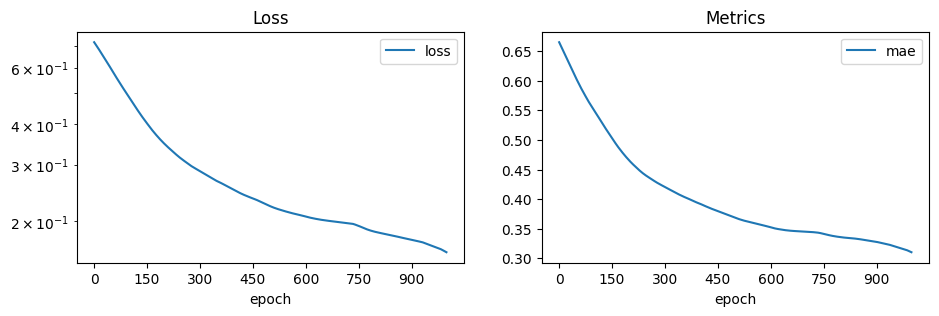

input=(32, 4, 4, 1), output=(32, 2, 2, 2)
y_true[0]: [0.47453076 0.47453076 1.1482275  1.1482275  0.3431165  0.3431165
 1.7083552  1.7083552 ]
y_pred[0]: [0.636413   0.34373334 1.2708653  0.96357155 0.6329834  0.5528396
 1.8246094  1.98924   ]
error[0]:  [-0.16188222  0.13079742 -0.12263787  0.1846559  -0.2898669  -0.20972309
 -0.11625421 -0.28088486]


In [66]:
# Direct Literal MaxPool
# - After conv, needs to
def get_model():
  input = tf.keras.Input(shape=(4, 4, 1))
  features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(input)
  out = layers.MaxPool2D(pool_size=(2,2))(features)
  return tf.keras.Model(inputs=input, outputs=out)

# dataset:
# - expected output is result of simple maxpool against original input
def get_dataset():
  x = tf.random.normal(shape=(32, 4, 4, 1))
  features = layers.Concatenate()([x, x])  # (32, 4, 4, 2)
  y_true = layers.MaxPool2D(pool_size=(2,2))(features)
  return x, y_true

model = get_model()
dataset = tf.data.Dataset.from_tensor_slices(get_dataset()).batch(32)
compare_model_efficiency(model, dataset)

Epoch   100 - 26.66ms/epoch: loss: 1.4609  mae: 1.0026  
Epoch   200 - 6.96ms/epoch: loss: 1.1687  mae: 0.8995  
Epoch   300 - 6.08ms/epoch: loss: 0.9650  mae: 0.8109  
Epoch   400 - 6.90ms/epoch: loss: 0.8134  mae: 0.7331  
Epoch   500 - 6.68ms/epoch: loss: 0.6943  mae: 0.6635  
Epoch   600 - 6.44ms/epoch: loss: 0.5978  mae: 0.6039  
Epoch   700 - 6.10ms/epoch: loss: 0.5192  mae: 0.5542  
Epoch   800 - 6.49ms/epoch: loss: 0.4552  mae: 0.5153  
Epoch   900 - 6.36ms/epoch: loss: 0.4037  mae: 0.4841  
Epoch  1000 - 7.38ms/epoch: loss: 0.3627  mae: 0.4594  
Total training time: 8.6 sec


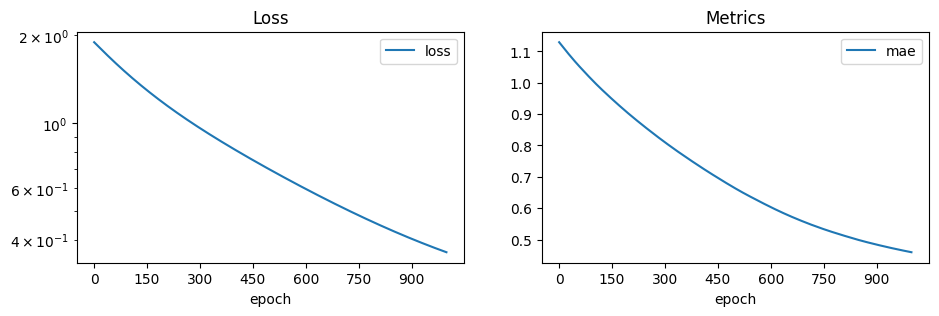

input=(32, 4, 4, 1), output=(32, 2, 2, 2)
y_true[0]: [1.7057413 1.7057413 1.2035962 1.2035962 2.901056  2.901056  1.3419441
 1.3419441]
y_pred[0]: [1.6742144  1.738468   0.48268104 0.5702791  1.5677564  1.4949038
 1.5183711  1.530559  ]
error[0]:  [ 0.03152692 -0.03272676  0.7209152   0.6333171   1.3332996   1.4061522
 -0.176427   -0.18861485]

Epoch   100 - 15.20ms/epoch: loss: 0.1588  mae: 0.3033  
Epoch   200 - 6.88ms/epoch: loss: 0.1300  mae: 0.2840  
Epoch   300 - 7.10ms/epoch: loss: 0.1186  mae: 0.2683  
Epoch   400 - 9.75ms/epoch: loss: 0.1120  mae: 0.2566  
Epoch   500 - 10.65ms/epoch: loss: 0.1084  mae: 0.2495  
Epoch   600 - 8.47ms/epoch: loss: 0.1064  mae: 0.2465  
Epoch   700 - 6.51ms/epoch: loss: 0.1054  mae: 0.2457  
Epoch   800 - 7.28ms/epoch: loss: 0.1049  mae: 0.2452  
Epoch   900 - 7.31ms/epoch: loss: 0.1047  mae: 0.2447  
Epoch  1000 - 7.04ms/epoch: loss: 0.1045  mae: 0.2444  
Total training time: 8.6 sec


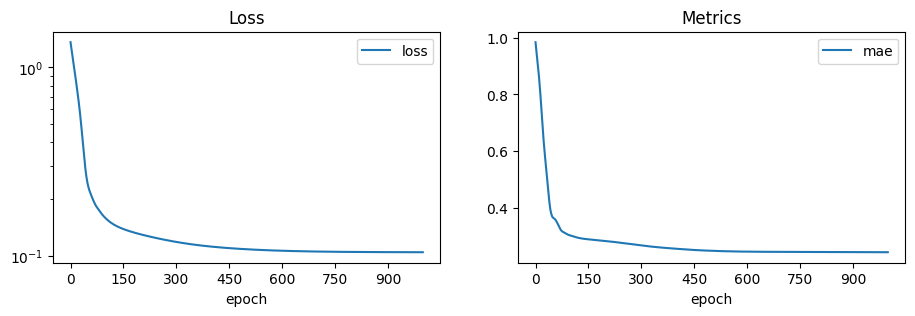

input=(32, 4, 4, 1), output=(32, 2, 2, 2)
y_true[0]: [0.32955897 0.32955897 0.17763178 0.17763178 0.78421557 0.78421557
 2.3789334  2.3789334 ]
y_pred[0]: [0.50874776 0.50447315 0.35010603 0.3498448  0.46651757 0.45239282
 1.888346   1.8833017 ]
error[0]:  [-0.17918879 -0.17491418 -0.17247425 -0.17221303  0.317698    0.33182275
  0.49058747  0.4956317 ]


In [80]:
# Direct Literal AvePool as a model of MaxPool
def get_model(mode="small"):
  input = tf.keras.Input(shape=(4, 4, 1))
  features = input
  if mode == "big":
    features = layers.Conv2D(16, kernel_size=(3, 3), padding='same')(features)
    features = layers.Conv2D(16, kernel_size=(3, 3), padding='same')(features)
  features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(features)
  out = layers.AveragePooling2D(pool_size=(2,2))(features)
  return tf.keras.Model(inputs=input, outputs=out)

# dataset:
# - expected output is result of simple maxpool against original input
def get_dataset():
  x = tf.random.normal(shape=(32, 4, 4, 1))
  features = layers.Concatenate()([x, x])  # (32, 4, 4, 2)
  y_true = layers.MaxPool2D(pool_size=(2,2))(features)
  return x, y_true

model = get_model("small")
dataset = tf.data.Dataset.from_tensor_slices(get_dataset()).batch(32)
compare_model_efficiency(model, dataset)

print()
model = get_model("big")
dataset = tf.data.Dataset.from_tensor_slices(get_dataset()).batch(32)
compare_model_efficiency(model, dataset)

In [56]:
# Literal MaxPool against coords
def get_model():
  input = tf.keras.Input(shape=(4, 4, 1))
  features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(input)
  coords = CoordGrid2D()(input)
  data = layers.Concatenate()([features, coords])
  out = PositionwiseMaxPool2D(pool_size=(2,2), channel_weights=[1, 0, 0])(data)
  return tf.keras.Model(inputs=input, outputs=out)

# dataset:
# - expected output is result of simple maxpool against coords
def get_dataset():
  x = tf.random.normal(shape=(32, 4, 4, 1))
  coords = CoordGrid2D()(x)
  data = layers.Concatenate()([x, coords])
  y_true = PositionwiseMaxPool2D(pool_size=(2,2), channel_weights=[1, 0, 0])(data)
  y_true = y_true[..., -2:]
  return x, y_true

model = get_model()
dataset = tf.data.Dataset.from_tensor_slices(get_dataset()).batch(32)
compare_model_efficiency(model, dataset)

ValueError: Exception encountered when calling PositionwiseMaxPool2D.call().

[1mCould not automatically infer the output shape / dtype of 'positionwise_max_pool2d_6' (of type PositionwiseMaxPool2D). Either the `PositionwiseMaxPool2D.call()` method is incorrect, or you need to implement the `PositionwiseMaxPool2D.compute_output_spec() / compute_output_shape()` method. Error encountered:

Dimensions must be equal, but are 4 and 3 for '{{node mul}} = Mul[T=DT_FLOAT](Square, mul/y)' with input shapes: [?,2,2,4,4], [3].[0m

Arguments received by PositionwiseMaxPool2D.call():
  • args=('<KerasTensor shape=(None, 4, 4, 4), dtype=float32, sparse=False, name=keras_tensor_128>',)
  • kwargs=<class 'inspect._empty'>

Epoch   100 - 15.80ms/epoch: loss: 0.0277  mae: 0.1609  
Epoch   200 - 6.75ms/epoch: loss: 0.0256  mae: 0.1552  
Epoch   300 - 6.15ms/epoch: loss: 0.0242  mae: 0.1504  
Epoch   400 - 6.53ms/epoch: loss: 0.0229  mae: 0.1455  
Epoch   500 - 6.42ms/epoch: loss: 0.0219  mae: 0.1407  
Epoch   600 - 6.91ms/epoch: loss: 0.0211  mae: 0.1365  
Epoch   700 - 8.98ms/epoch: loss: 0.0205  mae: 0.1331  
Epoch   800 - 10.91ms/epoch: loss: 0.0201  mae: 0.1301  
Epoch   900 - 7.99ms/epoch: loss: 0.0197  mae: 0.1276  
Epoch  1000 - 7.54ms/epoch: loss: 0.0194  mae: 0.1254  
Total training time: 8.4 sec


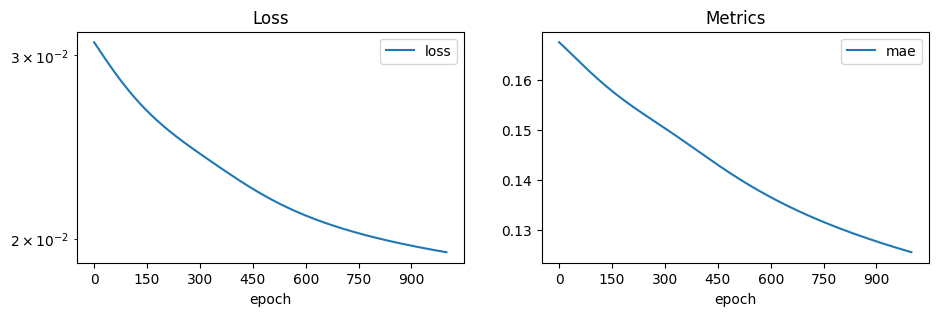

input=(32, 4, 4, 1), output=(32, 2, 2, 2)
y_true[0]: [-0.5        -0.5         0.16666669 -0.16666666 -0.5         0.16666669
  0.16666669  0.5       ]
y_pred[0]: [-0.3167928  -0.3830957   0.23122033 -0.3062971  -0.35651705  0.35967362
  0.3390803   0.337727  ]
error[0]:  [-0.18320721 -0.11690429 -0.06455365  0.13963044 -0.14348295 -0.19300693
 -0.17241362  0.16227299]


In [67]:
# "Expected Coordinate" via soft-selection (broken down)
def get_model():
  input = tf.keras.Input(shape=(4, 4, 1))
  features = layers.Conv2D(2, kernel_size=(3, 3), padding='same')(input)
  features = StridedSoftmax2D()(features)
  coords = CoordGrid2D()(input)
  out = DotPool2D()(features, coords)
  return tf.keras.Model(inputs=input, outputs=out)

# dataset:
# - expected output is result of simple maxpool against coords
def get_dataset():
  x = tf.random.normal(shape=(32, 4, 4, 1))
  coords = CoordGrid2D()(x)
  data = layers.Concatenate()([x, coords])
  y_true = PositionwiseMaxPool2D(pool_size=(2,2), channel_weights=[1, 0, 0])(data)
  y_true = y_true[..., -2:]
  return x, y_true

model = get_model()
dataset = tf.data.Dataset.from_tensor_slices(get_dataset()).batch(32)
compare_model_efficiency(model, dataset)

## Models
Now we'll create a series of models with different techniques, so we can compare.

### Baseline Model
The baseline is a vanilla regression CNN that makes no attempt at customising to support spatial information.

In [16]:
# Check one-hot-encoding theory, but not that this model has 2 conv layers per block, so probably does have compression.
calculate_onehotencoding_theory(strides=2, blocks=7, max_channels=128)

Assuming one-hot-encoding theory and no representational compression:
  Required channels in last block for perfect resolution:  16,384
  Effective resolution at 128 channels (in blocks):        3.5
  Effective resolution at 128 channels (in pixels):        13.169863799599447


In [46]:
def baseline_model(min_filters=4, max_filters=4096, batch_norm=False, dropout=None):
  def downscale(filters, inp):
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(inp)
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    if batch_norm:
      x = layers.BatchNormalization()(x)
    if dropout is not None:
      x = layers.Dropout(dropout)(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  # 149x149x1 -> 1x1x2
  filters = min_filters
  x = downscale(min(filters*1, max_filters), x)   # 74x74x4
  x = downscale(min(filters*2, max_filters), x)   # 37x37x8
  x = downscale(min(filters*4, max_filters), x)  # 18x18x16
  x = downscale(min(filters*8, max_filters), x)  # 9x9x32
  x = downscale(min(filters*16, max_filters), x)  # 4x4x64
  x = downscale(min(filters*32, max_filters), x) # 2x2x128
  x = downscale(min(filters*32, max_filters), x) # 1x1x128
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

baseline_model().summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 149, 149, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 149, 149, 4)    │            40 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 149, 149, 4)    │           148 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 4)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 74, 74, 8)      │           296 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 74, 74, 8)      │           584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 37, 37, 16)     │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 37, 37, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 18, 18, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 18, 18, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 9, 9, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 9, 9, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 9, 9, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 4, 4, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 4, 4, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 4, 4, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 2, 2, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 2, 2, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 1, 1, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 590,734 (2.25 MB)

 Trainable params: 590,734 (2.25 MB)

 Non-trainable params: 0 (0.00 B)

In [47]:
#dataset = train_data.map(to_training_sample).prefetch(True).batch(32)

# Baseline model
dataset = train_data.batch(32)
model = baseline_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=10)
history = model.fit(dataset, epochs=2, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 17s 165ms/step - loss: 0.0677 - mae: 0.1975
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0214 - mae: 0.1266
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0205 - mae: 0.1241
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0115 - mae: 0.0862
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0023 - mae: 0.0352
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 6.9517e-04 - mae: 0.0203
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 5.7521e-04 - mae: 0.0187
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 5.6922e-04 - mae: 0.0188
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 3.9626e-04 - mae: 0.0155
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 2.6200e-04 - mae: 0.0125
Epoch     1 - 351.09ms/epoch: loss: 0.0002  mae: 0.0117  
Epoch     2 - 367.36ms/epoch: loss: 0.0002  mae: 0.0114  
Total training time: 0.7 sec


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step
pred.x: -0.11793530732393265..0.4021591246128082
pred.y: -0.11131834238767624..0.4092855751514435


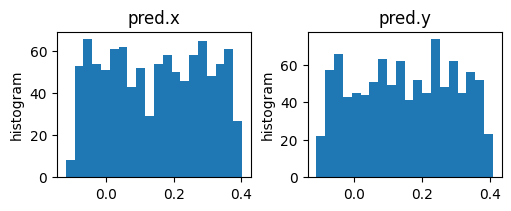

In [ ]:
quick_show_preds(model, dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


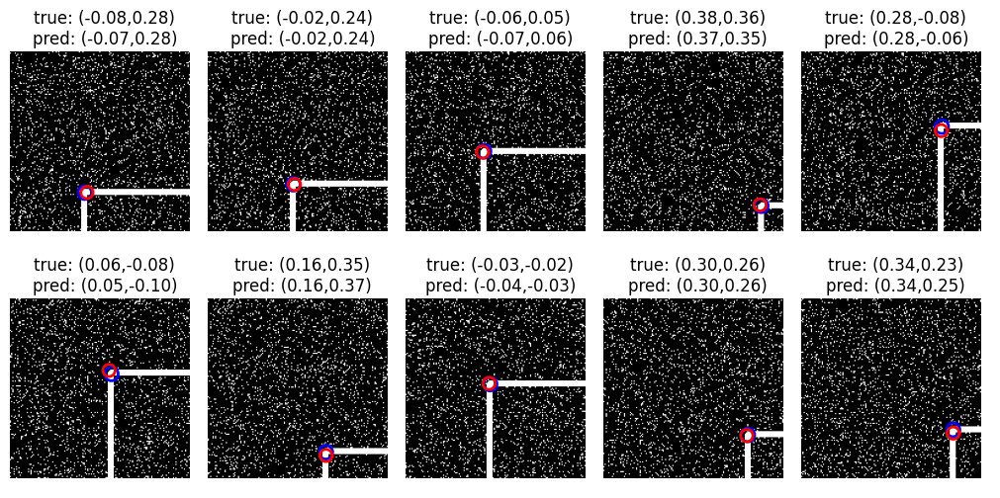

In [ ]:
plot_dataset(train_data, model)

### Fully-Convolutional model
For a first simple comparison to the baseline model. Here's a so called "Fully Convolutional" model that stays at full resolution and then uses global pooling to convert to the regression output.


In [70]:
# Fully-Convolutional model
def fullconv_model(reduction='mean', max_filters=128):
  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  x = layers.Conv2D(min(128, max_filters), kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
  x = layers.MaxPooling2D(pool_size=2)(x)   # 74x74x128
  x = layers.Conv2D(min(128, max_filters), kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
  x = layers.MaxPooling2D(pool_size=2)(x)   # 74x74x128
  x = layers.Conv2D(min(128, max_filters), kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
  if reduction == 'max':
    x = layers.GlobalMaxPool2D()(x)         # 128
  elif reduction == 'mean':
    x = layers.GlobalAveragePooling2D()(x)  # 128
  else:
    raise ValueError(f"Invalid reduction '{reduction}'")
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

fullconv_model().summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)     │ (None, 149, 149, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_99 (Conv2D)              │ (None, 149, 149, 128)  │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 74, 74, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_100 (Conv2D)             │ (None, 74, 74, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_101 (Conv2D)             │ (None, 37, 37, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_11 (Flatten)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 296,706 (1.13 MB)

 Trainable params: 296,706 (1.13 MB)

 Non-trainable params: 0 (0.00 B)

In [67]:
dataset = train_data.batch(32)
model = fullconv_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 3.66s/epoch: loss: 0.0215  mae: 0.1271  
Epoch    10 - 1.77s/epoch: loss: 0.0214  mae: 0.1267  
Epoch    15 - 1.95s/epoch: loss: 0.0201  mae: 0.1225  
Epoch    20 - 1.79s/epoch: loss: 0.0031  mae: 0.0434  
Epoch    25 - 1.94s/epoch: loss: 0.0001  mae: 0.0068  
Epoch    30 - 1.78s/epoch: loss: 0.0001  mae: 0.0062  
Epoch    35 - 1.74s/epoch: loss: 0.0001  mae: 0.0059  
Epoch    40 - 1.78s/epoch: loss: 0.0001  mae: 0.0058  
Epoch    45 - 1.91s/epoch: loss: 0.0001  mae: 0.0054  
Epoch    50 - 1.80s/epoch: loss: 0.0000  mae: 0.0049  
Total training time: 100.6 sec


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step
pred.x: -0.10234498977661133..0.4022652208805084
pred.y: -0.08966237306594849..0.4153406620025635


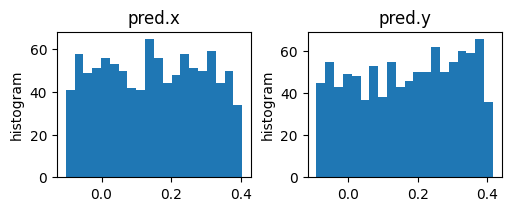

In [68]:
quick_show_preds(model, dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


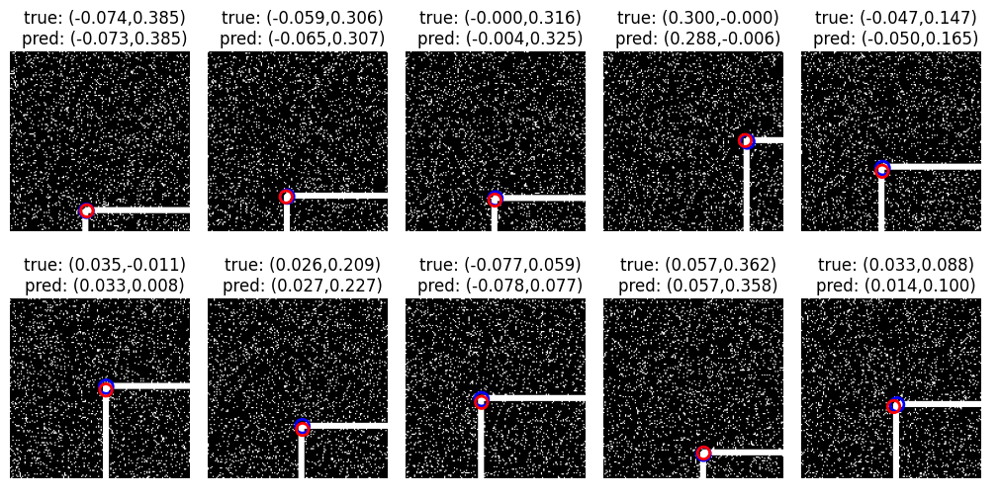

In [69]:
plot_dataset(train_data, model)

### Chat GPT Models
For more "baseline-like" comparisons, here's the model proposed by Chat GPT. The first one is the direct suggestion by Chat GPT, which stops its downscalling after only a couple of blocks and then uses a Dense layer for regression. This is a weird half-way house, so don't great because I want to understand the pros/cons of the fundamental architectural styles.

A second variant takes the same architecture to its logical extension after downscaling to the regression output shape.

In [ ]:
# Chat GPT model
def chatgpt_model():
    inputs = tf.keras.Input(shape=(149, 149, 1))
    x = tf.keras.layers.Conv2D(32, kernel_size=3, activation='relu')(inputs)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 73x73x32
    x = tf.keras.layers.Conv2D(64, kernel_size=3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 35x35x64
    x = tf.keras.layers.Flatten()(x)                  # (35*35*64)
    x = tf.keras.layers.Dense(64, activation='relu')(x)  # 64
    outputs = tf.keras.layers.Dense(2)(x)  # Linear activation for regression
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

chatgpt_model().summary()

Model: "functional_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_54 (InputLayer)     │ (None, 149, 149, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_177 (Conv2D)             │ (None, 147, 147, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_64 (MaxPooling2D) │ (None, 73, 73, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_178 (Conv2D)             │ (None, 71, 71, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_65 (MaxPooling2D) │ (None, 35, 35, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_32 (Flatten)            │ (None, 78400)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 64)             │     5,017,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,036,610 (19.21 MB)

 Trainable params: 5,036,610 (19.21 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
dataset = train_data.batch(32)
model = chatgpt_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.19s/epoch: loss: 0.0042  mae: 0.0526  
Epoch    10 - 498.80ms/epoch: loss: 0.0150  mae: 0.1004  
Epoch    15 - 493.68ms/epoch: loss: 0.0018  mae: 0.0343  
Epoch    20 - 554.35ms/epoch: loss: 0.0095  mae: 0.0836  
Epoch    25 - 529.00ms/epoch: loss: 0.0004  mae: 0.0153  
Epoch    30 - 504.59ms/epoch: loss: 0.0001  mae: 0.0075  
Epoch    35 - 498.00ms/epoch: loss: 0.0001  mae: 0.0050  
Epoch    40 - 499.45ms/epoch: loss: 0.0001  mae: 0.0044  
Epoch    45 - 534.91ms/epoch: loss: 0.0001  mae: 0.0044  
Epoch    50 - 530.55ms/epoch: loss: 0.0001  mae: 0.0046  
Total training time: 29.2 sec


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
pred.x: -0.11071040481328964..0.39714524149894714
pred.y: -0.13155904412269592..0.3883061707019806


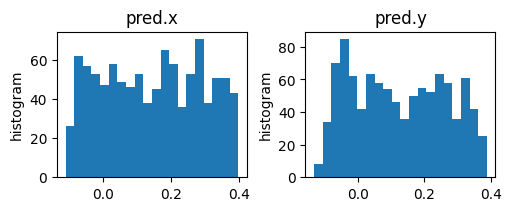

In [ ]:
quick_show_preds(model, dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step


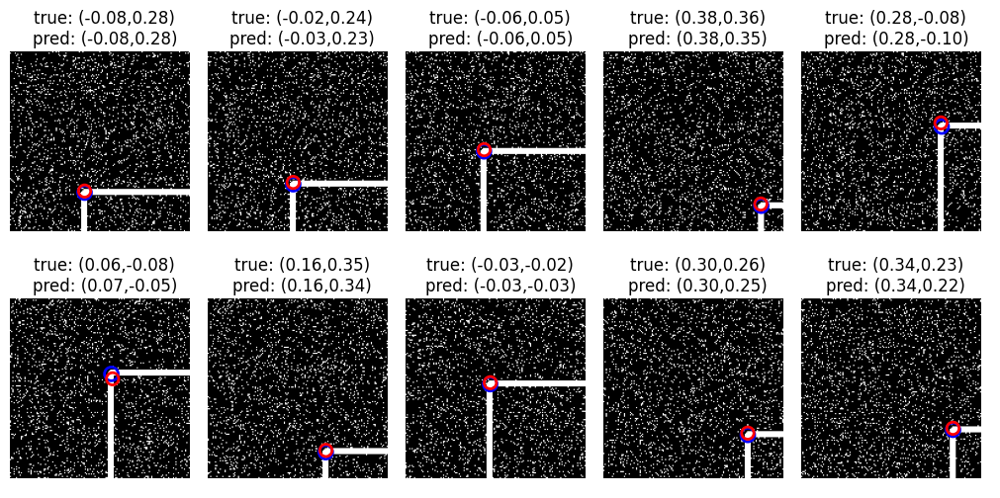

In [ ]:
plot_dataset(train_data, model)

In [ ]:
# Logical extension of Chat GPT model
def extreme_chatgpt_model(min_filters=32, max_filters=4096):
    inputs = tf.keras.Input(shape=(149, 149, 1))
    filters=min_filters
    x = tf.keras.layers.Conv2D(min(filters*1, max_filters), kernel_size=3, activation='relu')(inputs)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 73x73x32
    x = tf.keras.layers.Conv2D(min(filters*2, max_filters), kernel_size=3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 35x35x64
    x = tf.keras.layers.Conv2D(min(filters*4, max_filters), kernel_size=3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 16x16x128
    x = tf.keras.layers.Conv2D(min(filters*8, max_filters), kernel_size=3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 7x7x256
    x = tf.keras.layers.Conv2D(min(filters*16, max_filters), kernel_size=3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 2x2x512
    x = tf.keras.layers.Conv2D(min(filters*16, max_filters), kernel_size=3, padding='same', activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=2)(x)  # 1x1x512
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(min(64, max_filters), activation='relu')(x)
    outputs = tf.keras.layers.Dense(2)(x)  # Linear activation for regression
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

extreme_chatgpt_model().summary()
print()
calculate_onehotencoding_theory(strides=2, blocks=6, max_channels=512)
calculate_onehotencoding_theory(strides=2, blocks=6, max_channels=16)

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 149, 149, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 147, 147, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_37 (MaxPooling2D) │ (None, 73, 73, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_45 (Conv2D)              │ (None, 71, 71, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_38 (MaxPooling2D) │ (None, 35, 35, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_46 (Conv2D)              │ (None, 33, 33, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_39 (MaxPooling2D) │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_47 (Conv2D)              │ (None, 14, 14, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_40 (MaxPooling2D) │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_48 (Conv2D)              │ (None, 5, 5, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_41 (MaxPooling2D) │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_49 (Conv2D)              │ (None, 2, 2, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_42 (MaxPooling2D) │ (None, 1, 1, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 64)             │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,960,770 (15.11 MB)

 Trainable params: 3,960,770 (15.11 MB)

 Non-trainable params: 0 (0.00 B)


Assuming one-hot-encoding theory and no representational compression:
  Required channels in last block for perfect resolution:  4,096
  Effective resolution at 512 channels (in blocks):        4.5
  Effective resolution at 512 channels (in pixels):        6.584931899799724
Assuming one-hot-encoding theory and no representational compression:
  Required channels in last block for perfect resolution:  4,096
  Effective resolution at 16 channels (in blocks):        2.0
  Effective resolution at 16 channels (in pixels):        37.25


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 2.00s/epoch: loss: 0.0052  mae: 0.0418  
Epoch    10 - 820.93ms/epoch: loss: 0.0038  mae: 0.0327  
Epoch    15 - 912.50ms/epoch: loss: 0.0012  mae: 0.0226  
Epoch    20 - 841.00ms/epoch: loss: 0.0004  mae: 0.0134  
Epoch    25 - 833.06ms/epoch: loss: 0.0004  mae: 0.0147  
Epoch    30 - 829.35ms/epoch: loss: 0.0002  mae: 0.0100  
Epoch    35 - 1.00s/epoch: loss: 0.0002  mae: 0.0093  
Epoch    40 - 820.83ms/epoch: loss: 0.0001  mae: 0.0069  
Epoch    45 - 834.99ms/epoch: loss: 0.0001  mae: 0.0064  
Epoch    50 - 825.73ms/epoch: loss: 0.0001  mae: 0.0081  
Total training time: 48.6 sec


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step
pred.x: -0.09744839370250702..0.39086392521858215
pred.y: -0.09820431470870972..0.38109904527664185


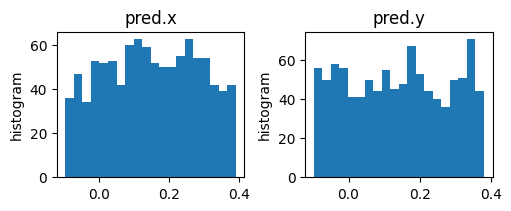

In [ ]:
quick_show_preds(model, dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


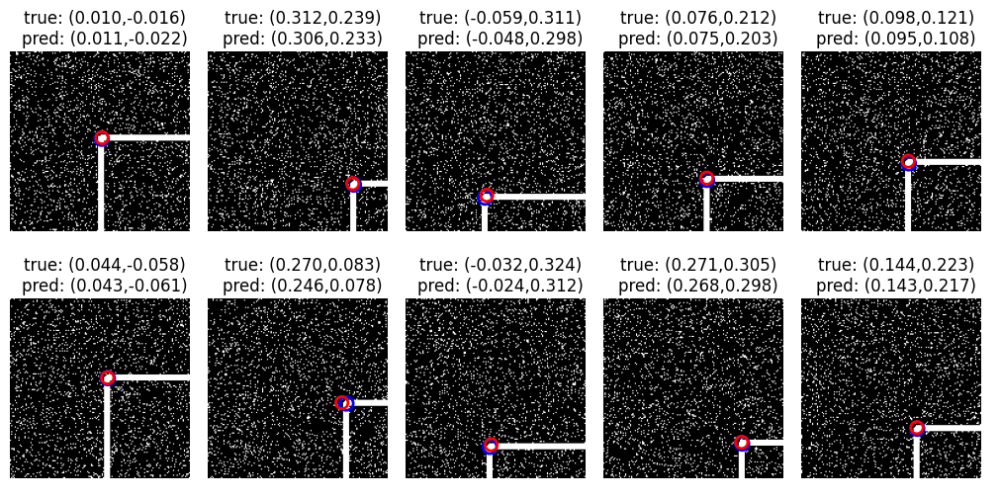

In [ ]:
plot_dataset(train_data, model)

In [ ]:
# extended chat-gpt model with only 16 filters
extreme_chatgpt_model(max_filters=16).summary()
print()
calculate_onehotencoding_theory(strides=2, blocks=6, max_channels=16)

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 149, 149, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_62 (Conv2D)              │ (None, 147, 147, 16)   │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_55 (MaxPooling2D) │ (None, 73, 73, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_63 (Conv2D)              │ (None, 71, 71, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_56 (MaxPooling2D) │ (None, 35, 35, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_64 (Conv2D)              │ (None, 33, 33, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_57 (MaxPooling2D) │ (None, 16, 16, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_65 (Conv2D)              │ (None, 14, 14, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_58 (MaxPooling2D) │ (None, 7, 7, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_66 (Conv2D)              │ (None, 5, 5, 16)       │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_59 (MaxPooling2D) │ (None, 2, 2, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_67 (Conv2D)              │ (None, 2, 2, 16)       │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_60 (MaxPooling2D) │ (None, 1, 1, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 16)             │           272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 2)              │            34 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,066 (47.13 KB)

 Trainable params: 12,066 (47.13 KB)

 Non-trainable params: 0 (0.00 B)


Assuming one-hot-encoding theory and no representational compression:
  Required channels in last block for perfect resolution:  4,096
  Effective resolution at 16 channels (in blocks):        2.0
  Effective resolution at 16 channels (in pixels):        37.25


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=16)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
#history = model.fit(dataset, epochs=1)
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.69s/epoch: loss: 0.0194  mae: 0.1195  
Epoch    10 - 272.53ms/epoch: loss: 0.0050  mae: 0.0426  
Epoch    15 - 271.86ms/epoch: loss: 0.0038  mae: 0.0357  
Epoch    20 - 270.25ms/epoch: loss: 0.0020  mae: 0.0283  
Epoch    25 - 269.92ms/epoch: loss: 0.0011  mae: 0.0244  
Epoch    30 - 272.47ms/epoch: loss: 0.0008  mae: 0.0206  
Epoch    35 - 272.70ms/epoch: loss: 0.0011  mae: 0.0246  
Epoch    40 - 288.91ms/epoch: loss: 0.0004  mae: 0.0155  
Epoch    45 - 299.46ms/epoch: loss: 0.0003  mae: 0.0143  
Epoch    50 - 269.67ms/epoch: loss: 0.0004  mae: 0.0166  
Total training time: 20.9 sec


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


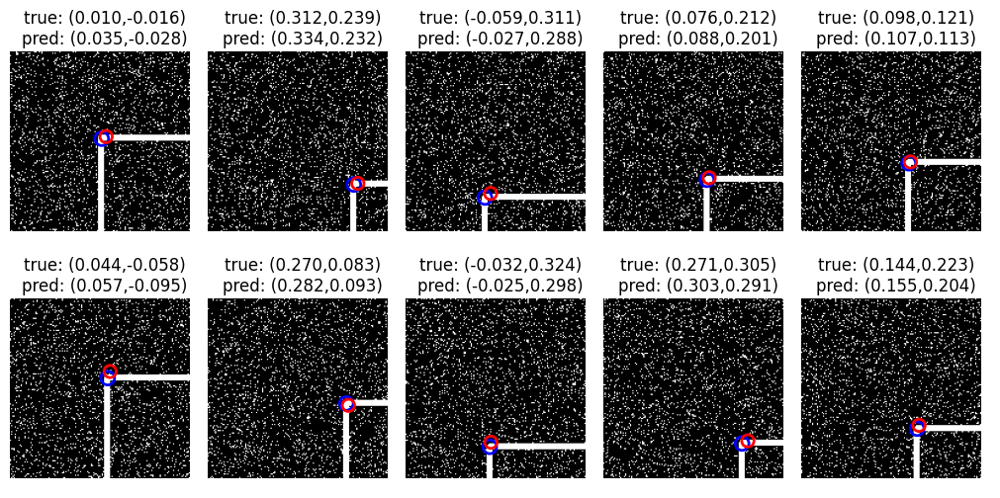

In [ ]:
plot_dataset(train_data, model)

In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=2)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.46s/epoch: loss: 0.0227  mae: 0.1279  
Epoch    10 - 216.40ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    15 - 142.73ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    20 - 139.06ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    25 - 162.58ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    30 - 237.51ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    35 - 208.73ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    40 - 176.53ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    45 - 164.90ms/epoch: loss: 0.0208  mae: 0.1241  
Epoch    50 - 218.62ms/epoch: loss: 0.0208  mae: 0.1241  
Total training time: 15.6 sec


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=4)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.16s/epoch: loss: 0.0205  mae: 0.1231  
Epoch    10 - 147.28ms/epoch: loss: 0.0191  mae: 0.1186  
Epoch    15 - 185.46ms/epoch: loss: 0.0109  mae: 0.0815  
Epoch    20 - 266.03ms/epoch: loss: 0.0095  mae: 0.0732  
Epoch    25 - 172.83ms/epoch: loss: 0.0087  mae: 0.0686  
Epoch    30 - 224.56ms/epoch: loss: 0.0080  mae: 0.0653  
Epoch    35 - 253.38ms/epoch: loss: 0.0071  mae: 0.0609  
Epoch    40 - 263.21ms/epoch: loss: 0.0064  mae: 0.0579  
Epoch    45 - 192.12ms/epoch: loss: 0.0062  mae: 0.0565  
Epoch    50 - 190.16ms/epoch: loss: 0.0056  mae: 0.0533  
Total training time: 15.3 sec


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=8)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.53s/epoch: loss: 0.0203  mae: 0.1223  
Epoch    10 - 422.19ms/epoch: loss: 0.0087  mae: 0.0694  
Epoch    15 - 295.53ms/epoch: loss: 0.0056  mae: 0.0481  
Epoch    20 - 245.30ms/epoch: loss: 0.0048  mae: 0.0435  
Epoch    25 - 280.92ms/epoch: loss: 0.0042  mae: 0.0399  
Epoch    30 - 286.95ms/epoch: loss: 0.0035  mae: 0.0366  
Epoch    35 - 233.51ms/epoch: loss: 0.0029  mae: 0.0338  
Epoch    40 - 231.84ms/epoch: loss: 0.0025  mae: 0.0338  
Epoch    45 - 221.84ms/epoch: loss: 0.0016  mae: 0.0271  
Epoch    50 - 243.59ms/epoch: loss: 0.0012  mae: 0.0252  
Total training time: 19.9 sec


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=16)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.10s/epoch: loss: 0.0205  mae: 0.1232  
Epoch    10 - 304.75ms/epoch: loss: 0.0071  mae: 0.0588  
Epoch    15 - 267.17ms/epoch: loss: 0.0046  mae: 0.0403  
Epoch    20 - 285.34ms/epoch: loss: 0.0036  mae: 0.0361  
Epoch    25 - 300.98ms/epoch: loss: 0.0016  mae: 0.0261  
Epoch    30 - 271.01ms/epoch: loss: 0.0010  mae: 0.0230  
Epoch    35 - 278.61ms/epoch: loss: 0.0007  mae: 0.0192  
Epoch    40 - 268.65ms/epoch: loss: 0.0008  mae: 0.0223  
Epoch    45 - 274.87ms/epoch: loss: 0.0005  mae: 0.0183  
Epoch    50 - 272.49ms/epoch: loss: 0.0006  mae: 0.0197  
Total training time: 18.1 sec


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=32)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.85s/epoch: loss: 0.0168  mae: 0.1082  
Epoch    10 - 472.53ms/epoch: loss: 0.0047  mae: 0.0402  
Epoch    15 - 432.57ms/epoch: loss: 0.0037  mae: 0.0345  
Epoch    20 - 474.02ms/epoch: loss: 0.0019  mae: 0.0278  
Epoch    25 - 478.61ms/epoch: loss: 0.0005  mae: 0.0165  
Epoch    30 - 434.30ms/epoch: loss: 0.0003  mae: 0.0140  
Epoch    35 - 436.52ms/epoch: loss: 0.0003  mae: 0.0125  
Epoch    40 - 431.29ms/epoch: loss: 0.0003  mae: 0.0126  
Epoch    45 - 438.85ms/epoch: loss: 0.0001  mae: 0.0078  
Epoch    50 - 514.79ms/epoch: loss: 0.0001  mae: 0.0069  
Total training time: 29.8 sec


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=64)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 1.54s/epoch: loss: 0.0075  mae: 0.0588  
Epoch    10 - 564.41ms/epoch: loss: 0.0039  mae: 0.0339  
Epoch    15 - 545.46ms/epoch: loss: 0.0009  mae: 0.0200  
Epoch    20 - 559.01ms/epoch: loss: 0.0008  mae: 0.0181  
Epoch    25 - 538.17ms/epoch: loss: 0.0003  mae: 0.0133  
Epoch    30 - 596.19ms/epoch: loss: 0.0002  mae: 0.0108  
Epoch    35 - 564.81ms/epoch: loss: 0.0001  mae: 0.0087  
Epoch    40 - 544.70ms/epoch: loss: 0.0002  mae: 0.0117  
Epoch    45 - 538.89ms/epoch: loss: 0.0001  mae: 0.0085  
Epoch    50 - 538.06ms/epoch: loss: 0.0001  mae: 0.0082  
Total training time: 32.6 sec


In [ ]:
dataset = train_data.batch(32)
model = extreme_chatgpt_model(max_filters=128)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 2.04s/epoch: loss: 0.0149  mae: 0.0982  
Epoch    10 - 758.93ms/epoch: loss: 0.0040  mae: 0.0339  
Epoch    15 - 878.51ms/epoch: loss: 0.0017  mae: 0.0267  
Epoch    20 - 628.91ms/epoch: loss: 0.0009  mae: 0.0194  
Epoch    25 - 628.58ms/epoch: loss: 0.0006  mae: 0.0169  
Epoch    30 - 770.95ms/epoch: loss: 0.0003  mae: 0.0109  
Epoch    35 - 636.62ms/epoch: loss: 0.0002  mae: 0.0096  
Epoch    40 - 626.07ms/epoch: loss: 0.0002  mae: 0.0103  
Epoch    45 - 763.68ms/epoch: loss: 0.0001  mae: 0.0091  
Epoch    50 - 630.24ms/epoch: loss: 0.0001  mae: 0.0067  
Total training time: 41.8 sec


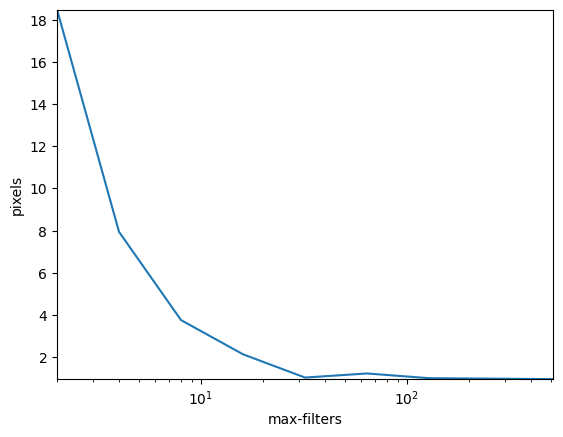

In [ ]:
# Comparing
data = np.array([
  [2, 0.1241],
  [4, 0.0533],
  [8, 0.0252],
  [16, 0.0143],
  [32, 0.0069],
  [64, 0.0082],
  [128, 0.0067],
  [512, 0.0064]
])
plt.plot(data[:,0], data[:,1]*149)
plt.xscale('log')
plt.xlabel('max-filters')
plt.ylabel('pixels')
plt.margins(0)
plt.show()

In [ ]:
def run_trials(trial_keys, trail_fn):
  """
  For each trial key, instantiates a model, runs a fixed number of epochs, and collects the best achieved metrics
  (minimum loss/error).

  Usage example:
    trials = run_trials([4,8,16,32,64,128,256,512], lambda trial_key: extreme_chatgpt_model(max_filters=trial_key), lambda: train_data.batch(32))
    plt.plot(trials['trial_keys'], trials['loss'])
    plt.plot(trials['trial_keys'], trials['val-mae'])

  Returns:
  dict:
    "trial_keys" - array
    "loss" - array
    "{metric-name}" - array
  """

# usage:

In [51]:
[1]*3 + [0, 0]

[1, 1, 1, 0, 0]

## Position-aware models
Now my own attempts at creating models that are spatially-capable by having explicit encoding for spatial information.

A common theme is the distinction between semantic and spatial information:
* conv layers are good at identifying the presence of semantic features (ie: classification) across the grid
* conv layers are good at manipulating semantic features through the layers
* spatial information needs to be explicitly injected
* conv layers may be poor at manipulating spatial coordinates. In particular, spatial coordinates lack any semantic information so need to be combined with semantic features when manipulating, eg: via dot products. Standard Weights,biases, and ReLU activation functions are not good at such manipulation.

### StrideGrid-based with Positionwise MaxPool
StrideGrid provides relative coordinates, at the resolution of the stride-patch. This model injects a StrideGrid at each resolution, which is initially selected via PositionwiseMaxPool, but then becomes normal input to the subsequent conv block.

Spatial information flow:
* Provides fine-grained relative coordinates in first block
* Provides increasingly course-grained relative coordinates in each subsquent block
* Expected to pass spatial coordinates through and then combine at the end.
* In theory, final regression is a simple weighted sum of those coordinates.

Problems:
* The coordinates provided at the earlier layers must travel through so many subsequent conv layers. They're likely to get corrupted along the way.
* It's questionable whether conv layers are even capable of conveying the coordinates reliably through the layers.
* The earlier layers only have local information, while the later layers only have course-grained global information. The determination of final positions needs integration through all spatial levels PLUS via combination of semantic information and the passed-through spatial information.

Suggestions:
* Retain spatial coordinates from each block as-is, without being passed into semantic convs. This will accumulate the number of spatial channels each block.

In [14]:
# With explicit tracking of position info
# - using Stride-Grid
def positionwise_model(min_filters=4, max_filters=4096):
  def downscale(filters, x):
    channel_weights = [1]*(filters) + [0, 0]
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    coords = StrideGrid2D(strides=(2, 2))(x)
    x = layers.Concatenate()([x, coords])
    x = PositionwiseMaxPool2D(pool_size=(2, 2), channel_weights=channel_weights)(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  filters = min_filters
  x = downscale(min(filters*1, max_filters), x)  # 74x74x(4+2)
  x = downscale(min(filters*2, max_filters), x)  # 37x37x(8+2)
  x = downscale(min(filters*4, max_filters), x)  # 18x18x(16+2)
  x = downscale(min(filters*8, max_filters), x)  # 9x9x(32+2)
  x = downscale(min(filters*16, max_filters), x) # 4x4x(64+2)
  x = downscale(min(filters*32, max_filters), x) # 2x2x(128+2)
  x = downscale(min(filters*32, max_filters), x) # 1x1x(128+2)
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

positionwise_model().summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 149, 149,  │         40 │ input_layer_2[0]… │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 149, 149,  │        148 │ conv2d[0][0]      │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stride_grid2d_3     │ (None, 149, 149,  │          0 │ conv2d_1[0][0]    │
│ (StrideGrid2D)      │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 149, 149,  │          0 │ conv2d_1[0][0],   │
│ (Concatenate)       │ 6)                │            │ stride_grid2d_3[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 74, 74, 6) │          0 │ concatenate_2[0]… │
│ (PositionwiseMaxPo… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 74, 74, 8) │        440 │ positionwise_max… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 74, 74, 8) │        584 │ conv2d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stride_grid2d_4     │ (None, 74, 74, 2) │          0 │ conv2d_3[0][0]    │
│ (StrideGrid2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 74, 74,    │          0 │ conv2d_3[0][0],   │
│ (Concatenate)       │ 10)               │            │ stride_grid2d_4[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 37, 37,    │          0 │ concatenate_3[0]… │
│ (PositionwiseMaxPo… │ 10)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 37, 37,    │      1,456 │ positionwise_max… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 37, 37,    │      2,320 │ conv2d_4[0][0]    │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stride_grid2d_5     │ (None, 37, 37, 2) │          0 │ conv2d_5[0][0]    │
│ (StrideGrid2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 37, 37,    │          0 │ conv2d_5[0][0],   │
│ (Concatenate)       │ 18)               │            │ stride_grid2d_5[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 18, 18,    │          0 │ concatenate_4[0]… │
│ (PositionwiseMaxPo… │ 18)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 18, 18,    │      5,216 │ positionwise_max… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 597,506 (2.28 MB)

 Trainable params: 597,506 (2.28 MB)

 Non-trainable params: 0 (0.00 B)

In [95]:
dataset = train_data.batch(32)
model = positionwise_model(min_filters=16, max_filters=512)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 7.85s/epoch: loss: 0.0213  mae: 0.1261  
Epoch    10 - 1.90s/epoch: loss: 0.0021  mae: 0.0341  
Epoch    15 - 1.75s/epoch: loss: 0.0004  mae: 0.0160  
Epoch    20 - 1.75s/epoch: loss: 0.0003  mae: 0.0125  
Epoch    25 - 1.75s/epoch: loss: 0.0002  mae: 0.0102  
Epoch    30 - 1.77s/epoch: loss: 0.0001  mae: 0.0089  
Epoch    35 - 1.76s/epoch: loss: 0.0001  mae: 0.0094  
Epoch    40 - 1.75s/epoch: loss: 0.0001  mae: 0.0079  
Epoch    45 - 1.76s/epoch: loss: 0.0001  mae: 0.0081  
Epoch    50 - 1.94s/epoch: loss: 0.0001  mae: 0.0074  
Total training time: 119.9 sec


32/32 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step
pred.x: -0.12868429720401764..0.42711102962493896
pred.y: -0.10100072622299194..0.42395374178886414


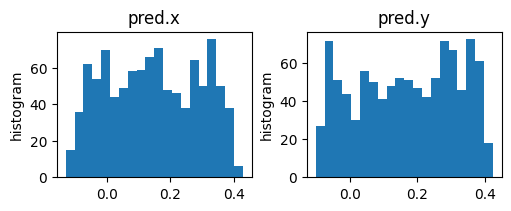

In [56]:
quick_show_preds(model, dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


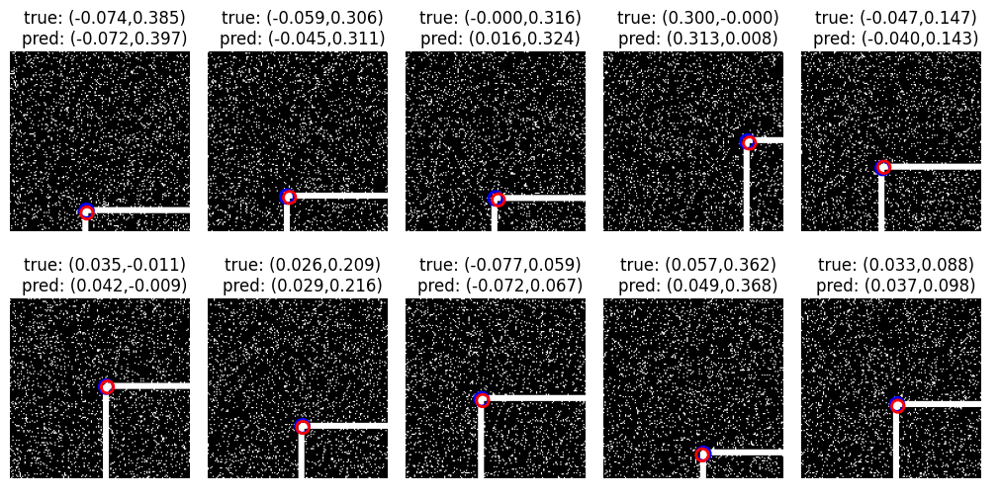

In [96]:
plot_dataset(train_data, model)

### CoordGrid-based with Positionwise MaxPool
CoordGrid provides global coordinates. This model injects a single CoordGrid at the input, and then passes it through via PositionWiseMaxPool.

Spatial information flow:
* Provides global and absolute fine-grained coordinates at first block.
* Subsequent blocks continue to select passed-through coordinate based on max feature location.
* The coordinates are only ever selected, never manipulated.

Variations:
* Drop semantic feature channels in last layer, because they're superfluous and likely to mess up the coordinate values.

Problems:
* No gradient flow for feature channels.
* Even if feature channels are included in output block via Dense layer, their meaning and purpose is vague.

Suggestions:
* Use "expected coordinates" instead of max-feature coordinates.
* Find some other way of giving the features meaning.

In [24]:
# With explicit tracking of position info
# - Global positioning via CoordGrid, initialised at start and forwarded through layers
# - note: if we take the final output directly from the coord channels then the gradients fail to get passed up
#   through the filters and the model doesn't train.
#   It appears that max-pool blocks the gradients.
#   In other words, it's ok to use conditionals, but:
#    - the conditional test doesn't have any gradients passed through it,
#    - gradients must still pass through the values through some other pathway.
#    - this suggests that a model based on expected-position would do better.
def coordconv_model(min_filters=4, max_filters=4096, include_final_features=False):
  def downscale(filters, inp):
    x = inp[..., :-2]
    coords = inp[..., -2:]
    channel_weights = [1]*(filters) + [0, 0]

    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Concatenate()([x, coords])
    x = PositionwiseMaxPool2D(pool_size=(2, 2), channel_weights=channel_weights)(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  filters = min_filters
  coords = CoordGrid2D()(x)
  x = layers.Concatenate()([x, coords])
  x = downscale(min(filters*1, max_filters), x)  # 74x74x4
  x = downscale(min(filters*2, max_filters), x)  # 37x37x8
  x = downscale(min(filters*4, max_filters), x)  # 18x18x16
  x = downscale(min(filters*8, max_filters), x)  # 9x9x32
  x = downscale(min(filters*16, max_filters), x) # 4x4x64
  x = downscale(min(filters*32, max_filters), x) # 2x2x128
  x = downscale(min(filters*32, max_filters), x) # 1x1x128
  x = layers.Flatten()(x)
  if include_final_features:
    x = layers.Dense(2, kernel_initializer='normal')(x)
  else:
    x = x[..., -2:] # take coords

  return tf.keras.Model(inputs=input, outputs=x)

coordconv_model().summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ coord_grid2d_7      │ (None, 149, 149,  │          0 │ input_layer_6[0]… │
│ (CoordGrid2D)       │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_33      │ (None, 149, 149,  │          0 │ input_layer_6[0]… │
│ (Concatenate)       │ 3)                │            │ coord_grid2d_7[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_43         │ (None, 149, 149,  │          0 │ concatenate_33[0… │
│ (GetItem)           │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_56 (Conv2D)  │ (None, 149, 149,  │         40 │ get_item_43[0][0] │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_57 (Conv2D)  │ (None, 149, 149,  │        148 │ conv2d_56[0][0]   │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_44         │ (None, 149, 149,  │          0 │ concatenate_33[0… │
│ (GetItem)           │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_34      │ (None, 149, 149,  │          0 │ conv2d_57[0][0],  │
│ (Concatenate)       │ 6)                │            │ get_item_44[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 74, 74, 6) │          0 │ concatenate_34[0… │
│ (PositionwiseMaxPo… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_45         │ (None, 74, 74, 4) │          0 │ positionwise_max… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_58 (Conv2D)  │ (None, 74, 74, 8) │        296 │ get_item_45[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_59 (Conv2D)  │ (None, 74, 74, 8) │        584 │ conv2d_58[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_46         │ (None, 74, 74, 2) │          0 │ positionwise_max… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_35      │ (None, 74, 74,    │          0 │ conv2d_59[0][0],  │
│ (Concatenate)       │ 10)               │            │ get_item_46[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 37, 37,    │          0 │ concatenate_35[0… │
│ (PositionwiseMaxPo… │ 10)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_47         │ (None, 37, 37, 8) │          0 │ positionwise_max… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_60 (Conv2D)  │ (None, 37, 37,    │      1,168 │ get_item_47[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 590,476 (2.25 MB)

 Trainable params: 590,476 (2.25 MB)

 Non-trainable params: 0 (0.00 B)

In [30]:
dataset = train_data.batch(32)
model = coordconv_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger(), tinstr.HistoryStats()])

Epoch     5 - 3.45s/epoch: loss: 0.0395  mae: 0.1614  
Epoch    10 - 494.99ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    15 - 434.36ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    20 - 496.61ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    25 - 410.72ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    30 - 407.79ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    35 - 417.87ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    40 - 415.54ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    45 - 480.02ms/epoch: loss: 0.0395  mae: 0.1614  
Epoch    50 - 422.61ms/epoch: loss: 0.0395  mae: 0.1614  
Total training time: 37.2 sec


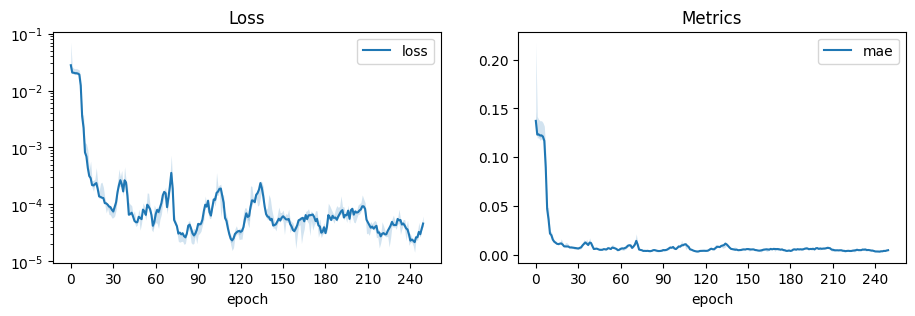

In [17]:
tinstr.plot_train_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


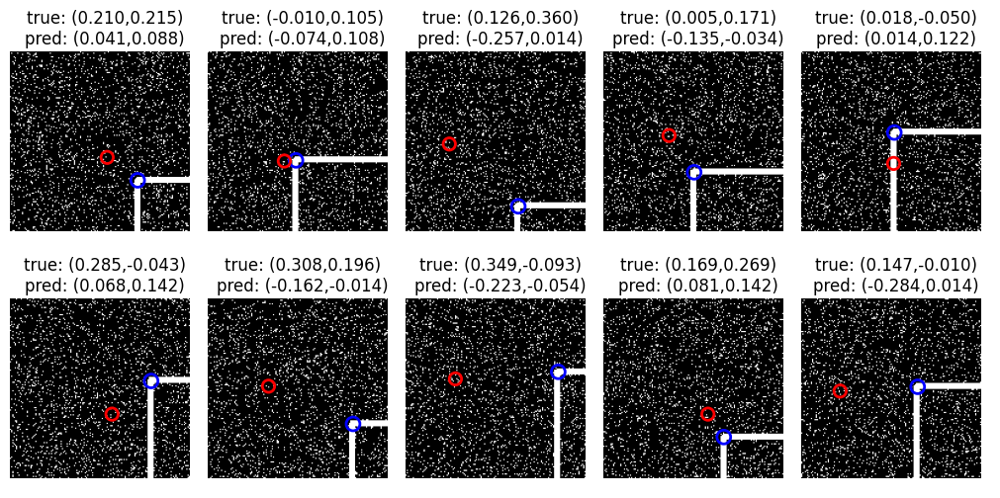

In [26]:
plot_dataset(train_data, model)

prediction:      [[ 0.04054058  0.08783787]
 [-0.07432431  0.1081081 ]
 [-0.25675675  0.01351351]
 [-0.13513511 -0.03378376]
 [ 0.01351351  0.12162161]]
all layers:      [TensorShape([5, 149, 149, 1]), TensorShape([5, 149, 149, 2]), TensorShape([5, 149, 149, 3]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 6]), TensorShape([5, 74, 74, 6]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 10]), TensorShape([5, 37, 37, 10]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 18]), TensorShape([5, 18, 18, 18]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 34]), TensorShape([5, 9, 9, 34]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 66]), TensorShape([5, 4, 4, 66]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 130]), TensorShape([5, 2, 2, 130]), TensorShape([5, 2, 2, 128]), T

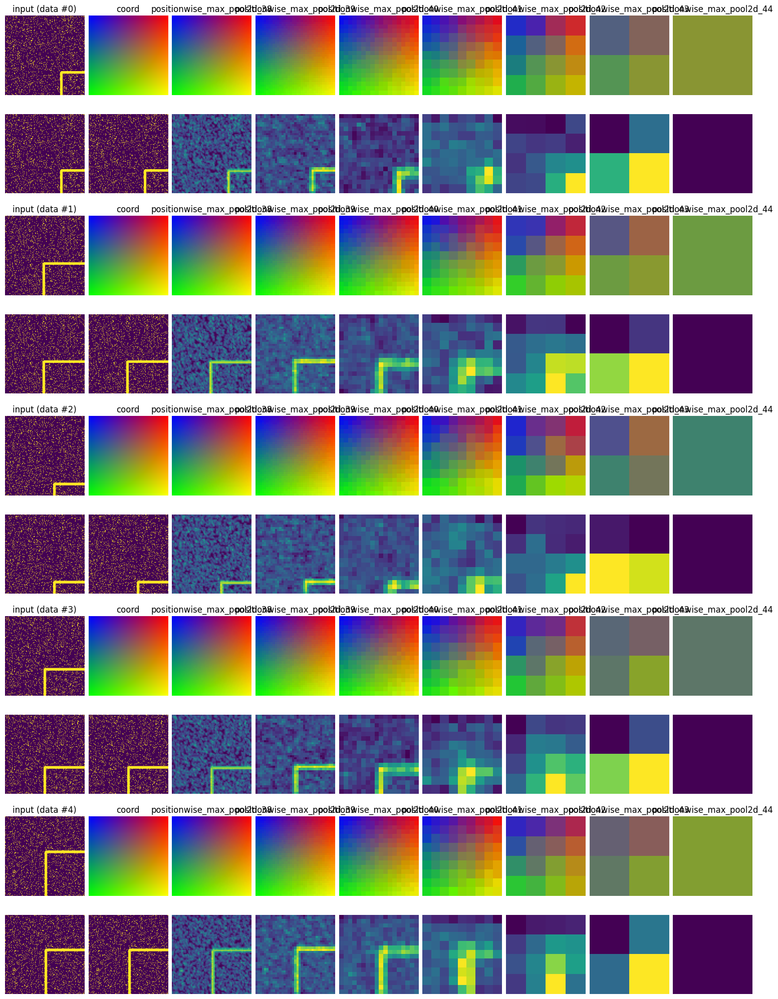

In [27]:
plot_layers(model, train_data, r'positionwise_.*', has_coord_layers=True, num=5)

prediction:      [[ 0.04054058  0.08783787]
 [-0.07432431  0.1081081 ]
 [-0.25675675  0.01351351]
 [-0.13513511 -0.03378376]
 [ 0.01351351  0.12162161]]
all layers:      [TensorShape([5, 149, 149, 1]), TensorShape([5, 149, 149, 2]), TensorShape([5, 149, 149, 3]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 6]), TensorShape([5, 74, 74, 6]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 10]), TensorShape([5, 37, 37, 10]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 18]), TensorShape([5, 18, 18, 18]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 34]), TensorShape([5, 9, 9, 34]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 66]), TensorShape([5, 4, 4, 66]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 130]), TensorShape([5, 2, 2, 130]), TensorShape([5, 2, 2, 128]), T

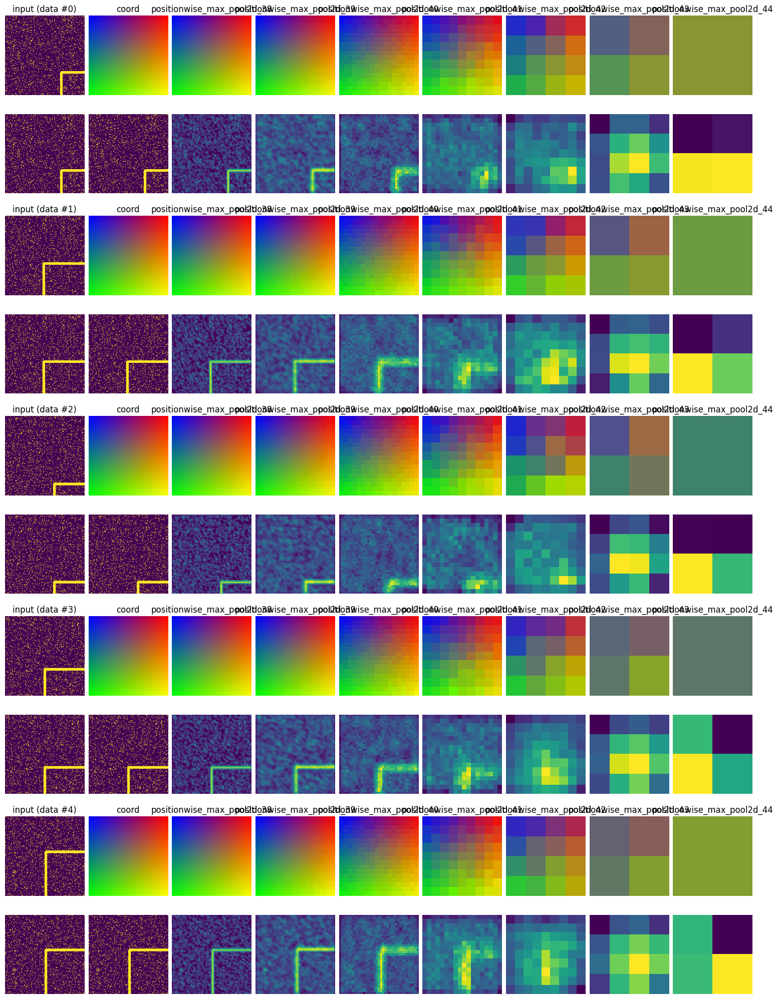

In [29]:
# plotting max features BEFORE spatial coord selection
def plot_layers2(model, dataset, layer_filter, has_coord_layers=False, num=1):
  layer_indices = index_layers_by_name_pattern(model, layer_filter)

  # prepare model
  monitoring_model = tf.keras.Model(
      inputs=tinstr._original_inputs(model),
      outputs=[model.outputs] + [layer.output for layer in model.layers])

  # do prediction
  dataset = dataset.take(num).batch(num)
  data = next(iter(dataset))[0]
  out = monitoring_model(data)
  prediction = out[0][0]
  layer_outputs = out[1:]
  print(f"prediction:      {prediction}")
  print(f"all layers:      {[t.shape for t in layer_outputs]}")
  print(f"filtered layers: {[layer_outputs[l_idx].shape for l_idx in layer_indices]}")

  coord_layer = None
  coord_grid_indices = index_layers_by_name_pattern(model, r'coord_grid2d_.*')
  if has_coord_layers and len(coord_grid_indices) > 0:
    coord_layer = layer_outputs[coord_grid_indices[0]]

  cols = 1+len(layer_indices)
  if coord_layer is not None:
    cols += 1
  rows = num*2 if has_coord_layers else num

  plt.figure(figsize=(15,2*rows), layout='constrained')

  for idx in range(num):
    row = idx*2 if has_coord_layers else idx
    col = 0
    plt.subplot(rows, cols, 1 + (row*cols) + col)
    plt.title(f"input (data #{idx})")
    plt.imshow(data[idx,:,:,0])
    plt.axis('off')

    if has_coord_layers:
      if coord_layer is not None:
        col += 1
        plt.subplot(rows, cols, 1 + (row*cols) + col)
        plt.title(f"coord")
        plt.imshow(coords_to_rgb(coord_layer[idx,:,:,-2:]))
        plt.axis('off')

      for l_idx in layer_indices:
        layer = model.layers[l_idx]
        layer_data = layer_outputs[l_idx]
        col += 1
        plt.subplot(rows, cols, 1 + (row*cols) + col)
        plt.title(f"{layer.name}")
        plt.imshow(coords_to_rgb(layer_data[idx,:,:,-2:]))
        plt.axis('off')

    row = (idx*2 + 1) if has_coord_layers else idx
    col = 0
    plt.subplot(rows, cols, 1 + (row*cols) + col)
    plt.imshow(data[idx,:,:,0])
    plt.axis('off')

    if coord_layer is not None:
      col += 1
      plt.subplot(rows, cols, 1 + (row*cols) + col)
      plt.imshow(flatten_channels(data[idx]))
      plt.axis('off')

    for l_idx in layer_indices:
      layer = model.layers[l_idx-1]
      layer_data = layer_outputs[l_idx-1]
      if has_coord_layers:
        layer_data = layer_data[..., :-2]
      col += 1
      plt.subplot(rows, cols, 1 + (row*cols) + col)
      plt.imshow(flatten_channels(layer_data[idx]))
      plt.axis('off')

plot_layers2(model, train_data, r'positionwise_.*', has_coord_layers=True, num=5)

### Global-feature context via UNet
In a conv model, each layer only has partial information, so it's hard to accurately select the coordinates because no layer has all the right information. This leads to an alternative idea, of using a UNet for identifying globally informed semantic features only, at full resolution, and then converting to coordinates.

This first attempt has an additional downscaling leg.

In [178]:
# CoordConv model with UNet for feature context
# With explicit tracking of position info
# - Explicitly retains position tracking
def coord_unet_model(min_filters=4, max_filters=4096):
  def feature_downscale(filters, inp):
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(inp)
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    skip = x
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    return x, skip

  def feature_upscale(filters, inp, skip):
    x = layers.Conv2DTranspose(filters, kernel_size=(2, 2), strides=2, padding='same')(inp)
    if x.shape[1] != skip.shape[1]:
      x = layers.ZeroPadding2D(padding=((0, 1), (0, 1)))(x)
    x = layers.Add()([x, skip])
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    return x

  def spatial_downscale(filters, inp):
    x = inp[..., :-2]
    coords = inp[..., -2:]
    channel_weights = [1]*(filters) + [0, 0]

    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Concatenate()([x, coords])
    x = PositionwiseMaxPool2D(pool_size=(2, 2), channel_weights=channel_weights)(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  filters = min_filters

  # Semantic UNet
  # 149x149x1 -> 1x1x128 + 2x2x128
  x, skip1 = feature_downscale(min(filters*1, max_filters), x)  # 74x74x4
  x, skip2 = feature_downscale(min(filters*2, max_filters), x)  # 37x37x8
  x, skip3 = feature_downscale(min(filters*4, max_filters), x)  # 18x18x16
  x, skip4 = feature_downscale(min(filters*8, max_filters), x)  # 9x9x32,  18x18x32
  x, skip5 = feature_downscale(min(filters*16, max_filters), x) # 4x4x64,  9x9x64
  x, skip6 = feature_downscale(min(filters*32, max_filters), x) # 2x2x128, 4x4x128
  x, skip7 = feature_downscale(min(filters*32, max_filters), x) # 1x1x128, 2x2x128

  # 1x1x128 + 2x2x128 -> 149x149x4
  x = feature_upscale(min(filters*32, max_filters), x, skip7) # 1x1x128 + 2x2x128 -> 2x2x128
  x = feature_upscale(min(filters*32, max_filters), x, skip6) # 2x2x128 + 4x4x128 -> 4x4x64
  x = feature_upscale(min(filters*16, max_filters), x, skip5) # 4x4x64  + 9x9x64  -> 9x9x32
  x = feature_upscale(min(filters*8, max_filters), x, skip4)
  x = feature_upscale(min(filters*4, max_filters), x, skip3)
  x = feature_upscale(min(filters*2, max_filters), x, skip2)
  x = feature_upscale(min(filters*1, max_filters), x, skip1) # -> 149x149x4

  # Spatial coord-conv net
  # 149x149x4 + 149x149x2 -> 1x1x128
  coords = CoordGrid2D()(x)
  x = layers.Concatenate()([x, coords])
  x = spatial_downscale(min(filters*1, max_filters), x)  # 74x74x4
  x = spatial_downscale(min(filters*2, max_filters), x)  # 37x37x8
  x = spatial_downscale(min(filters*4, max_filters), x)  # 18x18x16
  x = spatial_downscale(min(filters*8, max_filters), x)  # 9x9x32
  x = spatial_downscale(min(filters*16, max_filters), x) # 4x4x64
  x = spatial_downscale(min(filters*32, max_filters), x) # 2x2x128
  x = spatial_downscale(min(filters*32, max_filters), x) # 1x1x128

  # output
  # 1x1x128 -> 2
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

coord_unet_model().summary()

Model: "functional_98"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_44      │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_523 (Conv2D) │ (None, 149, 149,  │         40 │ input_layer_44[0… │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_524 (Conv2D) │ (None, 149, 149,  │        148 │ conv2d_523[0][0]  │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_150   │ (None, 74, 74, 4) │          0 │ conv2d_524[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_525 (Conv2D) │ (None, 74, 74, 8) │        296 │ max_pooling2d_15… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_526 (Conv2D) │ (None, 74, 74, 8) │        584 │ conv2d_525[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_151   │ (None, 37, 37, 8) │          0 │ conv2d_526[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_527 (Conv2D) │ (None, 37, 37,    │      1,168 │ max_pooling2d_15… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_528 (Conv2D) │ (None, 37, 37,    │      2,320 │ conv2d_527[0][0]  │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_152   │ (None, 18, 18,    │          0 │ conv2d_528[0][0]  │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_529 (Conv2D) │ (None, 18, 18,    │      4,640 │ max_pooling2d_15… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_530 (Conv2D) │ (None, 18, 18,    │      9,248 │ conv2d_529[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_153   │ (None, 9, 9, 32)  │          0 │ conv2d_530[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_531 (Conv2D) │ (None, 9, 9, 64)  │     18,496 │ max_pooling2d_15… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_532 (Conv2D) │ (None, 9, 9, 64)  │     36,928 │ conv2d_531[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_154   │ (None, 4, 4, 64)  │          0 │ conv2d_532[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_533 (Conv2D) │ (None, 4, 4, 128) │     73,856 │ max_pooling2d_15… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_534 (Conv2D) │ (None, 4, 4, 128) │    147,584 │ conv2d_533[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_155   │ (None, 2, 2, 128) │          0 │ conv2d_534[0][0]

 Total params: 2,045,214 (7.80 MB)

 Trainable params: 2,045,214 (7.80 MB)

 Non-trainable params: 0 (0.00 B)

In [179]:
dataset = train_data.batch(32)
model = coord_unet_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 8.02s/epoch: loss: 0.0019  mae: 0.0345  
Epoch    10 - 1.25s/epoch: loss: 0.0002  mae: 0.0119  
Epoch    15 - 1.25s/epoch: loss: 0.0002  mae: 0.0101  
Epoch    20 - 1.25s/epoch: loss: 0.0002  mae: 0.0104  
Epoch    25 - 1.22s/epoch: loss: 0.0001  mae: 0.0085  
Epoch    30 - 1.22s/epoch: loss: 0.0001  mae: 0.0088  
Epoch    35 - 1.19s/epoch: loss: 0.0002  mae: 0.0110  
Epoch    40 - 1.22s/epoch: loss: 0.0001  mae: 0.0057  
Epoch    45 - 1.18s/epoch: loss: 0.0000  mae: 0.0050  
Epoch    50 - 1.21s/epoch: loss: 0.0001  mae: 0.0060  
Total training time: 95.1 sec


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


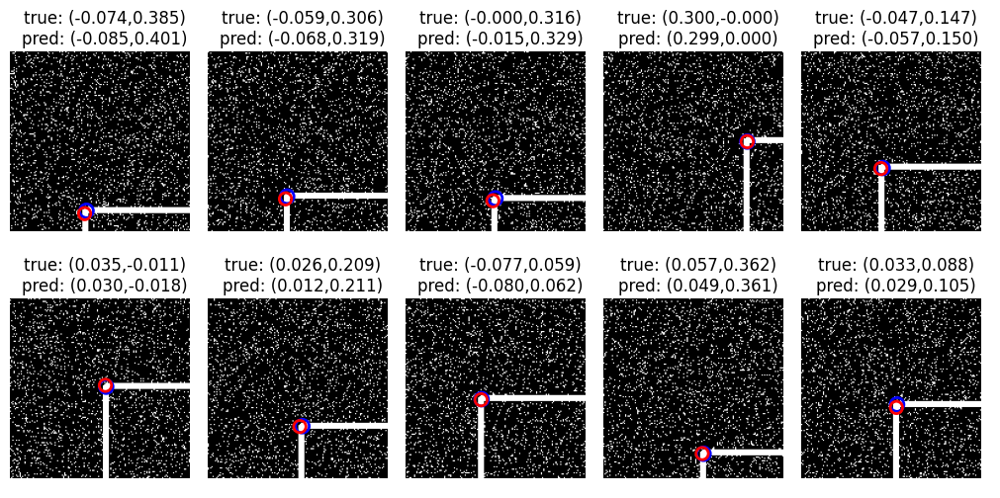

In [180]:
plot_dataset(train_data, model)

prediction:      [[-8.4680632e-02  4.0082926e-01]
 [-6.8022005e-02  3.1867200e-01]
 [-1.4779484e-02  3.2909876e-01]
 [ 2.9939482e-01  2.5764853e-04]
 [-5.7144068e-02  1.4995562e-01]]
all layers:      [TensorShape([5, 149, 149, 1]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 4]), TensorShape([5, 74, 74, 4]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 8]), TensorShape([5, 37, 37, 8]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 16]), TensorShape([5, 18, 18, 16]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 32]), TensorShape([5, 9, 9, 32]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 64]), TensorShape([5, 4, 4, 64]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 1, 1, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 2, 2, 128]), TensorShape([5, 4, 4, 128]), TensorSha

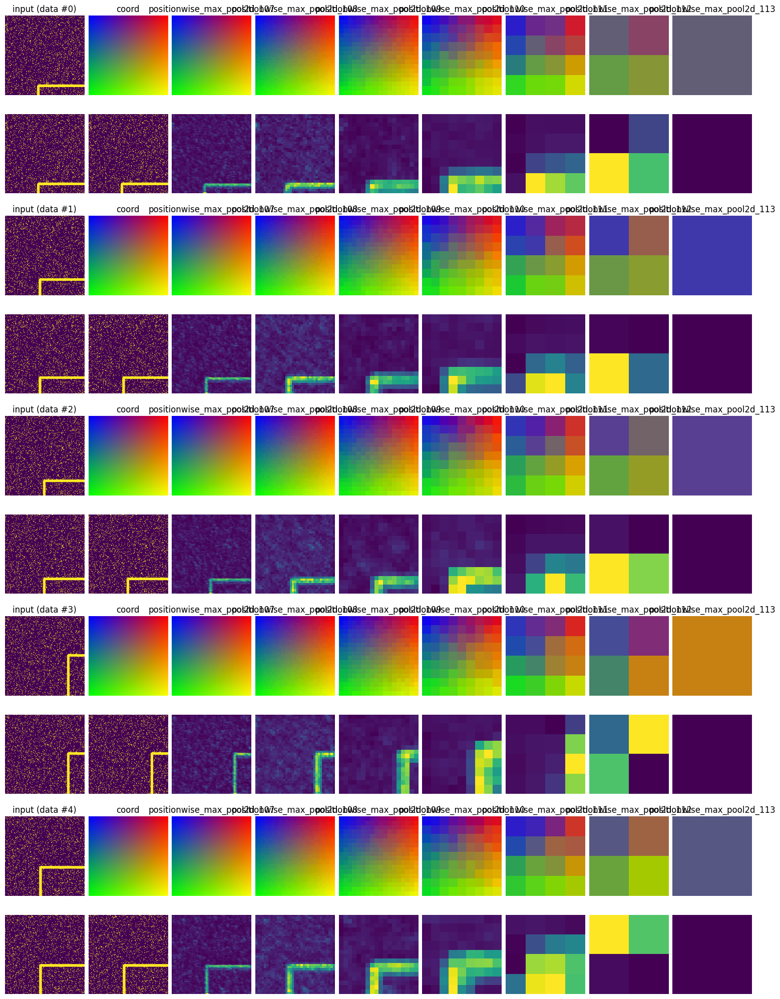

In [182]:
plot_layers(model, train_data, r'positionwise_.*', has_coord_layers=True, num=5)

### Global-feature context via Dilation
An alternative way to get a more global-ish semantic feature is to use the combination of a larger kernel plus dilation. This first one just uses a larger kernel to test out the basic idea -- does it improve on the accuracy?

Answer: it doesn't seem to.

In [183]:
# CoordConv model with larger kernels
# The efficient way to do this is to run multiple scales at the same time and then concatenate, eg:
#  - 3x3, 3x3xdilate2, 3x3xdilate4, 3x3xdilate8, concatenate, then pointwise-convolve
def dilated_coordconv_model(min_filters=4, max_filters=4096):
  def downscale(filters, inp):
    x = inp[..., :-2]
    coords = inp[..., -2:]
    channel_weights = [1]*(filters) + [0, 0]

    x = layers.Conv2D(filters, kernel_size=(7, 7), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Conv2D(filters, kernel_size=(7, 7), padding='same', activation='relu', kernel_initializer='he_uniform')(x)
    x = layers.Concatenate()([x, coords])
    x = PositionwiseMaxPool2D(pool_size=(2, 2), channel_weights=channel_weights)(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  filters = min_filters
  coords = CoordGrid2D()(x)
  x = layers.Concatenate()([x, coords])
  x = downscale(min(filters*1, max_filters), x)  # 74x74x4
  x = downscale(min(filters*2, max_filters), x)  # 37x37x8
  x = downscale(min(filters*4, max_filters), x)  # 18x18x16
  x = downscale(min(filters*8, max_filters), x)  # 9x9x32
  x = downscale(min(filters*16, max_filters), x) # 4x4x64
  x = downscale(min(filters*32, max_filters), x) # 2x2x128
  x = downscale(min(filters*32, max_filters), x) # 1x1x128
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

dilated_coordconv_model().summary()

Model: "functional_102"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_46      │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ coord_grid2d_41     │ (None, 149, 149,  │          0 │ input_layer_46[0… │
│ (CoordGrid2D)       │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_180     │ (None, 149, 149,  │          0 │ input_layer_46[0… │
│ (Concatenate)       │ 3)                │            │ coord_grid2d_41[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_56         │ (None, 149, 149,  │          0 │ concatenate_180[… │
│ (GetItem)           │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_607 (Conv2D) │ (None, 149, 149,  │        200 │ get_item_56[0][0] │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_608 (Conv2D) │ (None, 149, 149,  │        788 │ conv2d_607[0][0]  │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_57         │ (None, 149, 149,  │          0 │ concatenate_180[… │
│ (GetItem)           │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_181     │ (None, 149, 149,  │          0 │ conv2d_608[0][0], │
│ (Concatenate)       │ 6)                │            │ get_item_57[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 74, 74, 6) │          0 │ concatenate_181[… │
│ (PositionwiseMaxPo… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_58         │ (None, 74, 74, 4) │          0 │ positionwise_max… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_609 (Conv2D) │ (None, 74, 74, 8) │      1,576 │ get_item_58[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_610 (Conv2D) │ (None, 74, 74, 8) │      3,144 │ conv2d_609[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_59         │ (None, 74, 74, 2) │          0 │ positionwise_max… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_182     │ (None, 74, 74,    │          0 │ conv2d_610[0][0], │
│ (Concatenate)       │ 10)               │            │ get_item_59[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positionwise_max_p… │ (None, 37, 37,    │          0 │ concatenate_182[… │
│ (PositionwiseMaxPo… │ 10)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_60         │ (None, 37, 37, 8) │          0 │ positionwise_max… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_611 (Conv2D) │ (None, 37, 37,    │      6,288 │ get_item_60[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 3,211,698 (12.25 MB)

 Trainable params: 3,211,698 (12.25 MB)

 Non-trainable params: 0 (0.00 B)

In [184]:
dataset = train_data.batch(32)
model = dilated_coordconv_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 4.57s/epoch: loss: 0.0214  mae: 0.1270  
Epoch    10 - 829.97ms/epoch: loss: 0.0213  mae: 0.1266  
Epoch    15 - 866.00ms/epoch: loss: 0.0002  mae: 0.0101  
Epoch    20 - 940.71ms/epoch: loss: 0.0001  mae: 0.0075  
Epoch    25 - 1.03s/epoch: loss: 0.0001  mae: 0.0066  
Epoch    30 - 898.64ms/epoch: loss: 0.0001  mae: 0.0083  
Epoch    35 - 876.90ms/epoch: loss: 0.0000  mae: 0.0047  
Epoch    40 - 1.00s/epoch: loss: 0.0000  mae: 0.0044  
Epoch    45 - 905.81ms/epoch: loss: 0.0000  mae: 0.0054  
Epoch    50 - 912.54ms/epoch: loss: 0.0001  mae: 0.0063  
Total training time: 64.2 sec


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


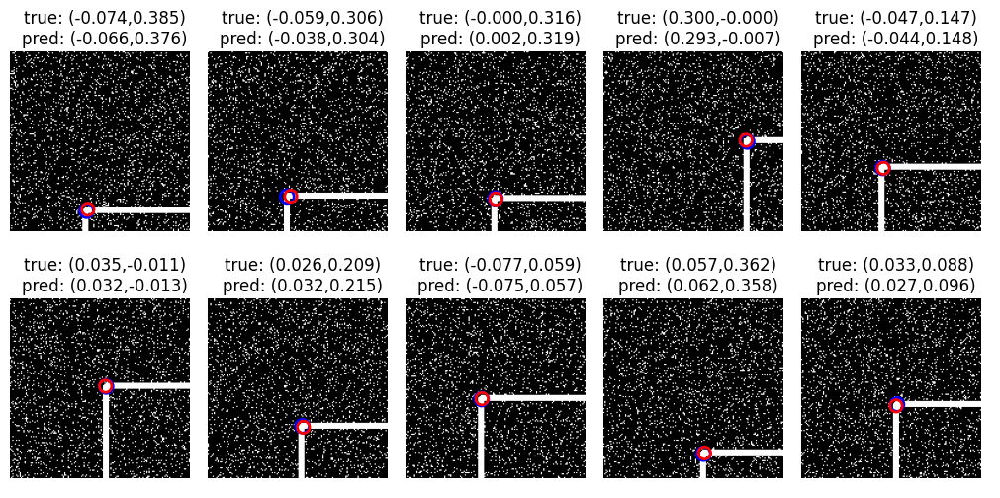

In [185]:
plot_dataset(train_data, model)

prediction:      [[-0.0664694   0.37642998]
 [-0.03832216  0.30401942]
 [ 0.00201185  0.31873918]
 [ 0.29295465 -0.00726222]
 [-0.04370098  0.14841971]]
all layers:      [TensorShape([5, 149, 149, 1]), TensorShape([5, 149, 149, 2]), TensorShape([5, 149, 149, 3]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 4]), TensorShape([5, 149, 149, 6]), TensorShape([5, 74, 74, 6]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 8]), TensorShape([5, 74, 74, 10]), TensorShape([5, 37, 37, 10]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 16]), TensorShape([5, 37, 37, 18]), TensorShape([5, 18, 18, 18]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 32]), TensorShape([5, 18, 18, 34]), TensorShape([5, 9, 9, 34]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 64]), TensorShape([5, 9, 9, 66]), TensorShape([5, 4, 4, 66]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 128]), TensorShape([5, 4, 4, 130]), TensorShape([5, 2, 2, 130]), TensorShape([5, 2, 2, 128]), T

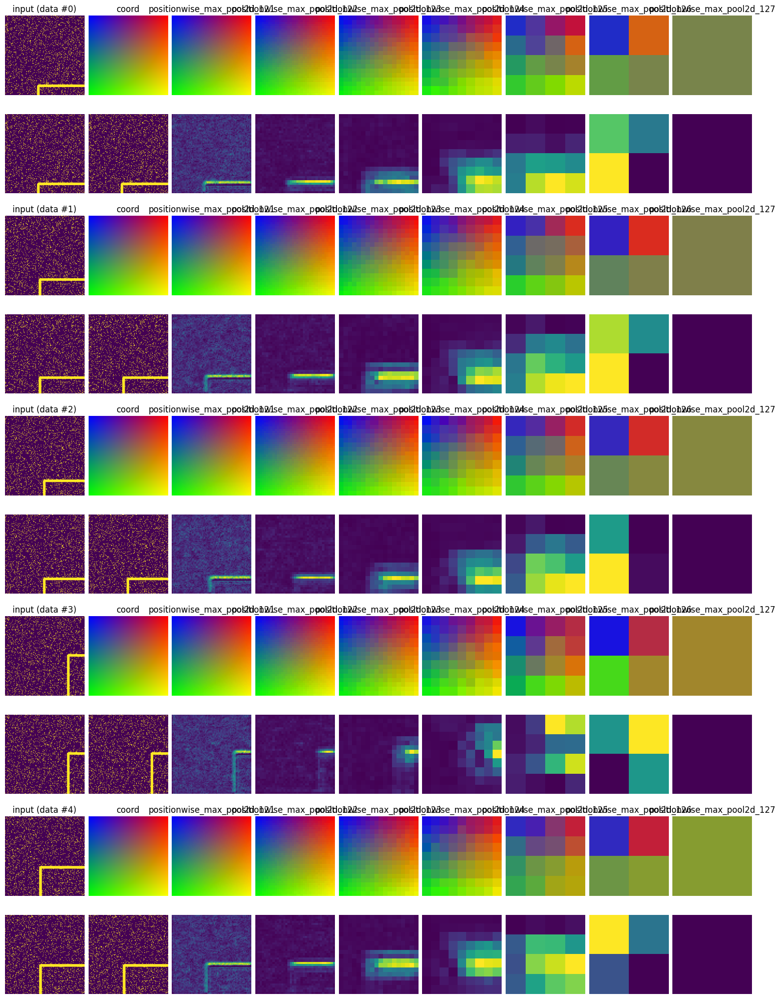

In [186]:
plot_layers(model, train_data, r'positionwise_.*', has_coord_layers=True, num=5)

### Global feature context via ResNet
Continuing the same ideas. Here I'm trying out the use of a ResNet architecture, to see if that makes any improvement.

The first variant is just a basic ResNet as a baseline.
Then there's a variant with spatial coordinates.

In [88]:
# Resnet version of baseline
# - Note: there are a few options for how to handle the downscaling of the skip connections.
#   The following is the description attributed to ShuffleNet: use an additive residual connection when input and output are of the same shape,
#   and use average pooling with concatenation when we down-sample the input spatially and double the output channels.
def resnet_model(min_filters=4, max_filters=4096):
  def downscale(filters, inp):
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', kernel_initializer='he_uniform')(inp)
    #x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)

    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', kernel_initializer='he_uniform')(x)
    #x = layers.BatchNormalization()(x)

    #skip = layers.Conv2D(filters, kernel_size=(1, 1), padding='same', kernel_initializer='he_uniform')(inp)
    #skip = layers.AveragePooling2D(pool_size=(2, 2))(skip)
    #x = layers.Add()([x, skip])

    skip = layers.AveragePooling2D(pool_size=(2, 2))(inp)
    x = layers.Concatenate()([x, skip])
    x = layers.Conv2D(filters, kernel_size=(1, 1), padding='same', kernel_initializer='he_uniform')(x)

    x = layers.Activation('relu')(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  # 149x149x1 -> 1x1x2
  filters = min_filters
  x = downscale(min(filters*1, max_filters), x)   # 74x74x4
  x = downscale(min(filters*2, max_filters), x)   # 37x37x8
  x = downscale(min(filters*4, max_filters), x)  # 18x18x16
  x = downscale(min(filters*8, max_filters), x)  # 9x9x32
  x = downscale(min(filters*16, max_filters), x)  # 4x4x64
  x = downscale(min(filters*32, max_filters), x) # 2x2x128
  x = downscale(min(filters*32, max_filters), x) # 1x1x128
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

resnet_model().summary()

Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_34      │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_342 (Conv2D) │ (None, 149, 149,  │         40 │ input_layer_34[0… │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_158      │ (None, 149, 149,  │          0 │ conv2d_342[0][0]  │
│ (Activation)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_101   │ (None, 74, 74, 4) │          0 │ activation_158[0… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_343 (Conv2D) │ (None, 74, 74, 4) │        148 │ max_pooling2d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ average_pooling2d_… │ (None, 74, 74, 1) │          0 │ input_layer_34[0… │
│ (AveragePooling2D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_106     │ (None, 74, 74, 5) │          0 │ conv2d_343[0][0], │
│ (Concatenate)       │                   │            │ average_pooling2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_344 (Conv2D) │ (None, 74, 74, 4) │         24 │ concatenate_106[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_159      │ (None, 74, 74, 4) │          0 │ conv2d_344[0][0]  │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_345 (Conv2D) │ (None, 74, 74, 8) │        296 │ activation_159[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_160      │ (None, 74, 74, 8) │          0 │ conv2d_345[0][0]  │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_102   │ (None, 37, 37, 8) │          0 │ activation_160[0… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_346 (Conv2D) │ (None, 37, 37, 8) │        584 │ max_pooling2d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ average_pooling2d_… │ (None, 37, 37, 4) │          0 │ activation_159[0… │
│ (AveragePooling2D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_107     │ (None, 37, 37,    │          0 │ conv2d_346[0][0], │
│ (Concatenate)       │ 12)               │            │ average_pooling2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_347 (Conv2D) │ (None, 37, 37, 8) │        104 │ concatenate_107[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_161      │ (None, 37, 37, 8) │          0 │ conv2d_347[0][0]  │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_348 (Conv2D) │ (None, 37, 37,    │      1,168 │ activation_161[0… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 656,638 (2.50 MB)

 Trainable params: 656,638 (2.50 MB)

 Non-trainable params: 0 (0.00 B)

In [91]:
dataset = train_data.batch(32)
model = resnet_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger(), tinstr.HistoryStats(per_step=True)])

Epoch     5 - 3.31s/epoch: loss: 0.0030  mae: 0.0429  
Epoch    10 - 310.94ms/epoch: loss: 0.0010  mae: 0.0255  
Epoch    15 - 310.08ms/epoch: loss: 0.0006  mae: 0.0194  
Epoch    20 - 296.15ms/epoch: loss: 0.0006  mae: 0.0197  
Epoch    25 - 492.22ms/epoch: loss: 0.0009  mae: 0.0246  
Epoch    30 - 295.74ms/epoch: loss: 0.0006  mae: 0.0189  
Epoch    35 - 295.28ms/epoch: loss: 0.0007  mae: 0.0206  
Epoch    40 - 293.56ms/epoch: loss: 0.0001  mae: 0.0091  
Epoch    45 - 293.01ms/epoch: loss: 0.0001  mae: 0.0073  
Epoch    50 - 293.58ms/epoch: loss: 0.0001  mae: 0.0068  
Total training time: 31.0 sec


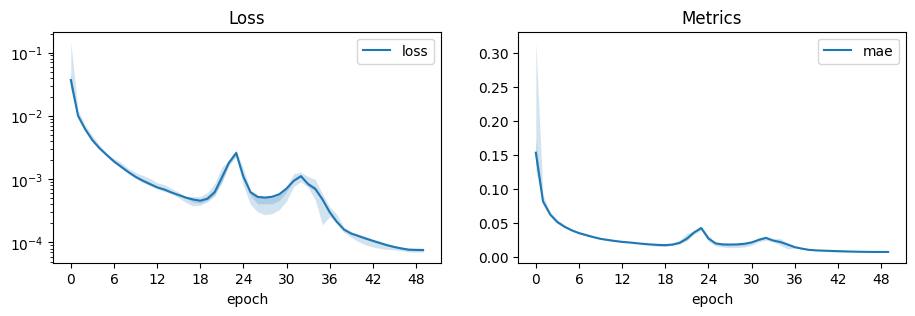

In [92]:
tinstr.plot_train_history(history)

In [93]:
# Spatial Resnet.
def spatial_resnet_model(min_filters=4, max_filters=4096):
  def downscale(filters, inp):
    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', kernel_initializer='he_uniform')(inp)
    #x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)

    x = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', kernel_initializer='he_uniform')(x)
    #x = layers.BatchNormalization()(x)

    #skip = layers.Conv2D(filters, kernel_size=(1, 1), padding='same', kernel_initializer='he_uniform')(inp)
    #skip = layers.AveragePooling2D(pool_size=(2, 2))(skip)
    #x = layers.Add()([x, skip])

    skip = layers.AveragePooling2D(pool_size=(2, 2))(inp)
    spatial = CoordGrid2D()(skip)
    x = layers.Concatenate()([x, skip, spatial])
    x = layers.Conv2D(filters, kernel_size=(1, 1), padding='same', kernel_initializer='he_uniform')(x)

    x = layers.Activation('relu')(x)
    return x

  input = tf.keras.Input(shape=(149, 149, 1))
  x = input

  # 149x149x1 -> 1x1x2
  filters = min_filters
  x = downscale(min(filters*1, max_filters), x)   # 74x74x4
  x = downscale(min(filters*2, max_filters), x)   # 37x37x8
  x = downscale(min(filters*4, max_filters), x)  # 18x18x16
  x = downscale(min(filters*8, max_filters), x)  # 9x9x32
  x = downscale(min(filters*16, max_filters), x)  # 4x4x64
  x = downscale(min(filters*32, max_filters), x) # 2x2x128
  x = downscale(min(filters*32, max_filters), x) # 1x1x128
  x = layers.Flatten()(x)
  x = layers.Dense(2, kernel_initializer='normal')(x)

  return tf.keras.Model(inputs=input, outputs=x)

spatial_resnet_model().summary()

Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_37      │ (None, 149, 149,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_405 (Conv2D) │ (None, 149, 149,  │         40 │ input_layer_37[0… │
│                     │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_200      │ (None, 149, 149,  │          0 │ conv2d_405[0][0]  │
│ (Activation)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_122   │ (None, 74, 74, 4) │          0 │ activation_200[0… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ average_pooling2d_… │ (None, 74, 74, 1) │          0 │ input_layer_37[0… │
│ (AveragePooling2D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_406 (Conv2D) │ (None, 74, 74, 4) │        148 │ max_pooling2d_12… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ coord_grid2d_23     │ (None, 74, 74, 2) │          0 │ average_pooling2… │
│ (CoordGrid2D)       │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_127     │ (None, 74, 74, 7) │          0 │ conv2d_406[0][0], │
│ (Concatenate)       │                   │            │ average_pooling2… │
│                     │                   │            │ coord_grid2d_23[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_407 (Conv2D) │ (None, 74, 74, 4) │         32 │ concatenate_127[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_201      │ (None, 74, 74, 4) │          0 │ conv2d_407[0][0]  │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_408 (Conv2D) │ (None, 74, 74, 8) │        296 │ activation_201[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_202      │ (None, 74, 74, 8) │          0 │ conv2d_408[0][0]  │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_123   │ (None, 37, 37, 8) │          0 │ activation_202[0… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ average_pooling2d_… │ (None, 37, 37, 4) │          0 │ activation_201[0… │
│ (AveragePooling2D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_409 (Conv2D) │ (None, 37, 37, 8) │        584 │ max_pooling2d_12… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ coord_grid2d_24     │ (None, 37, 37, 2) │          0 │ average_pooling2… │
│ (CoordGrid2D)       │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_128     │ (None, 37, 37,    │          0 │ conv2d_409[0][0], │
│ (Concatenate)       │ 14)               │            │ average_pooling2… │
│                     │                   │            │ coord_grid2d_24[… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 657,398 (2.51 MB)

 Trainable params: 657,398 (2.51 MB)

 Non-trainable params: 0 (0.00 B)

In [94]:
dataset = train_data.batch(32)
model = spatial_resnet_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch     5 - 5.95s/epoch: loss: 0.0019  mae: 0.0335  
Epoch    10 - 285.48ms/epoch: loss: 0.0005  mae: 0.0177  
Epoch    15 - 285.75ms/epoch: loss: 0.0003  mae: 0.0132  
Epoch    20 - 288.69ms/epoch: loss: 0.0004  mae: 0.0158  
Epoch    25 - 387.23ms/epoch: loss: 0.0002  mae: 0.0115  
Epoch    30 - 293.27ms/epoch: loss: 0.0001  mae: 0.0098  
Epoch    35 - 286.35ms/epoch: loss: 0.0008  mae: 0.0226  
Epoch    40 - 285.57ms/epoch: loss: 0.0005  mae: 0.0182  
Epoch    45 - 281.80ms/epoch: loss: 0.0002  mae: 0.0111  
Epoch    50 - 287.22ms/epoch: loss: 0.0003  mae: 0.0144  
Total training time: 43.2 sec


### Expected Coordinates
This model tries to use the "expected coordinates" idea, where semantic features are treated as attention and used to soft-select into the spatial grid. This model also takes some learnings and observations from earlier attempts:
* Spatial channels are kept separate from feature channels
* Feature channels have meaning and gradients via their soft-selection over spatial coords during downscaling operation
* Can optionally add coordinate only only once at the start or accumulate channels and combine via weighted sum at the end.

Problems:
* Very poor selective contrast in earlier layers leads to bland mean-centred coordinates.

In [79]:
# With explicit tracking of position info
# - "Expected Coordinates" model, with various configurable options
# - Runs two parallel streams of data: features and spatial coords
# - Features are passed through like for any typical CNN
# - Spatials are softmax-selected during pooling based on the features.
def expectedcoord_model(min_features=4, max_features=4096, always_add_coords=True, global_coords=False):
  """
  Args:
    - always_add_coords - whether to always add a new freshly populated coord grid at each block, or otherwise only at the start
    - global_coords - whether coord grids should be global (CoordGrid2D), or pool-local (StrideGrid2D)
  """
  def downscale(block_id, filters, features, spatials):
    # normal conv of semantic features
    features = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform', name=f"ft_conv2d_{block_id}a")(features)
    features = layers.Conv2D(filters, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform', name=f"ft_conv2d_{block_id}b")(features)

    # prepare spatial coords
    if spatials is None or always_add_coords:
      coords = CoordGrid2D(name=f"sp_coordgrid2d_{block_id}")(features) if global_coords else StrideGrid2D(name=f"sp_stridegrid2d_{block_id}")(features)
      if spatials is None:
        spatials = coords
      else:
        spatials = layers.Concatenate(name=f"sp_concat_{block_id}")([spatials, coords])

    # prepare spatial attention
    # - pointwise-conv to convert to appropriate number of channels for spatial selection
    # - plus also keeps spatial-attention independent from normal features so normal features can be conveyed through blocks more easily
    # - linear activation function as this will be fed into softmax, so we want negatives
    spatial_channels = spatials.shape[-1]
    attention = layers.Conv2D(spatial_channels, kernel_size=(1, 1), kernel_initializer='normal', name=f"attn_conv2d_{block_id}")(features)

    # downsampling
    # - normal max-pool for semantic features
    # - softmax-weighted mean for coords
    downsampled_features = layers.MaxPooling2D(pool_size=(2, 2), name=f"ft_maxpool2d_{block_id}")(features)
    downsampled_spatials = AttentionPool2D(pool_size=(2, 2), name=f"sp_attnpool2d_{block_id}")(attention, spatials)

    return downsampled_features, downsampled_spatials

  input = tf.keras.Input(shape=(149, 149, 1), name="input")
  features, spatials = input, None
  filters = min_features

  features, spatials = downscale(1, min(filters * 1, max_features), features, spatials)  # 74x74x4 + 74x74x2
  features, spatials = downscale(2, min(filters * 2, max_features), features, spatials)  # 37x37x8 + 37x37x4
  features, spatials = downscale(3, min(filters * 4, max_features), features, spatials)  # 18x18x16 + 18x18x6
  features, spatials = downscale(4, min(filters * 8, max_features), features, spatials)  # 9x9x32 + 9x9x8
  features, spatials = downscale(5, min(filters * 16, max_features), features, spatials) # 4x4x64 + 4x4x10
  features, spatials = downscale(6, min(filters * 32, max_features), features, spatials) # 2x2x128 + 2x2x12
  features, spatials = downscale(7, min(filters * 32, max_features), features, spatials) # 1x1x128 + 1x1x14  -- or 1x1x2 if not adding new coords each time
  out = layers.Flatten(name="out_flatten")(spatials)

  # combine spatials
  # - these are like multi-resolution coords that can now be merged via a simple linear combination
  if always_add_coords:
    out = layers.Dense(2, use_bias=False, kernel_initializer='normal', name="out_dense")(out)

  return tf.keras.Model(inputs=input, outputs=out)

expectedcoord_model().summary()

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 149, 149,  │          0 │ -                 │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_1a        │ (None, 149, 149,  │         40 │ input[0][0]       │
│ (Conv2D)            │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_1b        │ (None, 149, 149,  │        148 │ ft_conv2d_1a[0][… │
│ (Conv2D)            │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_maxpool2d_1      │ (None, 74, 74, 4) │          0 │ ft_conv2d_1b[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_2a        │ (None, 74, 74, 8) │        296 │ ft_maxpool2d_1[0… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_2b        │ (None, 74, 74, 8) │        584 │ ft_conv2d_2a[0][… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_maxpool2d_2      │ (None, 37, 37, 8) │          0 │ ft_conv2d_2b[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_3a        │ (None, 37, 37,    │      1,168 │ ft_maxpool2d_2[0… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_3b        │ (None, 37, 37,    │      2,320 │ ft_conv2d_3a[0][… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_maxpool2d_3      │ (None, 18, 18,    │          0 │ ft_conv2d_3b[0][… │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_4a        │ (None, 18, 18,    │      4,640 │ ft_maxpool2d_3[0… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ attn_conv2d_1       │ (None, 149, 149,  │         10 │ ft_conv2d_1b[0][… │
│ (Conv2D)            │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sp_stridegrid2d_1   │ (None, 149, 149,  │          0 │ ft_conv2d_1b[0][… │
│ (StrideGrid2D)      │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_conv2d_4b        │ (None, 18, 18,    │      9,248 │ ft_conv2d_4a[0][… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sp_attnpool2d_1     │ (None, 74, 74, 2) │          0 │ attn_conv2d_1[0]… │
│ (AttentionPool2D)   │                   │            │ sp_stridegrid2d_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sp_stridegrid2d_2   │ (None, 74, 74, 2) │          0 │ ft_conv2d_2b[0][… │
│ (StrideGrid2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ft_maxpool2d_4      │ (None, 9, 9, 32)  │          0 │ ft_conv2d_4b[0][

 Total params: 594,920 (2.27 MB)

 Trainable params: 594,920 (2.27 MB)

 Non-trainable params: 0 (0.00 B)

In [93]:
dataset = train_data.batch(32)
model = expectedcoord_model()
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(dataset, epochs=250, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger()])

Epoch    25 - 1.43s/epoch: loss: 0.0050  mae: 0.0567  
Epoch    50 - 501.60ms/epoch: loss: 0.0008  mae: 0.0219  
Epoch    75 - 504.25ms/epoch: loss: 0.0006  mae: 0.0188  
Epoch   100 - 510.26ms/epoch: loss: 0.0004  mae: 0.0155  
Epoch   125 - 499.78ms/epoch: loss: 0.0006  mae: 0.0196  
Epoch   150 - 496.08ms/epoch: loss: 0.0005  mae: 0.0169  
Epoch   175 - 507.99ms/epoch: loss: 0.0006  mae: 0.0191  
Epoch   200 - 495.54ms/epoch: loss: 0.0011  mae: 0.0261  
Epoch   225 - 511.81ms/epoch: loss: 0.0003  mae: 0.0143  
Epoch   250 - 499.37ms/epoch: loss: 0.0007  mae: 0.0193  
Total training time: 148.8 sec


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


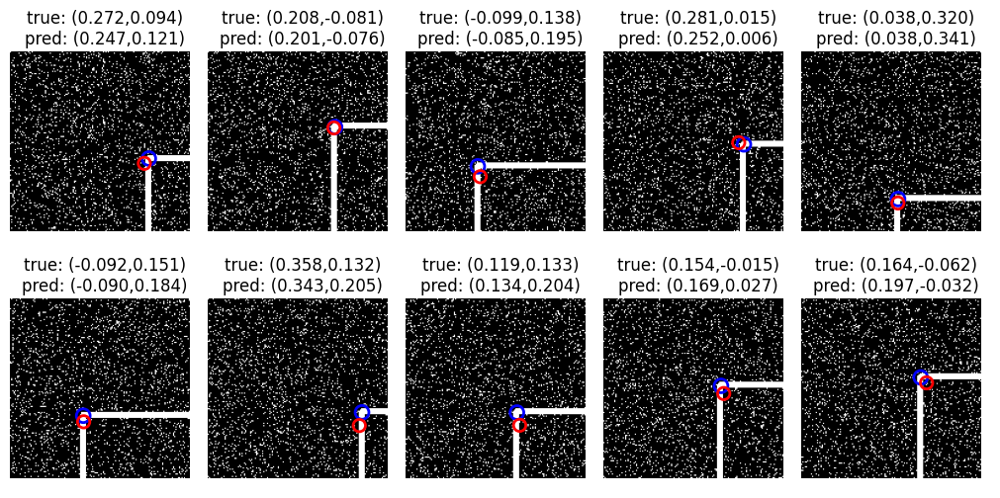

In [94]:
plot_dataset(train_data, model)

prediction:      [[0.24698669 0.12108579]]
all layers:      [TensorShape([1, 149, 149, 1]), TensorShape([1, 149, 149, 4]), TensorShape([1, 149, 149, 4]), TensorShape([1, 74, 74, 4]), TensorShape([1, 74, 74, 8]), TensorShape([1, 74, 74, 8]), TensorShape([1, 37, 37, 8]), TensorShape([1, 37, 37, 16]), TensorShape([1, 37, 37, 16]), TensorShape([1, 18, 18, 16]), TensorShape([1, 18, 18, 32]), TensorShape([1, 149, 149, 2]), TensorShape([1, 149, 149, 2]), TensorShape([1, 18, 18, 32]), TensorShape([1, 74, 74, 2]), TensorShape([1, 74, 74, 2]), TensorShape([1, 9, 9, 32]), TensorShape([1, 74, 74, 4]), TensorShape([1, 74, 74, 4]), TensorShape([1, 9, 9, 64]), TensorShape([1, 37, 37, 4]), TensorShape([1, 37, 37, 2]), TensorShape([1, 9, 9, 64]), TensorShape([1, 37, 37, 6]), TensorShape([1, 37, 37, 6]), TensorShape([1, 4, 4, 64]), TensorShape([1, 18, 18, 6]), TensorShape([1, 18, 18, 2]), TensorShape([1, 4, 4, 128]), TensorShape([1, 18, 18, 8]), TensorShape([1, 18, 18, 8]), TensorShape([1, 4, 4, 128]), 

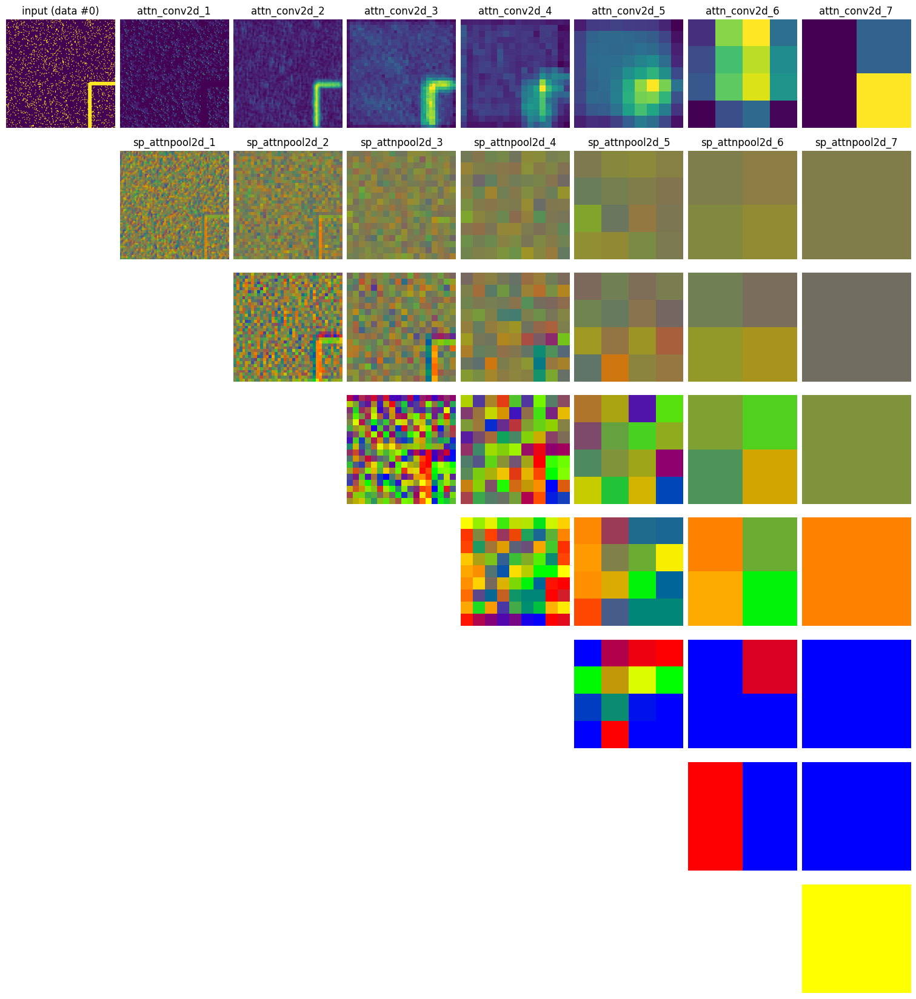

In [95]:
def plot_spatial_layers(model, dataset, feature_filter=r'attn_conv2d_.*', coord_filter=r'sp_attnpool2d_.*', num=1):
    # prepare model
    monitoring_model = tf.keras.Model(
        inputs=tinstr._original_inputs(model),
        outputs=[model.outputs] + [layer.output for layer in model.layers])

    # do prediction
    dataset = dataset.take(num).batch(num)
    data = next(iter(dataset))[0]
    out = monitoring_model(data)
    prediction = out[0][0]
    layer_outputs = out[1:]
    print(f"prediction:      {prediction}")
    print(f"all layers:      {[t.shape for t in layer_outputs]}")
    print(f"filtered layers: {[layer_outputs[l_idx].shape for l_idx in layer_indices]}")

    feature_layer_indices = index_layers_by_name_pattern(model, feature_filter)
    coord_layer_indices = index_layers_by_name_pattern(model, coord_filter)
    max_channels = max([layer_outputs[l_idx].shape[-1] for l_idx in coord_layer_indices])

    cols = 1 + max(len(feature_layer_indices), len(coord_layer_indices))
    rows = num * (1+max_channels)
    plt.figure(figsize=(15, 2 * rows), layout='constrained')

    for idx in range(num):
        row = idx * (1+max_channels)
        col = 0
        plt.subplot(rows, cols, 1 + (row * cols) + col)
        plt.title(f"input (data #{idx})")
        plt.imshow(data[idx, :, :, 0])
        plt.axis('off')

        # feature layers
        col = 0
        for l_idx in feature_layer_indices:
            layer = model.layers[l_idx]
            layer_data = layer_outputs[l_idx]
            col += 1
            plt.subplot(rows, cols, 1 + (row * cols) + col)
            plt.title(f"{layer.name}")
            plt.imshow(flatten_channels(layer_data[idx], reduction='pos-norm'))
            plt.axis('off')

        # coordinate layers
        col = 0
        for l_idx in layer_indices:
            layer = model.layers[l_idx]
            layer_data = layer_outputs[l_idx]
            col += 1

            for channel in range(0, layer_data.shape[-1], 2):
                this_row = row + 1 + channel//2
                plt.subplot(rows, cols, 1 + (this_row * cols) + col)
                if channel == 0:
                    plt.title(f"{layer.name}")
                plt.imshow(coords_to_rgb(layer_data[idx, :, :, channel:(channel+2)]))
                plt.axis('off')

plot_spatial_layers(model, train_data)

In [67]:
def get_layer_outputs(model, dataset, num=1):
  """
  Returns:
    model_output, [layer_outputs]
  """

  # prepare model
  monitoring_model = tf.keras.Model(
      inputs=tinstr._original_inputs(model),
      outputs=[model.outputs] + [layer.output for layer in model.layers])

  # do prediction
  dataset = dataset.take(num).batch(num)
  data = next(iter(dataset))[0]
  out = monitoring_model(data)
  model_output = out[0][0]
  layer_outputs = out[1:]

  return model_output, layer_outputs

model_output, layer_outputs = get_layer_outputs(model, train_data)
layer_indices = index_layers_by_name_pattern(model, r'attention_pool2d_.*')